In [134]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, MinMaxScaler
import warnings
from imblearn.over_sampling import SMOTE
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
import tensorflow.compat.v1 as tf
from tensorflow.compat.v1.keras import layers
from tensorflow.compat.v1.keras.models import Sequential, Model
from tensorflow.compat.v1.keras.layers import Input, Dense
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from tensorflow.compat.v1.keras.callbacks import EarlyStopping
from tensorflow.compat.v1 import keras
%matplotlib inline
import shap
from sklearn.metrics import roc_curve, roc_auc_score

In [135]:
data = pd.read_csv("C:/Users/HP/Desktop/diabetes_prediction_dataset.csv")
data.head(3)
reserved_data = data

In [136]:
reserved_data.duplicated().sum()

3854

In [137]:
data['age'] = data['age'].astype('int')

In [138]:
data = data.drop_duplicates(ignore_index= True)

# DATA CLEANING AND PREPROCESSING

In [139]:
column = ['smoking_history']
one_hot_encoder = OneHotEncoder(sparse = True, dtype = 'int')
feature_columns = one_hot_encoder.fit_transform(data[column]).toarray()

In [140]:
encoded_data = pd.DataFrame(feature_columns, columns = one_hot_encoder.get_feature_names_out())

In [141]:
gender = ['gender']
gender_columns = one_hot_encoder.fit_transform(data[gender]).toarray()

In [142]:
encoded_dataset = pd.DataFrame(gender_columns, columns = one_hot_encoder.get_feature_names_out())

In [143]:
encoded_data['smoking_history_never smoked'] = (encoded_data['smoking_history_never'] + encoded_data['smoking_history_No Info']).astype('int')
encoded_data['smoking_history_smoked before'] = (encoded_data['smoking_history_former'] + encoded_data['smoking_history_not current']).astype('int')
encoded_data['smoking_history_smoking'] = (encoded_data['smoking_history_ever'] + encoded_data['smoking_history_current']).astype('int')
encoded_data = encoded_data.drop(columns = ['smoking_history_current', 'smoking_history_ever', 'smoking_history_not current', 'smoking_history_former', 'smoking_history_No Info','smoking_history_never'], axis = 1)

In [144]:
encoded_dataset['gender_female'] = (encoded_dataset['gender_Female']).astype('int')
encoded_dataset['gender_male'] = (encoded_dataset['gender_Male']).astype('int')
encoded_dataset['other'] = (encoded_dataset['gender_Other']).astype('int')
encoded_dataset = encoded_dataset.drop(columns = ['gender_Female', 'gender_Male', 'gender_Other', 'other'], axis = 1)

In [145]:
data = data.drop(columns = ["smoking_history", "gender"])

In [146]:
data = pd.concat([data, encoded_data, encoded_dataset], axis = 1)

data = data[[col for col in data.columns if col != 'diabetes'] + ['diabetes']]

In [147]:
data.to_csv("Transformed Data", index= None)

# EXPLORATORY DATA ANALYSIS

In [148]:
data.describe()

,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,smoking_history_never smoked,smoking_history_smoked before,smoking_history_smoking,gender_female,gender_male,diabetes
count,96112.000000,96112.000000,96112.000000,96112.000000,96112.000000,96112.000000,96112.000000,96112.000000,96112.000000,96112.000000,96112.000000,96112.000000
mean,41.798287,0.077628,0.040817,27.321923,5.532618,138.221013,0.699715,0.162997,0.137288,0.584131,0.415682,0.088251
std,22.472901,0.267587,0.197867,6.768534,1.073288,40.911287,0.458384,0.369365,0.344153,0.492874,0.492842,0.283661
min,0.000000,0.000000,0.000000,10.010000,3.500000,80.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,24.000000,0.000000,0.000000,23.400000,4.800000,100.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,43.000000,0.000000,0.000000,27.320000,5.800000,140.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000
75%,59.000000,0.000000,0.000000,29.860000,6.200000,159.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000
max,80.000000,1.000000,1.000000,95.690000,9.000000,300.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [149]:
missing_values_count = data.isnull().sum()
for column, count in missing_values_count.items():
    print(f'The total number of empty values in {column} is {count}.')

The total number of empty values in age is 0.
The total number of empty values in hypertension is 0.
The total number of empty values in heart_disease is 0.
The total number of empty values in bmi is 0.
The total number of empty values in HbA1c_level is 0.
The total number of empty values in blood_glucose_level is 0.
The total number of empty values in smoking_history_never smoked is 0.
The total number of empty values in smoking_history_smoked before is 0.
The total number of empty values in smoking_history_smoking is 0.
The total number of empty values in gender_female is 0.
The total number of empty values in gender_male is 0.
The total number of empty values in diabetes is 0.


In [150]:
unique_details = {columns: len(data[columns].unique()) for columns in data.columns}
for key, value in unique_details.items():
    print(f'The number of unique values in {key} is {value}.' )

The number of unique values in age is 81.
The number of unique values in hypertension is 2.
The number of unique values in heart_disease is 2.
The number of unique values in bmi is 4247.
The number of unique values in HbA1c_level is 18.
The number of unique values in blood_glucose_level is 18.
The number of unique values in smoking_history_never smoked is 2.
The number of unique values in smoking_history_smoked before is 2.
The number of unique values in smoking_history_smoking is 2.
The number of unique values in gender_female is 2.
The number of unique values in gender_male is 2.
The number of unique values in diabetes is 2.


In [151]:
numerical_features = [feature for feature in data.columns if data[feature].dtypes != 'O']
print("The number of numerical features is",len(numerical_features),"and they are : \n",numerical_features)

The number of numerical features is 12 and they are : 
 ['age', 'hypertension', 'heart_disease', 'bmi', 'HbA1c_level', 'blood_glucose_level', 'smoking_history_never smoked', 'smoking_history_smoked before', 'smoking_history_smoking', 'gender_female', 'gender_male', 'diabetes']


In [152]:
#discrete numerical features 
discrete_feature = [feature for feature in numerical_features if data[feature].nunique()<=15]
print("The number of discrete features is",len(discrete_feature),"and they are : \n",discrete_feature)

The number of discrete features is 8 and they are : 
 ['hypertension', 'heart_disease', 'smoking_history_never smoked', 'smoking_history_smoked before', 'smoking_history_smoking', 'gender_female', 'gender_male', 'diabetes']


In [153]:
continuous_feature=[feature for feature in numerical_features if feature not in discrete_feature]
print("The number of continuous_feature features is",len(continuous_feature),"and they are : \n",continuous_feature)

The number of continuous_feature features is 4 and they are : 
 ['age', 'bmi', 'HbA1c_level', 'blood_glucose_level']


# DATA VISUALIZATION

In [154]:
def countplot_distribution(col):
    sns.set_theme(style="darkgrid")
    sns.countplot(y=col, data=data).set(title = 'Distribution of ' + col)

def histplot_distribution(col):
    sns.set_theme(style="darkgrid")
    sns.histplot(data=data,x=col, kde=True,color="red").set(title = 'Distribution of ' + col)

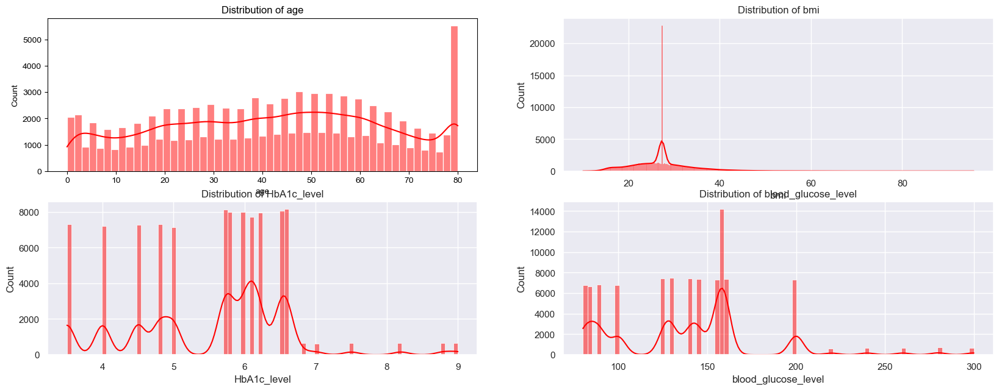

In [23]:
#Analyzing the continuous values by creating histograms to understand the distribution
f = plt.figure(figsize=(20,15))
for i in range(len(continuous_feature)):
    f.add_subplot(len(continuous_feature), 2, i+1)
    histplot_distribution(continuous_feature[i])
plt.show()

,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,smoking_history_never smoked,smoking_history_smoked before,smoking_history_smoking,gender_female,gender_male,diabetes
age,1.000000,0.257189,0.238353,0.345242,0.106750,0.114232,-0.231919,0.224423,0.068034,0.028841,-0.028636,0.264806
hypertension,0.257189,1.000000,0.119963,0.148101,0.081449,0.084828,-0.070879,0.064097,0.025613,-0.014137,0.014249,0.195684
heart_disease,0.238353,0.119963,1.000000,0.061366,0.068147,0.070829,-0.085117,0.079519,0.028025,-0.078474,0.078558,0.170692
bmi,0.345242,0.148101,0.061366,1.000000,0.084398,0.092565,-0.145124,0.113169,0.071835,0.023474,-0.023479,0.214926
HbA1c_level,0.106750,0.081449,0.068147,0.084398,1.000000,0.171583,-0.036316,0.035901,0.009839,-0.019845,0.019891,0.406463
blood_glucose_level,0.114232,0.084828,0.070829,0.092565,0.171583,1.000000,-0.040398,0.037578,0.013476,-0.017784,0.017774,0.424381
smoking_history_never smoked,-0.231919,-0.070879,-0.085117,-0.145124,-0.036316,-0.040398,1.000000,-0.673629,-0.608943,0.046312,-0.046149,-0.092261
smoking_history_smoked before,0.224423,0.064097,0.079519,0.113169,0.035901,0.037578,-0.673629,1.000000,-0.176039,-0.031148,0.030860,0.089122
smoking_history_smoking,0.068034,0.025613,0.028025,0.071835,0.009839,0.013476,-0.608943,-0.176039,1.000000,-0.028254,0.028346,0.027234
gender_female,0.028841,-0.014137,-0.078474,0.023474,-0.019845,-0.017784,0.046312,-0.031148,-0.028254,1.000000,-0.999615,-0.037776


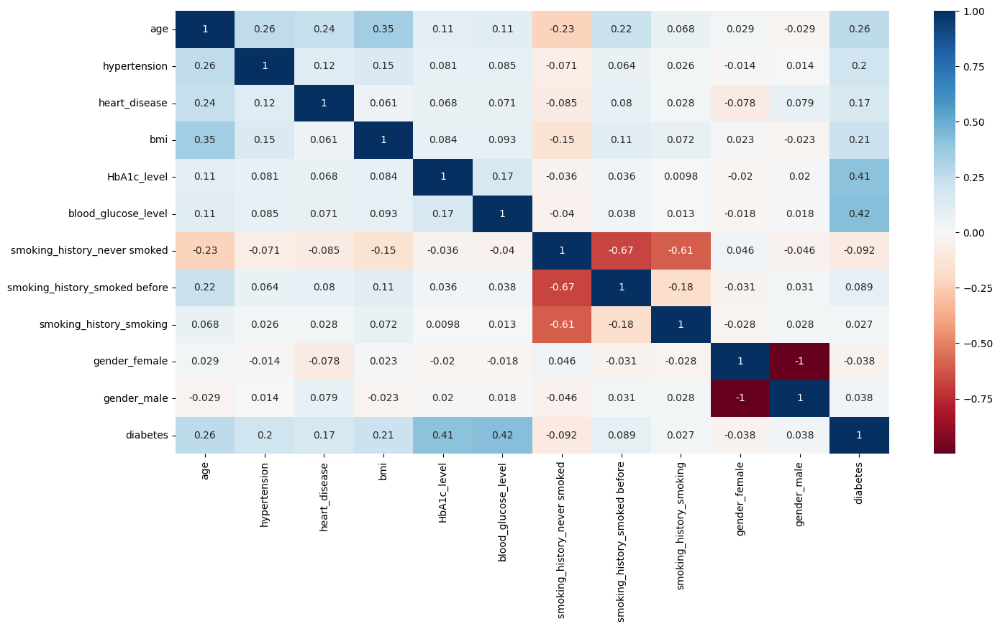

In [155]:
corr = data.corr()
plt.figure(figsize= [16, 8])
sns.heatmap(corr, cmap = plt.cm.RdBu, annot= True)

corr

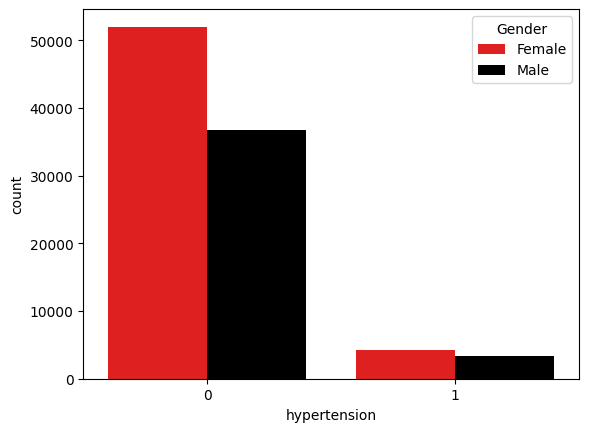

In [105]:
sns.countplot(x = 'hypertension', hue = ('gender_male'), data = data, palette= ('red', 'black', 'green'))
plt.legend(title = "Gender", labels = ['Female', 'Male']);

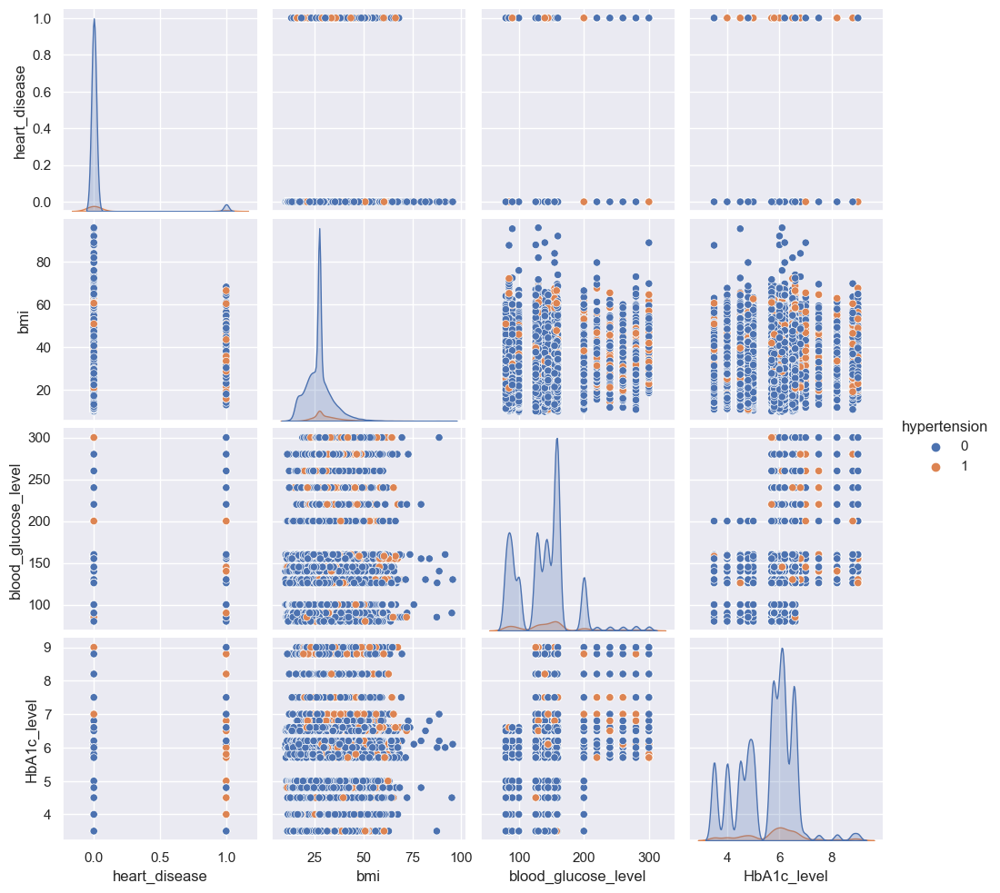

In [26]:
sns.pairplot(data, hue = 'hypertension', vars =['heart_disease', 'bmi', 'blood_glucose_level', 'HbA1c_level']);

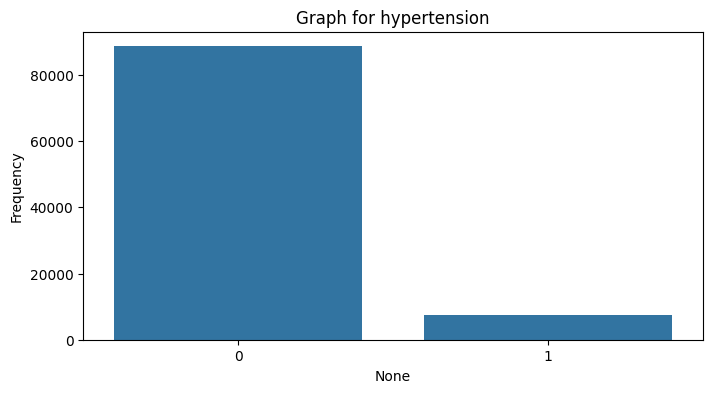

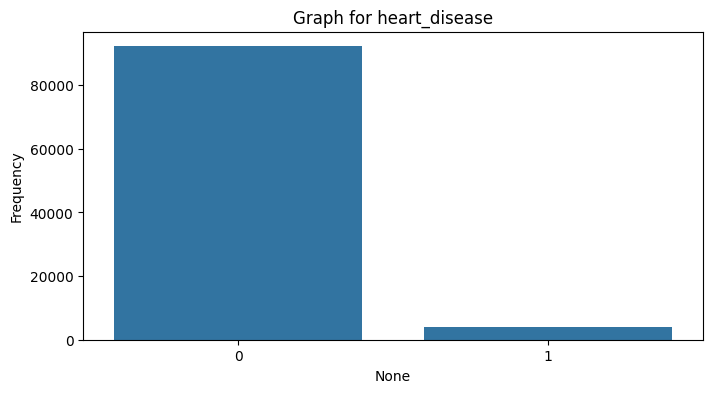

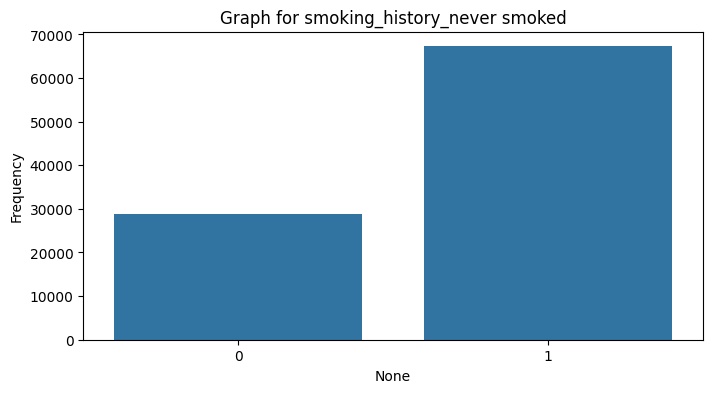

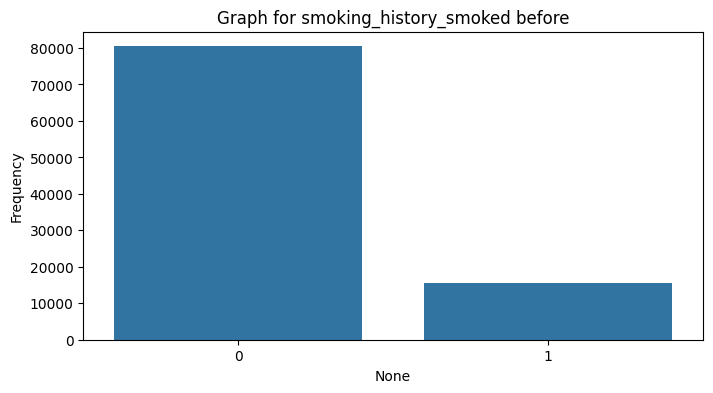

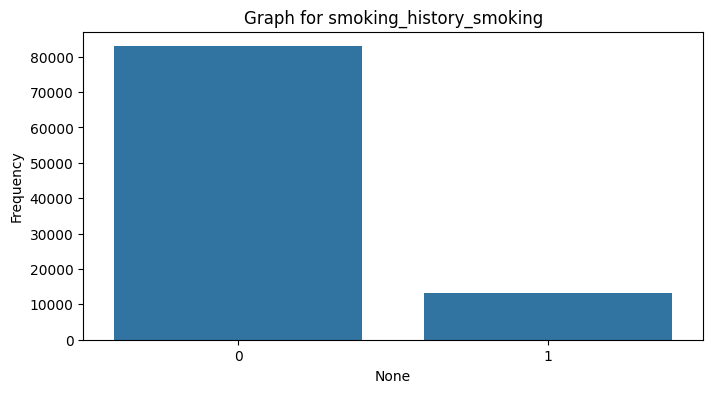

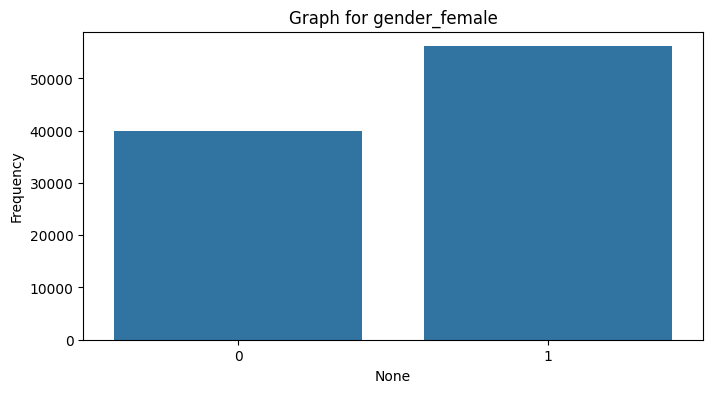

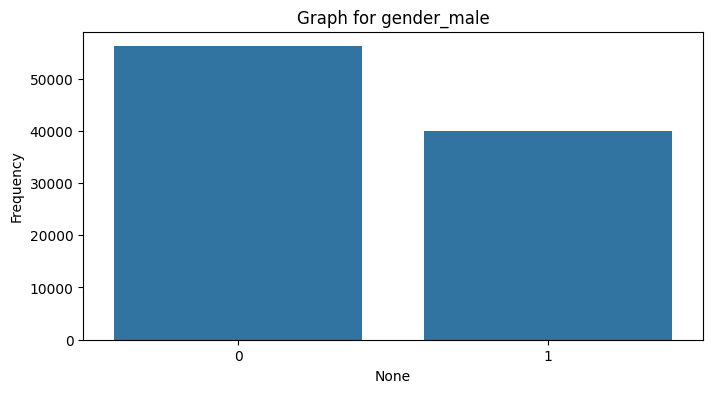

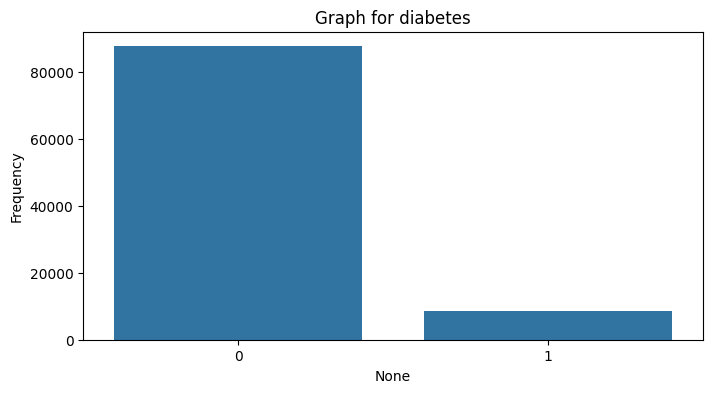

In [156]:
for feature in discrete_feature:
    plt.figure(figsize=(8,4))
    cat_num = data[feature].value_counts()
    sns.barplot(x=cat_num.index, y = cat_num).set(title = "Graph for "+feature, ylabel="Frequency")
    plt.show()

In [157]:
# Separating features and target variable
X = data.drop('diabetes', axis=1)
Y = data['diabetes']

# Standardize the features
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)


X_train, X_test, Y_train, Y_test = train_test_split(X_scaled, Y, test_size=0.2, random_state=42)

# Use SMOTE to handle class imbalance
smote = SMOTE(random_state=42)
X_resampled, Y_resampled = smote.fit_resample(X_train, Y_train)

# FEATURES EXTRACTION

In [ ]:
(Actual - Predicted)/n

In [158]:
# Build AutoEncoder model
input_dim = X_train.shape[1]
encoding_dim = 8
autoencoder = keras.Sequential([
    layers.Input(shape=(input_dim,)),
    layers.Dense(encoding_dim, activation='relu'),
    layers.Dense(input_dim, activation='sigmoid')
])

autoencoder.compile(optimizer='adam', loss='mean_squared_error')

# Train the AutoEncoder
autoencoder_training= autoencoder.fit(X_resampled, X_resampled, epochs=30, batch_size=120, shuffle=True, validation_data=(X_test, X_test))

# Use the encoder part as the feature extractor
encoder = keras.Model(inputs= autoencoder.input, outputs=autoencoder.layers[1].output)
X_train_encoded = encoder.predict(X_resampled)
X_test_encoded = encoder.predict(X_test)



Epoch 1/30

1169/1169 [==============================] - 4s 2ms/step - loss: 0.0662 - val_loss: 0.0165
Epoch 2/30
1169/1169 [==============================] - 3s 2ms/step - loss: 0.0099 - val_loss: 0.0034
Epoch 3/30
1169/1169 [==============================] - 3s 2ms/step - loss: 0.0026 - val_loss: 0.0017
Epoch 4/30
1169/1169 [==============================] - 3s 2ms/step - loss: 0.0020 - val_loss: 0.0015
Epoch 5/30
1169/1169 [==============================] - 3s 2ms/step - loss: 0.0019 - val_loss: 0.0015
Epoch 6/30
1169/1169 [==============================] - 3s 3ms/step - loss: 0.0018 - val_loss: 0.0014
Epoch 7/30
1169/1169 [==============================] - 2s 2ms/step - loss: 0.0018 - val_loss: 0.0014
Epoch 8/30
1169/1169 [==============================] - 2s 2ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 9/30
1169/1169 [==============================] - 2s 2ms/step - loss: 0.0014 - val_loss: 8.9022e-04
Epoch 10/30
1169/1169 [==============================] - 3s 2ms/step - loss

# HYPERPARAMETER OPTIMISATION

In [159]:
from hyperopt import hp, tpe, fmin, Trials, space_eval
from sklearn.model_selection import cross_val_score
from scikeras.wrappers import KerasClassifier

# Define the search space
space = {
    'batch_size': hp.choice('batch_size', [32, 64, 128]),
    'epochs': hp.choice('epochs', [30, 60, 90]),
    'hidden_layer1': hp.choice('hidden_layer1', [16, 32, 64]),
    'hidden_layer2': hp.choice('hidden_layer2', [8, 16, 32]),
    'optimizer': hp.choice('optimizer', ['adam', 'rmsprop', 'sgd'])
}

# Define a function to create your Keras model
def create_model(params):
    classifier = keras.Sequential([
        layers.Input(shape=X_train.shape[1]),
        layers.Dense(params['hidden_layer1'], activation='relu'),
        layers.Dense(params['hidden_layer2'], activation='relu'),
        layers.Dense(1, activation='sigmoid')
    ])
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return classifier

# Define an objective function
def objective(params):
    classifier = create_model(params)
    # Use cross-validation to evaluate the model
    scores = cross_val_score(KerasClassifier(build_fn=lambda: classifier, optimizer= params['optimizer'],
                                             epochs=params['epochs'], batch_size=params['batch_size']),
                                            X_resampled, Y_resampled, cv=2, scoring='accuracy')
    mean_score = scores.mean()
    return -mean_score  # Hyperopt minimizes, so we use negative accuracy

# Perform optimization
trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=10, trials=trials)

# Assuming 'best' contains the best hyperparameters found by Hyperopt
best_params = space_eval(space, best)  # Convert best parameters indices to values


Epoch 1/60                                                                                                             

  0%|                                                                           | 0/10 [00:00<?, ?trial/s, best loss=?]WARNING:tensorflow:From C:\Users\HP\anaconda3\Lib\site-packages\keras\src\engine\base_layer_utils.py:384: The name tf.executing_eagerly_outside_functions is deprecated. Please use tf.compat.v1.executing_eagerly_outside_functions instead.

548/548 [==============================] - 3s 3ms/step - loss: 0.3179 - accuracy: 0.8568                              

Epoch 2/60                                                                                                             

383/548 [===================>..........] - ETA: 0s - loss: 0.2500 - accuracy: 0.8846                                  


548/548 [==============================] - 2s 4ms/step - loss: 0.2487 - accuracy: 0.8847                              

Epoch 3/60                                                                                                             

548/548 [==============================] - 2s 3ms/step - loss: 0.2474 - accuracy: 0.8850                              

Epoch 4/60                                                                                                             

429/548 [======================>.......] - ETA: 0s - loss: 0.2479 - accuracy: 0.8844                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.2471 - accuracy: 0.8853                              

Epoch 5/60                                                                                                             

548/548 [==============================] - 1s 3ms/step - loss: 0.2459 - accuracy: 0.8856                              

Epoch 6/60                                                                                                             

548/548 [==============================] - 1s 3ms/step - loss: 0.2449 - accuracy: 0.8865                              

Epoch 7/60                                                                                                             

  1/548 [..............................] - ETA: 5s - loss: 0.2044 - accuracy: 0.9062                                   


548/548 [==============================] - 1s 2ms/step - loss: 0.2434 - accuracy: 0.8877                              

Epoch 8/60                                                                                                             

548/548 [==============================] - 1s 3ms/step - loss: 0.2421 - accuracy: 0.8877                              

Epoch 9/60                                                                                                             

219/548 [==========>...................] - ETA: 0s - loss: 0.2424 - accuracy: 0.8868                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.2388 - accuracy: 0.8892                              

Epoch 10/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.2320 - accuracy: 0.8920                              

Epoch 11/60                                                                                                            

332/548 [=================>............] - ETA: 0s - loss: 0.2271 - accuracy: 0.8951                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.2230 - accuracy: 0.8959                              

Epoch 12/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.2167 - accuracy: 0.8986                              

Epoch 13/60                                                                                                            

360/548 [==================>...........] - ETA: 0s - loss: 0.2107 - accuracy: 0.9025                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.2114 - accuracy: 0.9011                              

Epoch 14/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.2082 - accuracy: 0.9026                              

Epoch 15/60                                                                                                            

466/548 [========================>.....] - ETA: 0s - loss: 0.2054 - accuracy: 0.9042                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.2053 - accuracy: 0.9040                              

Epoch 16/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.2026 - accuracy: 0.9056                              

Epoch 17/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.2007 - accuracy: 0.9044                              



Epoch 18/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1982 - accuracy: 0.9060                              

Epoch 19/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1965 - accuracy: 0.9061                              

Epoch 20/60                                                                                                            



548/548 [==============================] - 2s 3ms/step - loss: 0.1951 - accuracy: 0.9069                              

Epoch 21/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1922 - accuracy: 0.9087                              

Epoch 22/60                                                                                                            

 53/548 [=>............................] - ETA: 1s - loss: 0.1894 - accuracy: 0.9126                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1907 - accuracy: 0.9092                              

Epoch 23/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1900 - accuracy: 0.9096                              

Epoch 24/60                                                                                                            

132/548 [======>.......................] - ETA: 1s - loss: 0.1895 - accuracy: 0.9088                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.1882 - accuracy: 0.9097                              

Epoch 25/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1877 - accuracy: 0.9099                              

Epoch 26/60                                                                                                            

437/548 [======================>.......] - ETA: 0s - loss: 0.1871 - accuracy: 0.9083                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1874 - accuracy: 0.9084                              

Epoch 27/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1855 - accuracy: 0.9109                              

Epoch 28/60                                                                                                            

349/548 [==================>...........] - ETA: 0s - loss: 0.1840 - accuracy: 0.9117                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1847 - accuracy: 0.9108                              

Epoch 29/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1846 - accuracy: 0.9101                              

Epoch 30/60                                                                                                            

519/548 [===========================>..] - ETA: 0s - loss: 0.1833 - accuracy: 0.9113                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.1838 - accuracy: 0.9108                              

Epoch 31/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1842 - accuracy: 0.9102                              

Epoch 32/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1829 - accuracy: 0.9104                              



Epoch 33/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1819 - accuracy: 0.9114                              

Epoch 34/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1819 - accuracy: 0.9113                              

Epoch 35/60                                                                                                            

131/548 [======>.......................] - ETA: 1s - loss: 0.1848 - accuracy: 0.9092                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1818 - accuracy: 0.9116                              

Epoch 36/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1815 - accuracy: 0.9124                              

Epoch 37/60                                                                                                            

224/548 [===========>..................] - ETA: 0s - loss: 0.1821 - accuracy: 0.9115                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.1809 - accuracy: 0.9115                              

Epoch 38/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1808 - accuracy: 0.9121                              

Epoch 39/60                                                                                                            

342/548 [=================>............] - ETA: 0s - loss: 0.1792 - accuracy: 0.9126                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.1797 - accuracy: 0.9116                              

Epoch 40/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1799 - accuracy: 0.9123                              

Epoch 41/60                                                                                                            

462/548 [========================>.....] - ETA: 0s - loss: 0.1793 - accuracy: 0.9118                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1797 - accuracy: 0.9120                              

Epoch 42/60                                                                                                            

548/548 [==============================] - 2s 4ms/step - loss: 0.1790 - accuracy: 0.9122                              

Epoch 43/60                                                                                                            

371/548 [===================>..........] - ETA: 0s - loss: 0.1762 - accuracy: 0.9148                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1784 - accuracy: 0.9133                              

Epoch 44/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1787 - accuracy: 0.9132                              

Epoch 45/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1786 - accuracy: 0.9122                              

Epoch 46/60                                                                                                            

139/548 [======>.......................] - ETA: 0s - loss: 0.1750 - accuracy: 0.9145                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.1782 - accuracy: 0.9128                              

Epoch 47/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1783 - accuracy: 0.9134                              

Epoch 48/60                                                                                                            

471/548 [========================>.....] - ETA: 0s - loss: 0.1783 - accuracy: 0.9127                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1779 - accuracy: 0.9124                              

Epoch 49/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1773 - accuracy: 0.9130                              

Epoch 50/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1771 - accuracy: 0.9130                              

Epoch 51/60                                                                                                            

 68/548 [==>...........................] - ETA: 1s - loss: 0.1731 - accuracy: 0.9152                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.1776 - accuracy: 0.9135                              

Epoch 52/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1775 - accuracy: 0.9126                              

Epoch 53/60                                                                                                            

366/548 [===================>..........] - ETA: 0s - loss: 0.1769 - accuracy: 0.9127                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.1772 - accuracy: 0.9123                              

Epoch 54/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1765 - accuracy: 0.9130                              

Epoch 55/60                                                                                                            

527/548 [===========================>..] - ETA: 0s - loss: 0.1760 - accuracy: 0.9133                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1761 - accuracy: 0.9134                              

Epoch 56/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1758 - accuracy: 0.9138                              

Epoch 57/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1764 - accuracy: 0.9134                              

Epoch 58/60                                                                                                            

464/548 [========================>.....] - ETA: 0s - loss: 0.1770 - accuracy: 0.9130                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.1754 - accuracy: 0.9139                              

Epoch 59/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1755 - accuracy: 0.9136                              

Epoch 60/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1754 - accuracy: 0.9138                              

530/548 [============================>.] - ETA: 0s                                                                    


548/548 [==============================] - 1s 2ms/step                                                                

Epoch 1/60                                                                                                             

548/548 [==============================] - 2s 3ms/step - loss: 0.1803 - accuracy: 0.9101                              

Epoch 2/60                                                                                                             

548/548 [==============================] - 2s 3ms/step - loss: 0.1793 - accuracy: 0.9107                              

Epoch 3/60                                                                                                             

 36/548 [>.............................] - ETA: 1s - loss: 0.1772 - accuracy: 0.9180                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1796 - accuracy: 0.9105                              

Epoch 4/60                                                                                                             

548/548 [==============================] - 1s 2ms/step - loss: 0.1795 - accuracy: 0.9109                              

Epoch 5/60                                                                                                             

424/548 [======================>.......] - ETA: 0s - loss: 0.1771 - accuracy: 0.9114                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.1791 - accuracy: 0.9101                              

Epoch 6/60                                                                                                             

548/548 [==============================] - 1s 2ms/step - loss: 0.1788 - accuracy: 0.9108                              

Epoch 7/60                                                                                                             

548/548 [==============================] - 1s 2ms/step - loss: 0.1796 - accuracy: 0.9099                              

Epoch 8/60                                                                                                             

450/548 [=======================>......] - ETA: 0s - loss: 0.1807 - accuracy: 0.9103                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.1797 - accuracy: 0.9107                              

Epoch 9/60                                                                                                             

548/548 [==============================] - 1s 2ms/step - loss: 0.1794 - accuracy: 0.9103                              

Epoch 10/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1786 - accuracy: 0.9112                              

Epoch 11/60                                                                                                            

274/548 [==============>...............] - ETA: 0s - loss: 0.1773 - accuracy: 0.9117                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.1784 - accuracy: 0.9113                              

Epoch 12/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1781 - accuracy: 0.9112                              

Epoch 13/60                                                                                                            

426/548 [======================>.......] - ETA: 0s - loss: 0.1780 - accuracy: 0.9108                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.1783 - accuracy: 0.9105                              

Epoch 14/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1784 - accuracy: 0.9109                              

Epoch 15/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1785 - accuracy: 0.9105                              

Epoch 16/60                                                                                                            

166/548 [========>.....................] - ETA: 1s - loss: 0.1812 - accuracy: 0.9081                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.1776 - accuracy: 0.9110                              

Epoch 17/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1783 - accuracy: 0.9106                              

Epoch 18/60                                                                                                            

511/548 [==========================>...] - ETA: 0s - loss: 0.1784 - accuracy: 0.9103                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.1775 - accuracy: 0.9109                              

Epoch 19/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1781 - accuracy: 0.9109                              

Epoch 20/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1776 - accuracy: 0.9113                              

Epoch 21/60                                                                                                            

345/548 [=================>............] - ETA: 0s - loss: 0.1787 - accuracy: 0.9103                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.1782 - accuracy: 0.9109                              

Epoch 22/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1776 - accuracy: 0.9113                              

Epoch 23/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1781 - accuracy: 0.9106                              

Epoch 24/60                                                                                                            

119/548 [=====>........................] - ETA: 1s - loss: 0.1787 - accuracy: 0.9112                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.1777 - accuracy: 0.9109                              

Epoch 25/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1775 - accuracy: 0.9114                              

Epoch 26/60                                                                                                            

457/548 [========================>.....] - ETA: 0s - loss: 0.1767 - accuracy: 0.9118                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.1777 - accuracy: 0.9112                              

Epoch 27/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1773 - accuracy: 0.9117                              

Epoch 28/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1768 - accuracy: 0.9121                              

Epoch 29/60                                                                                                            

203/548 [==========>...................] - ETA: 0s - loss: 0.1810 - accuracy: 0.9086                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.1769 - accuracy: 0.9118                              

Epoch 30/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1771 - accuracy: 0.9120                              

Epoch 31/60                                                                                                            

347/548 [=================>............] - ETA: 0s - loss: 0.1753 - accuracy: 0.9131                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.1773 - accuracy: 0.9111                              

Epoch 32/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1764 - accuracy: 0.9120                              

Epoch 33/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1763 - accuracy: 0.9121                              

Epoch 34/60                                                                                                            

  1/548 [..............................] - ETA: 4s - loss: 0.1788 - accuracy: 0.8984                                   


548/548 [==============================] - 1s 2ms/step - loss: 0.1764 - accuracy: 0.9115                              

Epoch 35/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1766 - accuracy: 0.9112                              

Epoch 36/60                                                                                                            

256/548 [=============>................] - ETA: 0s - loss: 0.1764 - accuracy: 0.9126                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1767 - accuracy: 0.9120                              

Epoch 37/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1764 - accuracy: 0.9125                              

Epoch 38/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1772 - accuracy: 0.9110                              



Epoch 39/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1765 - accuracy: 0.9120                              

Epoch 40/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1758 - accuracy: 0.9120                              

Epoch 41/60                                                                                                            

286/548 [==============>...............] - ETA: 0s - loss: 0.1772 - accuracy: 0.9117                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1764 - accuracy: 0.9117                              

Epoch 42/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1758 - accuracy: 0.9117                              

Epoch 43/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1760 - accuracy: 0.9118                              



Epoch 44/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1762 - accuracy: 0.9117                              

Epoch 45/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1760 - accuracy: 0.9123                              

Epoch 46/60                                                                                                            

393/548 [====================>.........] - ETA: 0s - loss: 0.1770 - accuracy: 0.9110                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.1760 - accuracy: 0.9121                              

Epoch 47/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1757 - accuracy: 0.9122                              

Epoch 48/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1762 - accuracy: 0.9120                              

Epoch 49/60                                                                                                            

 23/548 [>.............................] - ETA: 1s - loss: 0.1799 - accuracy: 0.9107                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.1757 - accuracy: 0.9129                              

Epoch 50/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1763 - accuracy: 0.9122                              

Epoch 51/60                                                                                                            

242/548 [============>.................] - ETA: 1s - loss: 0.1756 - accuracy: 0.9119                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1756 - accuracy: 0.9124                              

Epoch 52/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1763 - accuracy: 0.9125                              

Epoch 53/60                                                                                                            

367/548 [===================>..........] - ETA: 0s - loss: 0.1762 - accuracy: 0.9111                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1761 - accuracy: 0.9122                              

Epoch 54/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1759 - accuracy: 0.9122                              

Epoch 55/60                                                                                                            

531/548 [============================>.] - ETA: 0s - loss: 0.1751 - accuracy: 0.9127                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1756 - accuracy: 0.9124                              

Epoch 56/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1757 - accuracy: 0.9124                              

Epoch 57/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1759 - accuracy: 0.9122                              

Epoch 58/60                                                                                                            

 56/548 [==>...........................] - ETA: 1s - loss: 0.1777 - accuracy: 0.9109                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1757 - accuracy: 0.9127                              

Epoch 59/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1757 - accuracy: 0.9124                              

Epoch 60/60                                                                                                            

141/548 [======>.......................] - ETA: 1s - loss: 0.1724 - accuracy: 0.9149                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.1751 - accuracy: 0.9134                              

548/548 [==============================] - 1s 2ms/step                                                                

Epoch 1/90                                                                                                             

 357/1096 [========>.....................] - ETA: 2s - loss: 0.3599 - accuracy: 0.8404                                


1096/1096 [==============================] - 5s 3ms/step - loss: 0.2864 - accuracy: 0.8688                            

Epoch 2/90                                                                                                             

 335/1096 [========>.....................] - ETA: 2s - loss: 0.2463 - accuracy: 0.8859                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2488 - accuracy: 0.8852                            

Epoch 3/90                                                                                                             

 506/1096 [============>.................] - ETA: 1s - loss: 0.2488 - accuracy: 0.8855                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2468 - accuracy: 0.8865                            

Epoch 4/90                                                                                                             

 791/1096 [====================>.........] - ETA: 0s - loss: 0.2455 - accuracy: 0.8866                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2457 - accuracy: 0.8868                            

Epoch 5/90                                                                                                             

1012/1096 [==========================>...] - ETA: 0s - loss: 0.2407 - accuracy: 0.8894                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2404 - accuracy: 0.8893                            

Epoch 6/90                                                                                                             

1096/1096 [==============================] - 3s 3ms/step - loss: 0.2345 - accuracy: 0.8916                            

Epoch 7/90                                                                                                             

  83/1096 [=>............................] - ETA: 3s - loss: 0.2277 - accuracy: 0.8965                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2292 - accuracy: 0.8936                            

Epoch 8/90                                                                                                             

  15/1096 [..............................] - ETA: 3s - loss: 0.1932 - accuracy: 0.9083                                 


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2249 - accuracy: 0.8953                            

Epoch 9/90                                                                                                             

  15/1096 [..............................] - ETA: 3s - loss: 0.1985 - accuracy: 0.9125                                


1086/1096 [============================>.] - ETA: 0s - loss: 0.2186 - accuracy: 0.8975                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2190 - accuracy: 0.8974                            

Epoch 10/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.2146 - accuracy: 0.8993                            

Epoch 11/90                                                                                                            

  99/1096 [=>............................] - ETA: 2s - loss: 0.2091 - accuracy: 0.9020                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2108 - accuracy: 0.9016                            

Epoch 12/90                                                                                                            

 224/1096 [=====>........................] - ETA: 2s - loss: 0.2109 - accuracy: 0.9009                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2071 - accuracy: 0.9030                            

Epoch 13/90                                                                                                            

 423/1096 [==========>...................] - ETA: 1s - loss: 0.2008 - accuracy: 0.9038                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2043 - accuracy: 0.9035                            

Epoch 14/90                                                                                                            

 565/1096 [==============>...............] - ETA: 1s - loss: 0.2015 - accuracy: 0.9046                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2021 - accuracy: 0.9042                            

Epoch 15/90                                                                                                            

 731/1096 [===================>..........] - ETA: 0s - loss: 0.2014 - accuracy: 0.9043                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2004 - accuracy: 0.9050                            

Epoch 16/90                                                                                                            

 925/1096 [========================>.....] - ETA: 0s - loss: 0.1999 - accuracy: 0.9055                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1983 - accuracy: 0.9064                            

Epoch 17/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1964 - accuracy: 0.9068                            

Epoch 18/90                                                                                                            

  42/1096 [>.............................] - ETA: 2s - loss: 0.2023 - accuracy: 0.8988                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1956 - accuracy: 0.9064                            

Epoch 19/90                                                                                                            

 276/1096 [======>.......................] - ETA: 1s - loss: 0.1927 - accuracy: 0.9092                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1940 - accuracy: 0.9067                            

Epoch 20/90                                                                                                            

 629/1096 [================>.............] - ETA: 1s - loss: 0.1959 - accuracy: 0.9062                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1943 - accuracy: 0.9065                            

Epoch 21/90                                                                                                            

 988/1096 [==========================>...] - ETA: 0s - loss: 0.1930 - accuracy: 0.9070                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1932 - accuracy: 0.9067                            

Epoch 22/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1918 - accuracy: 0.9078                            

Epoch 23/90                                                                                                            

 158/1096 [===>..........................] - ETA: 2s - loss: 0.1841 - accuracy: 0.9107                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1913 - accuracy: 0.9076                            

Epoch 24/90                                                                                                            

 497/1096 [============>.................] - ETA: 1s - loss: 0.1874 - accuracy: 0.9090                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1904 - accuracy: 0.9073                            

Epoch 25/90                                                                                                            

 820/1096 [=====================>........] - ETA: 0s - loss: 0.1878 - accuracy: 0.9086                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1897 - accuracy: 0.9077                            

Epoch 26/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1896 - accuracy: 0.9082                            

Epoch 27/90                                                                                                            

   1/1096 [..............................] - ETA: 9s - loss: 0.1750 - accuracy: 0.9531                                 


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1888 - accuracy: 0.9093                            

Epoch 28/90                                                                                                            

 346/1096 [========>.....................] - ETA: 1s - loss: 0.1874 - accuracy: 0.9095                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1869 - accuracy: 0.9097                            

Epoch 29/90                                                                                                            

 683/1096 [=================>............] - ETA: 0s - loss: 0.1846 - accuracy: 0.9099                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1861 - accuracy: 0.9094                            

Epoch 30/90                                                                                                            

1053/1096 [===========================>..] - ETA: 0s - loss: 0.1841 - accuracy: 0.9104                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1846 - accuracy: 0.9100                            

Epoch 31/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1846 - accuracy: 0.9106                            

Epoch 32/90                                                                                                            

 254/1096 [=====>........................] - ETA: 2s - loss: 0.1877 - accuracy: 0.9067                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1840 - accuracy: 0.9100                            

Epoch 33/90                                                                                                            

 629/1096 [================>.............] - ETA: 1s - loss: 0.1807 - accuracy: 0.9119                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1825 - accuracy: 0.9107                            

Epoch 34/90                                                                                                            

 961/1096 [=========================>....] - ETA: 0s - loss: 0.1813 - accuracy: 0.9110                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1822 - accuracy: 0.9107                            

Epoch 35/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1820 - accuracy: 0.9113                            

Epoch 36/90                                                                                                            

 160/1096 [===>..........................] - ETA: 2s - loss: 0.1793 - accuracy: 0.9140                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1819 - accuracy: 0.9106                            

Epoch 37/90                                                                                                            

 502/1096 [============>.................] - ETA: 1s - loss: 0.1837 - accuracy: 0.9102                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1810 - accuracy: 0.9113                            

Epoch 38/90                                                                                                            

 831/1096 [=====================>........] - ETA: 0s - loss: 0.1797 - accuracy: 0.9132                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1800 - accuracy: 0.9128                            

Epoch 39/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1801 - accuracy: 0.9118                            

Epoch 40/90                                                                                                            



1096/1096 [==============================] - 3s 2ms/step - loss: 0.1792 - accuracy: 0.9119                            

Epoch 41/90                                                                                                            

 243/1096 [=====>........................] - ETA: 2s - loss: 0.1769 - accuracy: 0.9119                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1791 - accuracy: 0.9120                            

Epoch 42/90                                                                                                            

 417/1096 [==========>...................] - ETA: 1s - loss: 0.1785 - accuracy: 0.9140                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1793 - accuracy: 0.9122                            

Epoch 43/90                                                                                                            

 758/1096 [===================>..........] - ETA: 0s - loss: 0.1796 - accuracy: 0.9114                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1791 - accuracy: 0.9117                            

Epoch 44/90                                                                                                            

 926/1096 [========================>.....] - ETA: 0s - loss: 0.1783 - accuracy: 0.9116                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1780 - accuracy: 0.9120                            

Epoch 45/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1781 - accuracy: 0.9128                            

Epoch 46/90                                                                                                            

 136/1096 [==>...........................] - ETA: 2s - loss: 0.1851 - accuracy: 0.9098                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1777 - accuracy: 0.9127                            

Epoch 47/90                                                                                                            

 459/1096 [===========>..................] - ETA: 1s - loss: 0.1782 - accuracy: 0.9131                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1773 - accuracy: 0.9129                            

Epoch 48/90                                                                                                            

 817/1096 [=====================>........] - ETA: 0s - loss: 0.1775 - accuracy: 0.9123                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1779 - accuracy: 0.9126                            

Epoch 49/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1771 - accuracy: 0.9131                            

Epoch 50/90                                                                                                            

  22/1096 [..............................] - ETA: 2s - loss: 0.1827 - accuracy: 0.9020                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1767 - accuracy: 0.9129                            

Epoch 51/90                                                                                                            

 303/1096 [=======>......................] - ETA: 1s - loss: 0.1761 - accuracy: 0.9125                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1761 - accuracy: 0.9131                            

Epoch 52/90                                                                                                            

 667/1096 [=================>............] - ETA: 1s - loss: 0.1773 - accuracy: 0.9128                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1765 - accuracy: 0.9133                            

Epoch 53/90                                                                                                            

1000/1096 [==========================>...] - ETA: 0s - loss: 0.1766 - accuracy: 0.9138                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1762 - accuracy: 0.9139                            

Epoch 54/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1761 - accuracy: 0.9126                            

Epoch 55/90                                                                                                            

 200/1096 [====>.........................] - ETA: 2s - loss: 0.1731 - accuracy: 0.9138                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1753 - accuracy: 0.9141                            

Epoch 56/90                                                                                                            

 526/1096 [=============>................] - ETA: 1s - loss: 0.1771 - accuracy: 0.9114                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1760 - accuracy: 0.9134                            

Epoch 57/90                                                                                                            

 881/1096 [=======================>......] - ETA: 0s - loss: 0.1748 - accuracy: 0.9140                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1751 - accuracy: 0.9138                            

Epoch 58/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1752 - accuracy: 0.9143                            

Epoch 59/90                                                                                                            

  67/1096 [>.............................] - ETA: 2s - loss: 0.1687 - accuracy: 0.9172                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1751 - accuracy: 0.9135                            

Epoch 60/90                                                                                                            

 413/1096 [==========>...................] - ETA: 1s - loss: 0.1753 - accuracy: 0.9143                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1753 - accuracy: 0.9136                            

Epoch 61/90                                                                                                            

 772/1096 [====================>.........] - ETA: 0s - loss: 0.1737 - accuracy: 0.9147                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1748 - accuracy: 0.9143                            

Epoch 62/90                                                                                                            

1082/1096 [============================>.] - ETA: 0s - loss: 0.1745 - accuracy: 0.9138                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1749 - accuracy: 0.9136                            

Epoch 63/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1746 - accuracy: 0.9138                            

Epoch 64/90                                                                                                            

 289/1096 [======>.......................] - ETA: 1s - loss: 0.1772 - accuracy: 0.9130                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1744 - accuracy: 0.9144                            

Epoch 65/90                                                                                                            

 633/1096 [================>.............] - ETA: 1s - loss: 0.1745 - accuracy: 0.9147                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1749 - accuracy: 0.9147                            

Epoch 66/90                                                                                                            

 904/1096 [=======================>......] - ETA: 0s - loss: 0.1727 - accuracy: 0.9152                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1736 - accuracy: 0.9145                            

Epoch 67/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1735 - accuracy: 0.9145                            

Epoch 68/90                                                                                                            

  90/1096 [=>............................] - ETA: 2s - loss: 0.1773 - accuracy: 0.9134                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1747 - accuracy: 0.9140                            

Epoch 69/90                                                                                                            

 433/1096 [==========>...................] - ETA: 1s - loss: 0.1741 - accuracy: 0.9141                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1735 - accuracy: 0.9149                            

Epoch 70/90                                                                                                            

 771/1096 [====================>.........] - ETA: 0s - loss: 0.1743 - accuracy: 0.9134                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1736 - accuracy: 0.9140                            

Epoch 71/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1730 - accuracy: 0.9147                            

Epoch 72/90                                                                                                            



1096/1096 [==============================] - 3s 2ms/step - loss: 0.1733 - accuracy: 0.9149                            

Epoch 73/90                                                                                                            

 298/1096 [=======>......................] - ETA: 1s - loss: 0.1737 - accuracy: 0.9131                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1732 - accuracy: 0.9145                            

Epoch 74/90                                                                                                            

 621/1096 [===============>..............] - ETA: 1s - loss: 0.1755 - accuracy: 0.9130                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1732 - accuracy: 0.9142                            

Epoch 75/90                                                                                                            

 970/1096 [=========================>....] - ETA: 0s - loss: 0.1724 - accuracy: 0.9144                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1730 - accuracy: 0.9141                            

Epoch 76/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1730 - accuracy: 0.9149                            

Epoch 77/90                                                                                                            

 174/1096 [===>..........................] - ETA: 2s - loss: 0.1763 - accuracy: 0.9124                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1726 - accuracy: 0.9144                            

Epoch 78/90                                                                                                            

 517/1096 [=============>................] - ETA: 1s - loss: 0.1716 - accuracy: 0.9145                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1727 - accuracy: 0.9150                            

Epoch 79/90                                                                                                            

 854/1096 [======================>.......] - ETA: 0s - loss: 0.1717 - accuracy: 0.9149                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1724 - accuracy: 0.9148                            

Epoch 80/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1727 - accuracy: 0.9148                            

Epoch 81/90                                                                                                            

  47/1096 [>.............................] - ETA: 2s - loss: 0.1612 - accuracy: 0.9192                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1721 - accuracy: 0.9149                            

Epoch 82/90                                                                                                            

 398/1096 [=========>....................] - ETA: 1s - loss: 0.1733 - accuracy: 0.9158                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1720 - accuracy: 0.9162                            

Epoch 83/90                                                                                                            

 757/1096 [===================>..........] - ETA: 0s - loss: 0.1709 - accuracy: 0.9161                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1723 - accuracy: 0.9151                            

Epoch 84/90                                                                                                            

1073/1096 [============================>.] - ETA: 0s - loss: 0.1720 - accuracy: 0.9151                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1720 - accuracy: 0.9150                            

Epoch 85/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1716 - accuracy: 0.9146                            

Epoch 86/90                                                                                                            

 264/1096 [======>.......................] - ETA: 2s - loss: 0.1722 - accuracy: 0.9166                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1716 - accuracy: 0.9155                            

Epoch 87/90                                                                                                            

 597/1096 [===============>..............] - ETA: 1s - loss: 0.1734 - accuracy: 0.9138                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1721 - accuracy: 0.9142                            

Epoch 88/90                                                                                                            

 919/1096 [========================>.....] - ETA: 0s - loss: 0.1714 - accuracy: 0.9160                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1723 - accuracy: 0.9154                            

Epoch 89/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1719 - accuracy: 0.9155                            

Epoch 90/90                                                                                                            



1096/1096 [==============================] - 3s 2ms/step - loss: 0.1717 - accuracy: 0.9156                            

 453/1096 [===========>..................] - ETA: 1s                                                                  


1096/1096 [==============================] - 2s 2ms/step                                                              

Epoch 1/90                                                                                                             

 975/1096 [=========================>....] - ETA: 0s - loss: 0.1773 - accuracy: 0.9109                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1773 - accuracy: 0.9111                            

Epoch 2/90                                                                                                             

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1771 - accuracy: 0.9119                            

Epoch 3/90                                                                                                             

 126/1096 [==>...........................] - ETA: 2s - loss: 0.1766 - accuracy: 0.9169                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1772 - accuracy: 0.9117                            

Epoch 4/90                                                                                                             

 446/1096 [===========>..................] - ETA: 1s - loss: 0.1773 - accuracy: 0.9123                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1765 - accuracy: 0.9120                            

Epoch 5/90                                                                                                             

 742/1096 [===================>..........] - ETA: 0s - loss: 0.1756 - accuracy: 0.9128                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1764 - accuracy: 0.9121                            

Epoch 6/90                                                                                                             

1039/1096 [===========================>..] - ETA: 0s - loss: 0.1775 - accuracy: 0.9113                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1775 - accuracy: 0.9113                            

Epoch 7/90                                                                                                             

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1763 - accuracy: 0.9123                            

Epoch 8/90                                                                                                             

 197/1096 [====>.........................] - ETA: 2s - loss: 0.1792 - accuracy: 0.9129                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1762 - accuracy: 0.9121                            

Epoch 9/90                                                                                                             

 486/1096 [============>.................] - ETA: 1s - loss: 0.1749 - accuracy: 0.9122                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1758 - accuracy: 0.9126                            

Epoch 10/90                                                                                                            

 789/1096 [====================>.........] - ETA: 0s - loss: 0.1752 - accuracy: 0.9122                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1754 - accuracy: 0.9121                            

Epoch 11/90                                                                                                            

1083/1096 [============================>.] - ETA: 0s - loss: 0.1760 - accuracy: 0.9122                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1762 - accuracy: 0.9120                            

Epoch 12/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1750 - accuracy: 0.9128                            

Epoch 13/90                                                                                                            

 234/1096 [=====>........................] - ETA: 2s - loss: 0.1707 - accuracy: 0.9151                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1751 - accuracy: 0.9131                            

Epoch 14/90                                                                                                            

 525/1096 [=============>................] - ETA: 1s - loss: 0.1760 - accuracy: 0.9136                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1750 - accuracy: 0.9130                            

Epoch 15/90                                                                                                            

 842/1096 [======================>.......] - ETA: 0s - loss: 0.1750 - accuracy: 0.9133                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1753 - accuracy: 0.9131                            

Epoch 16/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1747 - accuracy: 0.9127                            

Epoch 17/90                                                                                                            



1096/1096 [==============================] - 3s 2ms/step - loss: 0.1747 - accuracy: 0.9127                            

Epoch 18/90                                                                                                            

 297/1096 [=======>......................] - ETA: 2s - loss: 0.1707 - accuracy: 0.9159                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1748 - accuracy: 0.9129                            

Epoch 19/90                                                                                                            

 598/1096 [===============>..............] - ETA: 1s - loss: 0.1757 - accuracy: 0.9121                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1746 - accuracy: 0.9128                            

Epoch 20/90                                                                                                            

 882/1096 [=======================>......] - ETA: 0s - loss: 0.1750 - accuracy: 0.9124                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1746 - accuracy: 0.9126                            

Epoch 21/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1742 - accuracy: 0.9136                            

Epoch 22/90                                                                                                            

  46/1096 [>.............................] - ETA: 2s - loss: 0.1619 - accuracy: 0.9164                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1746 - accuracy: 0.9133                            

Epoch 23/90                                                                                                            

 346/1096 [========>.....................] - ETA: 1s - loss: 0.1737 - accuracy: 0.9129                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1741 - accuracy: 0.9129                            

Epoch 24/90                                                                                                            

 652/1096 [================>.............] - ETA: 1s - loss: 0.1780 - accuracy: 0.9111                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1743 - accuracy: 0.9133                            

Epoch 25/90                                                                                                            

 947/1096 [========================>.....] - ETA: 0s - loss: 0.1747 - accuracy: 0.9133                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1742 - accuracy: 0.9133                            

Epoch 26/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1748 - accuracy: 0.9133                            

Epoch 27/90                                                                                                            

 137/1096 [==>...........................] - ETA: 2s - loss: 0.1716 - accuracy: 0.9156                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1738 - accuracy: 0.9133                            

Epoch 28/90                                                                                                            

 431/1096 [==========>...................] - ETA: 1s - loss: 0.1770 - accuracy: 0.9111                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1743 - accuracy: 0.9128                            

Epoch 29/90                                                                                                            

 722/1096 [==================>...........] - ETA: 0s - loss: 0.1726 - accuracy: 0.9144                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1728 - accuracy: 0.9139                            

Epoch 30/90                                                                                                            

1012/1096 [==========================>...] - ETA: 0s - loss: 0.1730 - accuracy: 0.9146                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1732 - accuracy: 0.9143                            

Epoch 31/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1741 - accuracy: 0.9136                            

Epoch 32/90                                                                                                            

 142/1096 [==>...........................] - ETA: 2s - loss: 0.1769 - accuracy: 0.9130                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1733 - accuracy: 0.9138                            

Epoch 33/90                                                                                                            

 472/1096 [===========>..................] - ETA: 1s - loss: 0.1741 - accuracy: 0.9134                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1733 - accuracy: 0.9137                            

Epoch 34/90                                                                                                            

 702/1096 [==================>...........] - ETA: 1s - loss: 0.1725 - accuracy: 0.9146                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1733 - accuracy: 0.9136                            

Epoch 35/90                                                                                                            

 987/1096 [==========================>...] - ETA: 0s - loss: 0.1741 - accuracy: 0.9131                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1734 - accuracy: 0.9136                            

Epoch 36/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1731 - accuracy: 0.9134                            

Epoch 37/90                                                                                                            

 116/1096 [==>...........................] - ETA: 2s - loss: 0.1754 - accuracy: 0.9137                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1727 - accuracy: 0.9144                            

Epoch 38/90                                                                                                            

 420/1096 [==========>...................] - ETA: 1s - loss: 0.1731 - accuracy: 0.9125                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1737 - accuracy: 0.9139                            

Epoch 39/90                                                                                                            

 729/1096 [==================>...........] - ETA: 0s - loss: 0.1717 - accuracy: 0.9149                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1727 - accuracy: 0.9144                            

Epoch 40/90                                                                                                            

1032/1096 [===========================>..] - ETA: 0s - loss: 0.1731 - accuracy: 0.9137                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1730 - accuracy: 0.9140                            

Epoch 41/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1727 - accuracy: 0.9137                            

Epoch 42/90                                                                                                            

 175/1096 [===>..........................] - ETA: 2s - loss: 0.1682 - accuracy: 0.9162                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1725 - accuracy: 0.9141                            

Epoch 43/90                                                                                                            

 312/1096 [=======>......................] - ETA: 1s - loss: 0.1689 - accuracy: 0.9159                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1727 - accuracy: 0.9137                            

Epoch 44/90                                                                                                            

 502/1096 [============>.................] - ETA: 1s - loss: 0.1686 - accuracy: 0.9165                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1719 - accuracy: 0.9145                            

Epoch 45/90                                                                                                            

 631/1096 [================>.............] - ETA: 1s - loss: 0.1725 - accuracy: 0.9146                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1723 - accuracy: 0.9144                            

Epoch 46/90                                                                                                            

 758/1096 [===================>..........] - ETA: 0s - loss: 0.1727 - accuracy: 0.9142                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1720 - accuracy: 0.9151                            

Epoch 47/90                                                                                                            

 964/1096 [=========================>....] - ETA: 0s - loss: 0.1724 - accuracy: 0.9143                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1719 - accuracy: 0.9149                            

Epoch 48/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1720 - accuracy: 0.9151                            

Epoch 49/90                                                                                                            

   1/1096 [..............................] - ETA: 14s - loss: 0.2148 - accuracy: 0.8750                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1717 - accuracy: 0.9145                            

Epoch 50/90                                                                                                            

 282/1096 [======>.......................] - ETA: 1s - loss: 0.1686 - accuracy: 0.9154                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1714 - accuracy: 0.9147                            

Epoch 51/90                                                                                                            

 524/1096 [=============>................] - ETA: 1s - loss: 0.1669 - accuracy: 0.9177                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1710 - accuracy: 0.9147                            

Epoch 52/90                                                                                                            

 793/1096 [====================>.........] - ETA: 0s - loss: 0.1716 - accuracy: 0.9146                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1711 - accuracy: 0.9145                            

Epoch 53/90                                                                                                            

1089/1096 [============================>.] - ETA: 0s - loss: 0.1715 - accuracy: 0.9146                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1715 - accuracy: 0.9146                            

Epoch 54/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1706 - accuracy: 0.9155                            

Epoch 55/90                                                                                                            

 220/1096 [=====>........................] - ETA: 2s - loss: 0.1674 - accuracy: 0.9173                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1714 - accuracy: 0.9144                            

Epoch 56/90                                                                                                            

 530/1096 [=============>................] - ETA: 1s - loss: 0.1710 - accuracy: 0.9150                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1716 - accuracy: 0.9142                            

Epoch 57/90                                                                                                            

 723/1096 [==================>...........] - ETA: 1s - loss: 0.1685 - accuracy: 0.9164                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1706 - accuracy: 0.9152                            

Epoch 58/90                                                                                                            

1043/1096 [===========================>..] - ETA: 0s - loss: 0.1707 - accuracy: 0.9154                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1709 - accuracy: 0.9153                            

Epoch 59/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1710 - accuracy: 0.9147                            

Epoch 60/90                                                                                                            

 213/1096 [====>.........................] - ETA: 2s - loss: 0.1710 - accuracy: 0.9165                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1706 - accuracy: 0.9145                            

Epoch 61/90                                                                                                            

 543/1096 [=============>................] - ETA: 1s - loss: 0.1688 - accuracy: 0.9168                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1698 - accuracy: 0.9158                            

Epoch 62/90                                                                                                            

 872/1096 [======================>.......] - ETA: 0s - loss: 0.1701 - accuracy: 0.9155                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1706 - accuracy: 0.9154                            

Epoch 63/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1717 - accuracy: 0.9146                            

Epoch 64/90                                                                                                            

  42/1096 [>.............................] - ETA: 2s - loss: 0.1740 - accuracy: 0.9066                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1704 - accuracy: 0.9145                            

Epoch 65/90                                                                                                            

 374/1096 [=========>....................] - ETA: 1s - loss: 0.1693 - accuracy: 0.9178                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1695 - accuracy: 0.9151                            

Epoch 66/90                                                                                                            

 724/1096 [==================>...........] - ETA: 0s - loss: 0.1715 - accuracy: 0.9152                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1705 - accuracy: 0.9158                            

Epoch 67/90                                                                                                            

1032/1096 [===========================>..] - ETA: 0s - loss: 0.1699 - accuracy: 0.9163                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1696 - accuracy: 0.9163                            

Epoch 68/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1695 - accuracy: 0.9157                            

Epoch 69/90                                                                                                            

 180/1096 [===>..........................] - ETA: 2s - loss: 0.1684 - accuracy: 0.9147                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1699 - accuracy: 0.9153                            

Epoch 70/90                                                                                                            

 514/1096 [=============>................] - ETA: 1s - loss: 0.1680 - accuracy: 0.9171                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1704 - accuracy: 0.9153                            

Epoch 71/90                                                                                                            

 850/1096 [======================>.......] - ETA: 0s - loss: 0.1697 - accuracy: 0.9147                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1690 - accuracy: 0.9152                            

Epoch 72/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1696 - accuracy: 0.9160                            

Epoch 73/90                                                                                                            

  20/1096 [..............................] - ETA: 2s - loss: 0.1539 - accuracy: 0.9312                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1699 - accuracy: 0.9156                            

Epoch 74/90                                                                                                            

 339/1096 [========>.....................] - ETA: 2s - loss: 0.1677 - accuracy: 0.9162                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1688 - accuracy: 0.9160                            

Epoch 75/90                                                                                                            

 494/1096 [============>.................] - ETA: 1s - loss: 0.1658 - accuracy: 0.9183                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1686 - accuracy: 0.9164                            

Epoch 76/90                                                                                                            

 749/1096 [===================>..........] - ETA: 0s - loss: 0.1688 - accuracy: 0.9161                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1690 - accuracy: 0.9159                            

Epoch 77/90                                                                                                            

1005/1096 [==========================>...] - ETA: 0s - loss: 0.1697 - accuracy: 0.9153                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1693 - accuracy: 0.9155                            

Epoch 78/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1687 - accuracy: 0.9160                            



Epoch 79/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1686 - accuracy: 0.9165                            

Epoch 80/90                                                                                                            

 113/1096 [==>...........................] - ETA: 2s - loss: 0.1675 - accuracy: 0.9172                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1687 - accuracy: 0.9157                            

Epoch 81/90                                                                                                            

 347/1096 [========>.....................] - ETA: 1s - loss: 0.1708 - accuracy: 0.9157                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1686 - accuracy: 0.9163                            

Epoch 82/90                                                                                                            

  15/1096 [..............................] - ETA: 17s - loss: 0.1614 - accuracy: 0.9167                                


 843/1096 [======================>.......] - ETA: 1s - loss: 0.1678 - accuracy: 0.9168                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1681 - accuracy: 0.9161                            

Epoch 83/90                                                                                                            

 778/1096 [====================>.........] - ETA: 0s - loss: 0.1680 - accuracy: 0.9160                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1680 - accuracy: 0.9161                            

Epoch 84/90                                                                                                            

 547/1096 [=============>................] - ETA: 2s - loss: 0.1687 - accuracy: 0.9165                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1686 - accuracy: 0.9161                            

Epoch 85/90                                                                                                            

 625/1096 [================>.............] - ETA: 1s - loss: 0.1687 - accuracy: 0.9152                                


1096/1096 [==============================] - 2s 2ms/step - loss: 0.1690 - accuracy: 0.9154                            

Epoch 86/90                                                                                                            

1096/1096 [==============================] - 2s 2ms/step - loss: 0.1680 - accuracy: 0.9167                            

Epoch 87/90                                                                                                            

 135/1096 [==>...........................] - ETA: 2s - loss: 0.1636 - accuracy: 0.9175                                


1096/1096 [==============================] - 2s 2ms/step - loss: 0.1683 - accuracy: 0.9162                            

Epoch 88/90                                                                                                            

 879/1096 [=======================>......] - ETA: 0s - loss: 0.1690 - accuracy: 0.9164                                


1096/1096 [==============================] - 2s 2ms/step - loss: 0.1678 - accuracy: 0.9172                            

Epoch 89/90                                                                                                            

1096/1096 [==============================] - 2s 2ms/step - loss: 0.1679 - accuracy: 0.9169                            

Epoch 90/90                                                                                                            

 480/1096 [============>.................] - ETA: 1s - loss: 0.1643 - accuracy: 0.9185                                


1096/1096 [==============================] - 2s 2ms/step - loss: 0.1685 - accuracy: 0.9156                            

1096/1096 [==============================] - 2s 2ms/step                                                              

Epoch 1/60                                                                                                             

352/548 [==================>...........] - ETA: 0s - loss: 0.4382 - accuracy: 0.7966                                  


548/548 [==============================] - 2s 2ms/step - loss: 0.3752 - accuracy: 0.8258                              

Epoch 2/60                                                                                                             

548/548 [==============================] - 1s 2ms/step - loss: 0.2502 - accuracy: 0.8834                              

Epoch 3/60                                                                                                             

548/548 [==============================] - 2s 3ms/step - loss: 0.2489 - accuracy: 0.8845                              

Epoch 4/60                                                                                                             

 38/548 [=>............................] - ETA: 1s - loss: 0.2403 - accuracy: 0.8902                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.2482 - accuracy: 0.8853                              

Epoch 5/60                                                                                                             

548/548 [==============================] - 2s 3ms/step - loss: 0.2481 - accuracy: 0.8851                              

Epoch 6/60                                                                                                             

245/548 [============>.................] - ETA: 0s - loss: 0.2499 - accuracy: 0.8835                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.2476 - accuracy: 0.8852                              

Epoch 7/60                                                                                                             

548/548 [==============================] - 2s 3ms/step - loss: 0.2479 - accuracy: 0.8855                              

Epoch 8/60                                                                                                             

291/548 [==============>...............] - ETA: 0s - loss: 0.2471 - accuracy: 0.8854                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.2473 - accuracy: 0.8850                              

Epoch 9/60                                                                                                             

548/548 [==============================] - 1s 3ms/step - loss: 0.2472 - accuracy: 0.8850                              

Epoch 10/60                                                                                                            

451/548 [=======================>......] - ETA: 0s - loss: 0.2467 - accuracy: 0.8860                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.2465 - accuracy: 0.8858                              

Epoch 11/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.2456 - accuracy: 0.8861                              

Epoch 12/60                                                                                                            

532/548 [============================>.] - ETA: 0s - loss: 0.2399 - accuracy: 0.8891                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.2400 - accuracy: 0.8891                              

Epoch 13/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.2370 - accuracy: 0.8902                              

Epoch 14/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.2355 - accuracy: 0.8903                              

Epoch 15/60                                                                                                            

114/548 [=====>........................] - ETA: 1s - loss: 0.2405 - accuracy: 0.8872                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.2345 - accuracy: 0.8911                              

Epoch 16/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.2341 - accuracy: 0.8916                              

Epoch 17/60                                                                                                            

277/548 [==============>...............] - ETA: 0s - loss: 0.2328 - accuracy: 0.8925                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.2330 - accuracy: 0.8918                              

Epoch 18/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.2331 - accuracy: 0.8914                              

Epoch 19/60                                                                                                            

516/548 [===========================>..] - ETA: 0s - loss: 0.2330 - accuracy: 0.8922                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.2330 - accuracy: 0.8920                              

Epoch 20/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.2327 - accuracy: 0.8919                              

Epoch 21/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.2327 - accuracy: 0.8920                              

Epoch 22/60                                                                                                            

129/548 [======>.......................] - ETA: 1s - loss: 0.2384 - accuracy: 0.8892                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.2321 - accuracy: 0.8916                              

Epoch 23/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.2320 - accuracy: 0.8919                              

Epoch 24/60                                                                                                            

399/548 [====================>.........] - ETA: 0s - loss: 0.2322 - accuracy: 0.8916                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.2320 - accuracy: 0.8918                              

Epoch 25/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.2314 - accuracy: 0.8930                              

Epoch 26/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.2320 - accuracy: 0.8919                              

Epoch 27/60                                                                                                            

 58/548 [==>...........................] - ETA: 1s - loss: 0.2266 - accuracy: 0.8978                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.2315 - accuracy: 0.8922                              

Epoch 28/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.2312 - accuracy: 0.8927                              

Epoch 29/60                                                                                                            

299/548 [===============>..............] - ETA: 0s - loss: 0.2302 - accuracy: 0.8932                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.2310 - accuracy: 0.8925                              

Epoch 30/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.2310 - accuracy: 0.8923                              

Epoch 31/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.2302 - accuracy: 0.8929                              

Epoch 32/60                                                                                                            



548/548 [==============================] - 1s 2ms/step - loss: 0.2298 - accuracy: 0.8935                              

Epoch 33/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.2297 - accuracy: 0.8932                              

Epoch 34/60                                                                                                            

215/548 [==========>...................] - ETA: 0s - loss: 0.2279 - accuracy: 0.8934                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.2298 - accuracy: 0.8934                              

Epoch 35/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.2296 - accuracy: 0.8935                              

Epoch 36/60                                                                                                            

473/548 [========================>.....] - ETA: 0s - loss: 0.2291 - accuracy: 0.8934                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.2290 - accuracy: 0.8936                              

Epoch 37/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.2289 - accuracy: 0.8943                              

Epoch 38/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.2287 - accuracy: 0.8942                              

Epoch 39/60                                                                                                            

 90/548 [===>..........................] - ETA: 1s - loss: 0.2313 - accuracy: 0.8909                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.2282 - accuracy: 0.8942                              

Epoch 40/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.2274 - accuracy: 0.8947                              

Epoch 41/60                                                                                                            

321/548 [================>.............] - ETA: 0s - loss: 0.2290 - accuracy: 0.8940                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.2271 - accuracy: 0.8948                              

Epoch 42/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.2261 - accuracy: 0.8951                              

Epoch 43/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.2264 - accuracy: 0.8954                              



Epoch 44/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.2254 - accuracy: 0.8955                              

Epoch 45/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.2249 - accuracy: 0.8956                              

Epoch 46/60                                                                                                            

239/548 [============>.................] - ETA: 0s - loss: 0.2236 - accuracy: 0.8970                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.2233 - accuracy: 0.8966                              

Epoch 47/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.2212 - accuracy: 0.8968                              

Epoch 48/60                                                                                                            

481/548 [=========================>....] - ETA: 0s - loss: 0.2176 - accuracy: 0.8977                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.2177 - accuracy: 0.8975                              

Epoch 49/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.2135 - accuracy: 0.9006                              

Epoch 50/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.2109 - accuracy: 0.9015                              

Epoch 51/60                                                                                                            

128/548 [======>.......................] - ETA: 1s - loss: 0.2047 - accuracy: 0.9056                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.2076 - accuracy: 0.9031                              

Epoch 52/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.2053 - accuracy: 0.9037                              

Epoch 53/60                                                                                                            

358/548 [==================>...........] - ETA: 0s - loss: 0.2024 - accuracy: 0.9051                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.2037 - accuracy: 0.9048                              

Epoch 54/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.2017 - accuracy: 0.9055                              

Epoch 55/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.2007 - accuracy: 0.9061                              

Epoch 56/60                                                                                                            



548/548 [==============================] - 1s 2ms/step - loss: 0.1990 - accuracy: 0.9074                              

Epoch 57/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1985 - accuracy: 0.9067                              

Epoch 58/60                                                                                                            

218/548 [==========>...................] - ETA: 0s - loss: 0.1979 - accuracy: 0.9078                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.1978 - accuracy: 0.9064                              

Epoch 59/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1967 - accuracy: 0.9083                              

Epoch 60/60                                                                                                            

456/548 [=======================>......] - ETA: 0s - loss: 0.1957 - accuracy: 0.9073                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.1962 - accuracy: 0.9070                              

548/548 [==============================] - 1s 2ms/step                                                                

Epoch 1/60                                                                                                             

548/548 [==============================] - 1s 3ms/step - loss: 0.1972 - accuracy: 0.9054                              

Epoch 2/60                                                                                                             

237/548 [===========>..................] - ETA: 0s - loss: 0.1965 - accuracy: 0.9058                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.1967 - accuracy: 0.9051                              

Epoch 3/60                                                                                                             

548/548 [==============================] - 1s 2ms/step - loss: 0.1965 - accuracy: 0.9051                              

Epoch 4/60                                                                                                             

475/548 [=========================>....] - ETA: 0s - loss: 0.1952 - accuracy: 0.9062                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1954 - accuracy: 0.9058                              

Epoch 5/60                                                                                                             

548/548 [==============================] - 1s 2ms/step - loss: 0.1954 - accuracy: 0.9057                              

Epoch 6/60                                                                                                             

548/548 [==============================] - 1s 3ms/step - loss: 0.1947 - accuracy: 0.9054                              

Epoch 7/60                                                                                                             



548/548 [==============================] - 2s 3ms/step - loss: 0.1946 - accuracy: 0.9066                              

Epoch 8/60                                                                                                             

508/548 [==========================>...] - ETA: 0s - loss: 0.1953 - accuracy: 0.9054                                  


548/548 [==============================] - 2s 4ms/step - loss: 0.1946 - accuracy: 0.9057                              

Epoch 9/60                                                                                                             

548/548 [==============================] - 1s 3ms/step - loss: 0.1943 - accuracy: 0.9060                              

Epoch 10/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1936 - accuracy: 0.9065                              

Epoch 11/60                                                                                                            

159/548 [=======>......................] - ETA: 1s - loss: 0.1946 - accuracy: 0.9058                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.1937 - accuracy: 0.9060                              

Epoch 12/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1935 - accuracy: 0.9060                              

Epoch 13/60                                                                                                            

402/548 [=====================>........] - ETA: 0s - loss: 0.1939 - accuracy: 0.9060                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.1932 - accuracy: 0.9066                              

Epoch 14/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1930 - accuracy: 0.9060                              

Epoch 15/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1931 - accuracy: 0.9061                              

Epoch 16/60                                                                                                            

 62/548 [==>...........................] - ETA: 1s - loss: 0.1855 - accuracy: 0.9110                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.1932 - accuracy: 0.9060                              

Epoch 17/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1919 - accuracy: 0.9076                              

Epoch 18/60                                                                                                            

309/548 [===============>..............] - ETA: 0s - loss: 0.1925 - accuracy: 0.9064                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.1924 - accuracy: 0.9069                              

Epoch 19/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1911 - accuracy: 0.9071                              

Epoch 20/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1917 - accuracy: 0.9067                              

Epoch 21/60                                                                                                            



548/548 [==============================] - 1s 2ms/step - loss: 0.1915 - accuracy: 0.9065                              

Epoch 22/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1909 - accuracy: 0.9075                              

Epoch 23/60                                                                                                            

223/548 [===========>..................] - ETA: 0s - loss: 0.1903 - accuracy: 0.9074                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.1910 - accuracy: 0.9073                              

Epoch 24/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1906 - accuracy: 0.9077                              

Epoch 25/60                                                                                                            

467/548 [========================>.....] - ETA: 0s - loss: 0.1900 - accuracy: 0.9071                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.1903 - accuracy: 0.9072                              

Epoch 26/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1899 - accuracy: 0.9077                              

Epoch 27/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1900 - accuracy: 0.9074                              

Epoch 28/60                                                                                                            

119/548 [=====>........................] - ETA: 1s - loss: 0.1853 - accuracy: 0.9110                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.1897 - accuracy: 0.9071                              

Epoch 29/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1897 - accuracy: 0.9077                              

Epoch 30/60                                                                                                            

356/548 [==================>...........] - ETA: 0s - loss: 0.1895 - accuracy: 0.9065                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.1897 - accuracy: 0.9065                              

Epoch 31/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1900 - accuracy: 0.9074                              

Epoch 32/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1893 - accuracy: 0.9073                              



Epoch 33/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1893 - accuracy: 0.9078                              

Epoch 34/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1888 - accuracy: 0.9077                              

Epoch 35/60                                                                                                            

217/548 [==========>...................] - ETA: 0s - loss: 0.1878 - accuracy: 0.9076                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.1887 - accuracy: 0.9078                              

Epoch 36/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1892 - accuracy: 0.9077                              

Epoch 37/60                                                                                                            

449/548 [=======================>......] - ETA: 0s - loss: 0.1889 - accuracy: 0.9085                                  


548/548 [==============================] - 1s 3ms/step - loss: 0.1890 - accuracy: 0.9086                              

Epoch 38/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1888 - accuracy: 0.9074                              

Epoch 39/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1891 - accuracy: 0.9072                              

Epoch 40/60                                                                                                            

 41/548 [=>............................] - ETA: 1s - loss: 0.1853 - accuracy: 0.9080                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1894 - accuracy: 0.9082                              

Epoch 41/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1888 - accuracy: 0.9074                              

Epoch 42/60                                                                                                            

184/548 [=========>....................] - ETA: 0s - loss: 0.1911 - accuracy: 0.9063                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1881 - accuracy: 0.9079                              

Epoch 43/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1894 - accuracy: 0.9067                              

Epoch 44/60                                                                                                            

315/548 [================>.............] - ETA: 0s - loss: 0.1882 - accuracy: 0.9081                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1880 - accuracy: 0.9075                              

Epoch 45/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1884 - accuracy: 0.9072                              

Epoch 46/60                                                                                                            

434/548 [======================>.......] - ETA: 0s - loss: 0.1876 - accuracy: 0.9088                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1890 - accuracy: 0.9074                              

Epoch 47/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1882 - accuracy: 0.9080                              

Epoch 48/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1880 - accuracy: 0.9081                              

Epoch 49/60                                                                                                            

  9/548 [..............................] - ETA: 4s - loss: 0.1709 - accuracy: 0.9141                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1878 - accuracy: 0.9079                              

Epoch 50/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1874 - accuracy: 0.9081                              

Epoch 51/60                                                                                                            

 60/548 [==>...........................] - ETA: 1s - loss: 0.1918 - accuracy: 0.9060                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1869 - accuracy: 0.9091                              

Epoch 52/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1876 - accuracy: 0.9084                              

Epoch 53/60                                                                                                            

 87/548 [===>..........................] - ETA: 1s - loss: 0.1905 - accuracy: 0.9050                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1876 - accuracy: 0.9076                              

Epoch 54/60                                                                                                            

548/548 [==============================] - 2s 3ms/step - loss: 0.1871 - accuracy: 0.9082                              

Epoch 55/60                                                                                                            

142/548 [======>.......................] - ETA: 1s - loss: 0.1894 - accuracy: 0.9078                                  


548/548 [==============================] - 2s 3ms/step - loss: 0.1873 - accuracy: 0.9085                              

Epoch 56/60                                                                                                            

548/548 [==============================] - 2s 4ms/step - loss: 0.1872 - accuracy: 0.9085                              

Epoch 57/60                                                                                                            

  1/548 [..............................] - ETA: 8s - loss: 0.1891 - accuracy: 0.9297                                   


548/548 [==============================] - 2s 3ms/step - loss: 0.1876 - accuracy: 0.9079                              

Epoch 58/60                                                                                                            

548/548 [==============================] - 1s 3ms/step - loss: 0.1868 - accuracy: 0.9082                              

Epoch 59/60                                                                                                            

167/548 [========>.....................] - ETA: 0s - loss: 0.1876 - accuracy: 0.9074                                  


548/548 [==============================] - 1s 2ms/step - loss: 0.1865 - accuracy: 0.9089                              

Epoch 60/60                                                                                                            

548/548 [==============================] - 1s 2ms/step - loss: 0.1866 - accuracy: 0.9086                              

548/548 [==============================] - 1s 2ms/step                                                                

Epoch 1/60                                                                                                             



1096/1096 [==============================] - 5s 3ms/step - loss: 0.3415 - accuracy: 0.8474                            

Epoch 2/60                                                                                                             

  38/1096 [>.............................] - ETA: 3s - loss: 0.2509 - accuracy: 0.8869                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2510 - accuracy: 0.8836                            

Epoch 3/60                                                                                                             

 353/1096 [========>.....................] - ETA: 1s - loss: 0.2524 - accuracy: 0.8825                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2489 - accuracy: 0.8840                            

Epoch 4/60                                                                                                             

 573/1096 [==============>...............] - ETA: 1s - loss: 0.2506 - accuracy: 0.8828                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2484 - accuracy: 0.8840                            

Epoch 5/60                                                                                                             

 821/1096 [=====================>........] - ETA: 0s - loss: 0.2473 - accuracy: 0.8855                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2476 - accuracy: 0.8848                            

Epoch 6/60                                                                                                             

1096/1096 [==============================] - 3s 2ms/step - loss: 0.2469 - accuracy: 0.8860                            

Epoch 7/60                                                                                                             

   1/1096 [..............................] - ETA: 10s - loss: 0.1814 - accuracy: 0.9062                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2467 - accuracy: 0.8851                            

Epoch 8/60                                                                                                             

 299/1096 [=======>......................] - ETA: 1s - loss: 0.2447 - accuracy: 0.8886                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2455 - accuracy: 0.8873                            

Epoch 9/60                                                                                                             

 580/1096 [==============>...............] - ETA: 1s - loss: 0.2452 - accuracy: 0.8873                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2435 - accuracy: 0.8878                            

Epoch 10/60                                                                                                            

 888/1096 [=======================>......] - ETA: 0s - loss: 0.2395 - accuracy: 0.8894                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2397 - accuracy: 0.8894                            

Epoch 11/60                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.2364 - accuracy: 0.8903                            

Epoch 12/60                                                                                                            

  45/1096 [>.............................] - ETA: 2s - loss: 0.2280 - accuracy: 0.8955                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2336 - accuracy: 0.8914                            

Epoch 13/60                                                                                                            

 336/1096 [========>.....................] - ETA: 1s - loss: 0.2323 - accuracy: 0.8934                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2309 - accuracy: 0.8938                            

Epoch 14/60                                                                                                            

 644/1096 [================>.............] - ETA: 1s - loss: 0.2301 - accuracy: 0.8933                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2283 - accuracy: 0.8948                            

Epoch 15/60                                                                                                            

 907/1096 [=======================>......] - ETA: 0s - loss: 0.2266 - accuracy: 0.8965                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2258 - accuracy: 0.8963                            

Epoch 16/60                                                                                                            

1027/1096 [===========================>..] - ETA: 0s - loss: 0.2224 - accuracy: 0.8969                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2224 - accuracy: 0.8969                            

Epoch 17/60                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.2191 - accuracy: 0.8985                            

Epoch 18/60                                                                                                            

 213/1096 [====>.........................] - ETA: 2s - loss: 0.2156 - accuracy: 0.9002                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2166 - accuracy: 0.8995                            

Epoch 19/60                                                                                                            

 547/1096 [=============>................] - ETA: 1s - loss: 0.2164 - accuracy: 0.8980                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2148 - accuracy: 0.8998                            

Epoch 20/60                                                                                                            

 882/1096 [=======================>......] - ETA: 0s - loss: 0.2138 - accuracy: 0.8998                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2139 - accuracy: 0.8993                            

Epoch 21/60                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.2124 - accuracy: 0.9005                            

Epoch 22/60                                                                                                            

  44/1096 [>.............................] - ETA: 2s - loss: 0.2083 - accuracy: 0.9066                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2119 - accuracy: 0.9008                            

Epoch 23/60                                                                                                            

 376/1096 [=========>....................] - ETA: 1s - loss: 0.2116 - accuracy: 0.9010                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2113 - accuracy: 0.9011                            

Epoch 24/60                                                                                                            

 714/1096 [==================>...........] - ETA: 0s - loss: 0.2109 - accuracy: 0.9001                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2110 - accuracy: 0.9005                            

Epoch 25/60                                                                                                            

1072/1096 [============================>.] - ETA: 0s - loss: 0.2105 - accuracy: 0.9004                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2105 - accuracy: 0.9003                            

Epoch 26/60                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.2105 - accuracy: 0.9015                            

Epoch 27/60                                                                                                            

 249/1096 [=====>........................] - ETA: 2s - loss: 0.2122 - accuracy: 0.8995                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2098 - accuracy: 0.9012                            

Epoch 28/60                                                                                                            

 590/1096 [===============>..............] - ETA: 1s - loss: 0.2105 - accuracy: 0.9011                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2100 - accuracy: 0.9011                            

Epoch 29/60                                                                                                            

 924/1096 [========================>.....] - ETA: 0s - loss: 0.2099 - accuracy: 0.9012                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2097 - accuracy: 0.9019                            

Epoch 30/60                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.2099 - accuracy: 0.9008                            

Epoch 31/60                                                                                                            

 100/1096 [=>............................] - ETA: 2s - loss: 0.2078 - accuracy: 0.9022                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2094 - accuracy: 0.9015                            

Epoch 32/60                                                                                                            

 373/1096 [=========>....................] - ETA: 1s - loss: 0.2075 - accuracy: 0.9015                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2092 - accuracy: 0.9016                            

Epoch 33/60                                                                                                            

 702/1096 [==================>...........] - ETA: 0s - loss: 0.2120 - accuracy: 0.8991                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2091 - accuracy: 0.9014                            

Epoch 34/60                                                                                                            

1053/1096 [===========================>..] - ETA: 0s - loss: 0.2091 - accuracy: 0.9013                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2092 - accuracy: 0.9012                            

Epoch 35/60                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.2087 - accuracy: 0.9014                            

Epoch 36/60                                                                                                            

 237/1096 [=====>........................] - ETA: 2s - loss: 0.2101 - accuracy: 0.8999                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2090 - accuracy: 0.9016                            

Epoch 37/60                                                                                                            

 590/1096 [===============>..............] - ETA: 1s - loss: 0.2082 - accuracy: 0.9025                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2092 - accuracy: 0.9012                            

Epoch 38/60                                                                                                            

 920/1096 [========================>.....] - ETA: 0s - loss: 0.2088 - accuracy: 0.9012                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2084 - accuracy: 0.9015                            

Epoch 39/60                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.2089 - accuracy: 0.9013                            

Epoch 40/60                                                                                                            

  81/1096 [=>............................] - ETA: 2s - loss: 0.2075 - accuracy: 0.8974                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2087 - accuracy: 0.9012                            

Epoch 41/60                                                                                                            

 281/1096 [======>.......................] - ETA: 2s - loss: 0.2020 - accuracy: 0.9053                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2084 - accuracy: 0.9026                            

Epoch 42/60                                                                                                            

 510/1096 [============>.................] - ETA: 1s - loss: 0.2095 - accuracy: 0.9025                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2085 - accuracy: 0.9023                            

Epoch 43/60                                                                                                            

 799/1096 [====================>.........] - ETA: 0s - loss: 0.2093 - accuracy: 0.9018                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2080 - accuracy: 0.9023                            

Epoch 44/60                                                                                                            

1047/1096 [===========================>..] - ETA: 0s - loss: 0.2075 - accuracy: 0.9018                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2078 - accuracy: 0.9017                            

Epoch 45/60                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.2078 - accuracy: 0.9023                            

Epoch 46/60                                                                                                            

 157/1096 [===>..........................] - ETA: 2s - loss: 0.2083 - accuracy: 0.9014                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2076 - accuracy: 0.9024                            

Epoch 47/60                                                                                                            

 412/1096 [==========>...................] - ETA: 1s - loss: 0.2037 - accuracy: 0.9034                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2071 - accuracy: 0.9022                            

Epoch 48/60                                                                                                            

 664/1096 [=================>............] - ETA: 1s - loss: 0.2057 - accuracy: 0.9039                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2064 - accuracy: 0.9035                            

Epoch 49/60                                                                                                            

 938/1096 [========================>.....] - ETA: 0s - loss: 0.2074 - accuracy: 0.9024                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2064 - accuracy: 0.9026                            

Epoch 50/60                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.2059 - accuracy: 0.9038                            

Epoch 51/60                                                                                                            

  51/1096 [>.............................] - ETA: 3s - loss: 0.1957 - accuracy: 0.9078                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2057 - accuracy: 0.9032                            

Epoch 52/60                                                                                                            

 324/1096 [=======>......................] - ETA: 1s - loss: 0.2075 - accuracy: 0.9048                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2056 - accuracy: 0.9039                            

Epoch 53/60                                                                                                            

 530/1096 [=============>................] - ETA: 1s - loss: 0.2038 - accuracy: 0.9045                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2055 - accuracy: 0.9035                            

Epoch 54/60                                                                                                            

 746/1096 [===================>..........] - ETA: 0s - loss: 0.2060 - accuracy: 0.9031                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2053 - accuracy: 0.9034                            

Epoch 55/60                                                                                                            

 981/1096 [=========================>....] - ETA: 0s - loss: 0.2044 - accuracy: 0.9041                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2046 - accuracy: 0.9042                            

Epoch 56/60                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.2042 - accuracy: 0.9040                            

Epoch 57/60                                                                                                            

  58/1096 [>.............................] - ETA: 2s - loss: 0.1990 - accuracy: 0.9057                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2045 - accuracy: 0.9038                            

Epoch 58/60                                                                                                            

 397/1096 [=========>....................] - ETA: 1s - loss: 0.2073 - accuracy: 0.9029                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2038 - accuracy: 0.9041                            

Epoch 59/60                                                                                                            

 740/1096 [===================>..........] - ETA: 0s - loss: 0.2014 - accuracy: 0.9056                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2033 - accuracy: 0.9044                            

Epoch 60/60                                                                                                            

 831/1096 [=====================>........] - ETA: 0s - loss: 0.2033 - accuracy: 0.9044                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2035 - accuracy: 0.9049                            

1096/1096 [==============================] - 2s 2ms/step                                                              

Epoch 1/60                                                                                                             

 214/1096 [====>.........................] - ETA: 2s - loss: 0.2034 - accuracy: 0.9030                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2042 - accuracy: 0.9016                            

Epoch 2/60                                                                                                             

 149/1096 [===>..........................] - ETA: 3s - loss: 0.2044 - accuracy: 0.9032                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2035 - accuracy: 0.9032                            

Epoch 3/60                                                                                                             

 551/1096 [==============>...............] - ETA: 1s - loss: 0.2038 - accuracy: 0.9020                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2030 - accuracy: 0.9025                            

Epoch 4/60                                                                                                             

1019/1096 [==========================>...] - ETA: 0s - loss: 0.2030 - accuracy: 0.9027                                


1096/1096 [==============================] - 2s 2ms/step - loss: 0.2027 - accuracy: 0.9028                            

Epoch 5/60                                                                                                             

1096/1096 [==============================] - 2s 2ms/step - loss: 0.2021 - accuracy: 0.9024                            

Epoch 6/60                                                                                                             

 527/1096 [=============>................] - ETA: 1s - loss: 0.2019 - accuracy: 0.9014                                


1096/1096 [==============================] - 2s 2ms/step - loss: 0.2012 - accuracy: 0.9031                            

Epoch 7/60                                                                                                             

1090/1096 [============================>.] - ETA: 0s - loss: 0.2008 - accuracy: 0.9039                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2006 - accuracy: 0.9040                            

Epoch 8/60                                                                                                             

1096/1096 [==============================] - 3s 2ms/step - loss: 0.2002 - accuracy: 0.9043                            

Epoch 9/60                                                                                                             

 280/1096 [======>.......................] - ETA: 1s - loss: 0.1957 - accuracy: 0.9078                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1993 - accuracy: 0.9051                            

Epoch 10/60                                                                                                            

 851/1096 [======================>.......] - ETA: 0s - loss: 0.1978 - accuracy: 0.9050                                


1096/1096 [==============================] - 2s 2ms/step - loss: 0.1991 - accuracy: 0.9035                            

Epoch 11/60                                                                                                            

1096/1096 [==============================] - 2s 2ms/step - loss: 0.1989 - accuracy: 0.9046                            

Epoch 12/60                                                                                                            

 350/1096 [========>.....................] - ETA: 1s - loss: 0.2010 - accuracy: 0.9028                                


1096/1096 [==============================] - 2s 2ms/step - loss: 0.1987 - accuracy: 0.9045                            

Epoch 13/60                                                                                                            

1096/1096 [==============================] - 2s 2ms/step - loss: 0.1989 - accuracy: 0.9046                            

Epoch 14/60                                                                                                            



1096/1096 [==============================] - 2s 2ms/step - loss: 0.1992 - accuracy: 0.9042                            

Epoch 15/60                                                                                                            

 619/1096 [===============>..............] - ETA: 1s - loss: 0.2003 - accuracy: 0.9030                                


1096/1096 [==============================] - 2s 2ms/step - loss: 0.1984 - accuracy: 0.9045                            

Epoch 16/60                                                                                                            

1096/1096 [==============================] - 2s 2ms/step - loss: 0.1981 - accuracy: 0.9047                            

Epoch 17/60                                                                                                            

  26/1096 [..............................] - ETA: 2s - loss: 0.1931 - accuracy: 0.9008                                


1096/1096 [==============================] - 2s 2ms/step - loss: 0.1975 - accuracy: 0.9051                            

Epoch 18/60                                                                                                            

 450/1096 [===========>..................] - ETA: 1s - loss: 0.1959 - accuracy: 0.9078                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1974 - accuracy: 0.9060                            

Epoch 19/60                                                                                                            

 508/1096 [============>.................] - ETA: 1s - loss: 0.1963 - accuracy: 0.9063                                


1096/1096 [==============================] - 7s 6ms/step - loss: 0.1972 - accuracy: 0.9053                            

Epoch 20/60                                                                                                            

  15/1096 [..............................] - ETA: 3s - loss: 0.1795 - accuracy: 0.9125                                 


 864/1096 [======================>.......] - ETA: 1s - loss: 0.1963 - accuracy: 0.9047                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1972 - accuracy: 0.9046                            

Epoch 21/60                                                                                                            

 421/1096 [==========>...................] - ETA: 4s - loss: 0.1951 - accuracy: 0.9044                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1973 - accuracy: 0.9057                            

Epoch 22/60                                                                                                            

 171/1096 [===>..........................] - ETA: 3s - loss: 0.1943 - accuracy: 0.9041                                


 954/1096 [=========================>....] - ETA: 0s - loss: 0.1962 - accuracy: 0.9054                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1972 - accuracy: 0.9047                            

Epoch 23/60                                                                                                            

 529/1096 [=============>................] - ETA: 2s - loss: 0.1969 - accuracy: 0.9051                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1972 - accuracy: 0.9049                            

Epoch 24/60                                                                                                            

 124/1096 [==>...........................] - ETA: 3s - loss: 0.2002 - accuracy: 0.9020                                


 785/1096 [====================>.........] - ETA: 1s - loss: 0.1979 - accuracy: 0.9039                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1970 - accuracy: 0.9047                            

Epoch 25/60                                                                                                            

 444/1096 [===========>..................] - ETA: 2s - loss: 0.1961 - accuracy: 0.9049                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1963 - accuracy: 0.9050                            

Epoch 26/60                                                                                                            



 621/1096 [===============>..............] - ETA: 2s - loss: 0.1941 - accuracy: 0.9079                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.1970 - accuracy: 0.9057                            

Epoch 27/60                                                                                                            

 183/1096 [====>.........................] - ETA: 4s - loss: 0.1953 - accuracy: 0.9058                                


 832/1096 [=====================>........] - ETA: 1s - loss: 0.1960 - accuracy: 0.9060                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.1968 - accuracy: 0.9049                            

Epoch 28/60                                                                                                            

 451/1096 [===========>..................] - ETA: 3s - loss: 0.1982 - accuracy: 0.9041                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1965 - accuracy: 0.9049                            

Epoch 29/60                                                                                                            

  54/1096 [>.............................] - ETA: 4s - loss: 0.1868 - accuracy: 0.9109                                


 756/1096 [===================>..........] - ETA: 1s - loss: 0.1960 - accuracy: 0.9058                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1964 - accuracy: 0.9057                            

Epoch 30/60                                                                                                            

 313/1096 [=======>......................] - ETA: 4s - loss: 0.1950 - accuracy: 0.9076                                


1082/1096 [============================>.] - ETA: 0s - loss: 0.1968 - accuracy: 0.9054                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1968 - accuracy: 0.9054                            

Epoch 31/60                                                                                                            

 597/1096 [===============>..............] - ETA: 3s - loss: 0.1957 - accuracy: 0.9057                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1962 - accuracy: 0.9054                            

Epoch 32/60                                                                                                            

 285/1096 [======>.......................] - ETA: 3s - loss: 0.1970 - accuracy: 0.9062                                


1019/1096 [==========================>...] - ETA: 0s - loss: 0.1960 - accuracy: 0.9064                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1964 - accuracy: 0.9060                            

Epoch 33/60                                                                                                            

 523/1096 [=============>................] - ETA: 3s - loss: 0.1962 - accuracy: 0.9051                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1960 - accuracy: 0.9053                            

Epoch 34/60                                                                                                            

  95/1096 [=>............................] - ETA: 8s - loss: 0.1966 - accuracy: 0.9062                                


 926/1096 [========================>.....] - ETA: 0s - loss: 0.1954 - accuracy: 0.9063                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1960 - accuracy: 0.9057                            

Epoch 35/60                                                                                                            

 603/1096 [===============>..............] - ETA: 2s - loss: 0.1956 - accuracy: 0.9059                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1961 - accuracy: 0.9057                            

Epoch 36/60                                                                                                            

 187/1096 [====>.........................] - ETA: 5s - loss: 0.1932 - accuracy: 0.9073                                


 925/1096 [========================>.....] - ETA: 0s - loss: 0.1955 - accuracy: 0.9054                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1961 - accuracy: 0.9050                            

Epoch 37/60                                                                                                            

 675/1096 [=================>............] - ETA: 1s - loss: 0.1958 - accuracy: 0.9053                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1955 - accuracy: 0.9056                            

Epoch 38/60                                                                                                            

 344/1096 [========>.....................] - ETA: 3s - loss: 0.1953 - accuracy: 0.9060                                


1096/1096 [==============================] - 4s 4ms/step - loss: 0.1957 - accuracy: 0.9064                            

Epoch 39/60                                                                                                            

 251/1096 [=====>........................] - ETA: 2s - loss: 0.1977 - accuracy: 0.9015                                


1096/1096 [==============================] - 4s 4ms/step - loss: 0.1955 - accuracy: 0.9049                            

Epoch 40/60                                                                                                            

  93/1096 [=>............................] - ETA: 5s - loss: 0.1950 - accuracy: 0.9062                                


 932/1096 [========================>.....] - ETA: 0s - loss: 0.1951 - accuracy: 0.9067                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1955 - accuracy: 0.9064                            

Epoch 41/60                                                                                                            

 518/1096 [=============>................] - ETA: 2s - loss: 0.1972 - accuracy: 0.9046                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1952 - accuracy: 0.9066                            

Epoch 42/60                                                                                                            

 152/1096 [===>..........................] - ETA: 5s - loss: 0.2011 - accuracy: 0.9006                                


 998/1096 [==========================>...] - ETA: 0s - loss: 0.1947 - accuracy: 0.9054                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1947 - accuracy: 0.9054                            

Epoch 43/60                                                                                                            

 755/1096 [===================>..........] - ETA: 1s - loss: 0.1945 - accuracy: 0.9066                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1948 - accuracy: 0.9062                            

Epoch 44/60                                                                                                            

 344/1096 [========>.....................] - ETA: 4s - loss: 0.1910 - accuracy: 0.9068                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1943 - accuracy: 0.9061                            

Epoch 45/60                                                                                                            

  35/1096 [..............................] - ETA: 4s - loss: 0.1897 - accuracy: 0.9089                                


 850/1096 [======================>.......] - ETA: 1s - loss: 0.1927 - accuracy: 0.9078                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1942 - accuracy: 0.9065                            

Epoch 46/60                                                                                                            

 557/1096 [==============>...............] - ETA: 2s - loss: 0.1936 - accuracy: 0.9066                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1944 - accuracy: 0.9063                            

Epoch 47/60                                                                                                            

 335/1096 [========>.....................] - ETA: 3s - loss: 0.1953 - accuracy: 0.9055                                


1096/1096 [==============================] - 4s 4ms/step - loss: 0.1946 - accuracy: 0.9057                            

Epoch 48/60                                                                                                            

 175/1096 [===>..........................] - ETA: 3s - loss: 0.1924 - accuracy: 0.9093                                


1032/1096 [===========================>..] - ETA: 0s - loss: 0.1947 - accuracy: 0.9060                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1941 - accuracy: 0.9065                            

Epoch 49/60                                                                                                            

 717/1096 [==================>...........] - ETA: 1s - loss: 0.1942 - accuracy: 0.9066                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1932 - accuracy: 0.9073                            

Epoch 50/60                                                                                                            

 332/1096 [========>.....................] - ETA: 4s - loss: 0.1935 - accuracy: 0.9068                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1937 - accuracy: 0.9073                            

Epoch 51/60                                                                                                            

  53/1096 [>.............................] - ETA: 4s - loss: 0.1915 - accuracy: 0.9065                                


 722/1096 [==================>...........] - ETA: 2s - loss: 0.1936 - accuracy: 0.9057                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.1940 - accuracy: 0.9057                            

Epoch 52/60                                                                                                            

 221/1096 [=====>........................] - ETA: 5s - loss: 0.1999 - accuracy: 0.9039                                


 923/1096 [========================>.....] - ETA: 0s - loss: 0.1946 - accuracy: 0.9064                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.1937 - accuracy: 0.9068                            

Epoch 53/60                                                                                                            

 412/1096 [==========>...................] - ETA: 4s - loss: 0.1951 - accuracy: 0.9055                                


 949/1096 [========================>.....] - ETA: 0s - loss: 0.1933 - accuracy: 0.9063                                


1096/1096 [==============================] - 7s 7ms/step - loss: 0.1935 - accuracy: 0.9061                            

Epoch 54/60                                                                                                            

 483/1096 [============>.................] - ETA: 3s - loss: 0.1935 - accuracy: 0.9062                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1936 - accuracy: 0.9061                            

Epoch 55/60                                                                                                            

  67/1096 [>.............................] - ETA: 5s - loss: 0.1978 - accuracy: 0.9042                                


 735/1096 [===================>..........] - ETA: 2s - loss: 0.1944 - accuracy: 0.9057                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.1935 - accuracy: 0.9066                            

Epoch 56/60                                                                                                            

 272/1096 [======>.......................] - ETA: 4s - loss: 0.1940 - accuracy: 0.9061                                


 958/1096 [=========================>....] - ETA: 0s - loss: 0.1929 - accuracy: 0.9065                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.1927 - accuracy: 0.9070                            

Epoch 57/60                                                                                                            

 514/1096 [=============>................] - ETA: 3s - loss: 0.1943 - accuracy: 0.9061                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.1931 - accuracy: 0.9065                            

Epoch 58/60                                                                                                            

  79/1096 [=>............................] - ETA: 5s - loss: 0.1908 - accuracy: 0.9092                                


 701/1096 [==================>...........] - ETA: 2s - loss: 0.1927 - accuracy: 0.9063                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.1930 - accuracy: 0.9065                            

Epoch 59/60                                                                                                            

 272/1096 [======>.......................] - ETA: 4s - loss: 0.1927 - accuracy: 0.9077                                


 881/1096 [=======================>......] - ETA: 1s - loss: 0.1933 - accuracy: 0.9069                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.1930 - accuracy: 0.9070                            

Epoch 60/60                                                                                                            

 478/1096 [============>.................] - ETA: 3s - loss: 0.1931 - accuracy: 0.9060                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.1928 - accuracy: 0.9062                            

  29/1096 [..............................] - ETA: 4s                                                                  


 927/1096 [========================>.....] - ETA: 0s                                                                  


1096/1096 [==============================] - 5s 4ms/step                                                              

Epoch 1/60                                                                                                             

 467/1096 [===========>..................] - ETA: 3s - loss: 0.3439 - accuracy: 0.8421                                


1096/1096 [==============================] - 8s 6ms/step - loss: 0.2900 - accuracy: 0.8661                            

Epoch 2/60                                                                                                             

   9/1096 [..............................] - ETA: 6s - loss: 0.2447 - accuracy: 0.8802                                 


 753/1096 [===================>..........] - ETA: 1s - loss: 0.2474 - accuracy: 0.8844                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.2495 - accuracy: 0.8835                            

Epoch 3/60                                                                                                             

 340/1096 [========>.....................] - ETA: 4s - loss: 0.2458 - accuracy: 0.8879                                


1023/1096 [===========================>..] - ETA: 0s - loss: 0.2477 - accuracy: 0.8854                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.2476 - accuracy: 0.8853                            

Epoch 4/60                                                                                                             

 545/1096 [=============>................] - ETA: 3s - loss: 0.2458 - accuracy: 0.8858                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.2461 - accuracy: 0.8861                            

Epoch 5/60                                                                                                             

 115/1096 [==>...........................] - ETA: 5s - loss: 0.2547 - accuracy: 0.8832                                


 824/1096 [=====================>........] - ETA: 1s - loss: 0.2460 - accuracy: 0.8859                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.2448 - accuracy: 0.8871                            

Epoch 6/60                                                                                                             

 436/1096 [==========>...................] - ETA: 3s - loss: 0.2447 - accuracy: 0.8879                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.2433 - accuracy: 0.8882                            

Epoch 7/60                                                                                                             

  71/1096 [>.............................] - ETA: 4s - loss: 0.2473 - accuracy: 0.8858                                


 788/1096 [====================>.........] - ETA: 1s - loss: 0.2413 - accuracy: 0.8894                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.2414 - accuracy: 0.8891                            

Epoch 8/60                                                                                                             

 395/1096 [=========>....................] - ETA: 3s - loss: 0.2380 - accuracy: 0.8902                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.2378 - accuracy: 0.8901                            

Epoch 9/60                                                                                                             

   1/1096 [..............................] - ETA: 14s - loss: 0.1114 - accuracy: 0.9531                                


 632/1096 [================>.............] - ETA: 2s - loss: 0.2329 - accuracy: 0.8926                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.2303 - accuracy: 0.8935                            

Epoch 10/60                                                                                                            

 213/1096 [====>.........................] - ETA: 4s - loss: 0.2156 - accuracy: 0.9002                                


 904/1096 [=======================>......] - ETA: 1s - loss: 0.2197 - accuracy: 0.8980                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.2208 - accuracy: 0.8969                            

Epoch 11/60                                                                                                            

 466/1096 [===========>..................] - ETA: 3s - loss: 0.2159 - accuracy: 0.8981                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.2161 - accuracy: 0.8982                            

Epoch 12/60                                                                                                            

   8/1096 [..............................] - ETA: 16s - loss: 0.2055 - accuracy: 0.9102                                


 661/1096 [=================>............] - ETA: 2s - loss: 0.2113 - accuracy: 0.9001                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.2124 - accuracy: 0.8995                            

Epoch 13/60                                                                                                            

 197/1096 [====>.........................] - ETA: 4s - loss: 0.2076 - accuracy: 0.9005                                


 982/1096 [=========================>....] - ETA: 0s - loss: 0.2113 - accuracy: 0.8998                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.2102 - accuracy: 0.9005                            

Epoch 14/60                                                                                                            

 582/1096 [==============>...............] - ETA: 2s - loss: 0.2097 - accuracy: 0.9013                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.2080 - accuracy: 0.9015                            

Epoch 15/60                                                                                                            

 146/1096 [==>...........................] - ETA: 4s - loss: 0.2072 - accuracy: 0.9008                                


 824/1096 [=====================>........] - ETA: 1s - loss: 0.2069 - accuracy: 0.9010                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.2070 - accuracy: 0.9013                            

Epoch 16/60                                                                                                            

 437/1096 [==========>...................] - ETA: 3s - loss: 0.2098 - accuracy: 0.8987                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.2060 - accuracy: 0.9021                            

Epoch 17/60                                                                                                            

  36/1096 [..............................] - ETA: 5s - loss: 0.1995 - accuracy: 0.9015                                


 778/1096 [====================>.........] - ETA: 1s - loss: 0.2063 - accuracy: 0.9007                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.2057 - accuracy: 0.9015                            

Epoch 18/60                                                                                                            

 437/1096 [==========>...................] - ETA: 3s - loss: 0.2050 - accuracy: 0.9022                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.2045 - accuracy: 0.9023                            

Epoch 19/60                                                                                                            



 673/1096 [=================>............] - ETA: 2s - loss: 0.2049 - accuracy: 0.9030                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.2044 - accuracy: 0.9025                            

Epoch 20/60                                                                                                            

 224/1096 [=====>........................] - ETA: 4s - loss: 0.2026 - accuracy: 0.9052                                


 948/1096 [========================>.....] - ETA: 0s - loss: 0.2031 - accuracy: 0.9046                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.2039 - accuracy: 0.9040                            

Epoch 21/60                                                                                                            

 615/1096 [===============>..............] - ETA: 2s - loss: 0.2011 - accuracy: 0.9050                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.2027 - accuracy: 0.9040                            

Epoch 22/60                                                                                                            

 225/1096 [=====>........................] - ETA: 4s - loss: 0.2005 - accuracy: 0.9056                                


 995/1096 [==========================>...] - ETA: 0s - loss: 0.2013 - accuracy: 0.9036                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.2019 - accuracy: 0.9034                            

Epoch 23/60                                                                                                            

 639/1096 [================>.............] - ETA: 2s - loss: 0.2005 - accuracy: 0.9037                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.2009 - accuracy: 0.9033                            

Epoch 24/60                                                                                                            

 289/1096 [======>.......................] - ETA: 3s - loss: 0.2014 - accuracy: 0.9025                                


1037/1096 [===========================>..] - ETA: 0s - loss: 0.1985 - accuracy: 0.9043                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1989 - accuracy: 0.9042                            

Epoch 25/60                                                                                                            

 659/1096 [=================>............] - ETA: 2s - loss: 0.1965 - accuracy: 0.9057                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1957 - accuracy: 0.9066                            

Epoch 26/60                                                                                                            

 297/1096 [=======>......................] - ETA: 3s - loss: 0.1929 - accuracy: 0.9076                                


1067/1096 [============================>.] - ETA: 0s - loss: 0.1933 - accuracy: 0.9066                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1929 - accuracy: 0.9068                            

Epoch 27/60                                                                                                            

 693/1096 [=================>............] - ETA: 1s - loss: 0.1893 - accuracy: 0.9093                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1900 - accuracy: 0.9087                            

Epoch 28/60                                                                                                            

 333/1096 [========>.....................] - ETA: 3s - loss: 0.1864 - accuracy: 0.9097                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1888 - accuracy: 0.9085                            



Epoch 29/60                                                                                                            

 738/1096 [===================>..........] - ETA: 1s - loss: 0.1904 - accuracy: 0.9077                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1882 - accuracy: 0.9088                            

Epoch 30/60                                                                                                            

 361/1096 [========>.....................] - ETA: 3s - loss: 0.1864 - accuracy: 0.9108                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1863 - accuracy: 0.9105                            

Epoch 31/60                                                                                                            

   1/1096 [..............................] - ETA: 21s - loss: 0.1977 - accuracy: 0.9219                                


 776/1096 [====================>.........] - ETA: 1s - loss: 0.1870 - accuracy: 0.9095                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1856 - accuracy: 0.9100                            

Epoch 32/60                                                                                                            

 398/1096 [=========>....................] - ETA: 3s - loss: 0.1885 - accuracy: 0.9097                                


1092/1096 [============================>.] - ETA: 0s - loss: 0.1850 - accuracy: 0.9101                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1850 - accuracy: 0.9101                            

Epoch 33/60                                                                                                            

 521/1096 [=============>................] - ETA: 4s - loss: 0.1848 - accuracy: 0.9108                                


1096/1096 [==============================] - 7s 6ms/step - loss: 0.1840 - accuracy: 0.9106                            

Epoch 34/60                                                                                                            

 124/1096 [==>...........................] - ETA: 4s - loss: 0.1785 - accuracy: 0.9114                                


 794/1096 [====================>.........] - ETA: 1s - loss: 0.1836 - accuracy: 0.9104                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.1836 - accuracy: 0.9112                            

Epoch 35/60                                                                                                            

 331/1096 [========>.....................] - ETA: 4s - loss: 0.1793 - accuracy: 0.9121                                


1027/1096 [===========================>..] - ETA: 0s - loss: 0.1832 - accuracy: 0.9104                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.1829 - accuracy: 0.9106                            

Epoch 36/60                                                                                                            

 625/1096 [================>.............] - ETA: 2s - loss: 0.1838 - accuracy: 0.9111                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1835 - accuracy: 0.9111                            

Epoch 37/60                                                                                                            

 241/1096 [=====>........................] - ETA: 4s - loss: 0.1874 - accuracy: 0.9095                                


 904/1096 [=======================>......] - ETA: 1s - loss: 0.1825 - accuracy: 0.9112                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.1820 - accuracy: 0.9113                            

Epoch 38/60                                                                                                            

 507/1096 [============>.................] - ETA: 2s - loss: 0.1850 - accuracy: 0.9098                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1819 - accuracy: 0.9112                            

Epoch 39/60                                                                                                            

  92/1096 [=>............................] - ETA: 5s - loss: 0.1775 - accuracy: 0.9125                                


 786/1096 [====================>.........] - ETA: 1s - loss: 0.1819 - accuracy: 0.9107                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1817 - accuracy: 0.9108                            

Epoch 40/60                                                                                                            

 334/1096 [========>.....................] - ETA: 3s - loss: 0.1788 - accuracy: 0.9140                                


 981/1096 [=========================>....] - ETA: 0s - loss: 0.1807 - accuracy: 0.9118                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1811 - accuracy: 0.9115                            

Epoch 41/60                                                                                                            

 537/1096 [=============>................] - ETA: 2s - loss: 0.1790 - accuracy: 0.9136                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.1805 - accuracy: 0.9123                            

Epoch 42/60                                                                                                            

  30/1096 [..............................] - ETA: 5s - loss: 0.1875 - accuracy: 0.9130                                


 620/1096 [===============>..............] - ETA: 2s - loss: 0.1816 - accuracy: 0.9124                                


1096/1096 [==============================] - 7s 6ms/step - loss: 0.1806 - accuracy: 0.9131                            

Epoch 43/60                                                                                                            

 178/1096 [===>..........................] - ETA: 3s - loss: 0.1831 - accuracy: 0.9112                                


 996/1096 [==========================>...] - ETA: 0s - loss: 0.1797 - accuracy: 0.9124                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1799 - accuracy: 0.9124                            

Epoch 44/60                                                                                                            

 709/1096 [==================>...........] - ETA: 1s - loss: 0.1785 - accuracy: 0.9139                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1798 - accuracy: 0.9130                            

Epoch 45/60                                                                                                            

 429/1096 [==========>...................] - ETA: 2s - loss: 0.1783 - accuracy: 0.9138                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1792 - accuracy: 0.9124                            

Epoch 46/60                                                                                                            

 175/1096 [===>..........................] - ETA: 3s - loss: 0.1794 - accuracy: 0.9129                                


1035/1096 [===========================>..] - ETA: 0s - loss: 0.1795 - accuracy: 0.9123                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1794 - accuracy: 0.9124                            

Epoch 47/60                                                                                                            

 749/1096 [===================>..........] - ETA: 1s - loss: 0.1790 - accuracy: 0.9132                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1790 - accuracy: 0.9127                            

Epoch 48/60                                                                                                            

 471/1096 [===========>..................] - ETA: 2s - loss: 0.1777 - accuracy: 0.9133                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1787 - accuracy: 0.9128                            

Epoch 49/60                                                                                                            

 173/1096 [===>..........................] - ETA: 4s - loss: 0.1764 - accuracy: 0.9157                                


1048/1096 [===========================>..] - ETA: 0s - loss: 0.1789 - accuracy: 0.9128                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1788 - accuracy: 0.9128                            

Epoch 50/60                                                                                                            

 725/1096 [==================>...........] - ETA: 1s - loss: 0.1787 - accuracy: 0.9124                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1784 - accuracy: 0.9128                            

Epoch 51/60                                                                                                            

 417/1096 [==========>...................] - ETA: 3s - loss: 0.1788 - accuracy: 0.9134                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1776 - accuracy: 0.9135                            

Epoch 52/60                                                                                                            

 131/1096 [==>...........................] - ETA: 4s - loss: 0.1741 - accuracy: 0.9157                                


 958/1096 [=========================>....] - ETA: 0s - loss: 0.1787 - accuracy: 0.9123                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1778 - accuracy: 0.9131                            

Epoch 53/60                                                                                                            

 663/1096 [=================>............] - ETA: 1s - loss: 0.1778 - accuracy: 0.9137                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1778 - accuracy: 0.9132                            

Epoch 54/60                                                                                                            

 396/1096 [=========>....................] - ETA: 3s - loss: 0.1772 - accuracy: 0.9137                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1771 - accuracy: 0.9133                            

Epoch 55/60                                                                                                            

 119/1096 [==>...........................] - ETA: 5s - loss: 0.1789 - accuracy: 0.9126                                


 799/1096 [====================>.........] - ETA: 1s - loss: 0.1766 - accuracy: 0.9136                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.1776 - accuracy: 0.9129                            

Epoch 56/60                                                                                                            

 488/1096 [============>.................] - ETA: 2s - loss: 0.1768 - accuracy: 0.9139                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1763 - accuracy: 0.9145                            

Epoch 57/60                                                                                                            

 170/1096 [===>..........................] - ETA: 3s - loss: 0.1818 - accuracy: 0.9082                                


1034/1096 [===========================>..] - ETA: 0s - loss: 0.1767 - accuracy: 0.9136                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1764 - accuracy: 0.9138                            

Epoch 58/60                                                                                                            

 756/1096 [===================>..........] - ETA: 1s - loss: 0.1763 - accuracy: 0.9146                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1761 - accuracy: 0.9142                            

Epoch 59/60                                                                                                            

 473/1096 [===========>..................] - ETA: 2s - loss: 0.1775 - accuracy: 0.9127                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1760 - accuracy: 0.9143                            

Epoch 60/60                                                                                                            

 205/1096 [====>.........................] - ETA: 4s - loss: 0.1752 - accuracy: 0.9144                                


1056/1096 [===========================>..] - ETA: 0s - loss: 0.1757 - accuracy: 0.9137                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1754 - accuracy: 0.9138                            

 889/1096 [=======================>......] - ETA: 0s                                                                  


1096/1096 [==============================] - 4s 4ms/step                                                              

Epoch 1/60                                                                                                             

 613/1096 [===============>..............] - ETA: 2s - loss: 0.1807 - accuracy: 0.9109                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1812 - accuracy: 0.9109                            

Epoch 2/60                                                                                                             

 274/1096 [======>.......................] - ETA: 4s - loss: 0.1763 - accuracy: 0.9141                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1808 - accuracy: 0.9108                            

Epoch 3/60                                                                                                             



 789/1096 [====================>.........] - ETA: 1s - loss: 0.1789 - accuracy: 0.9113                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1804 - accuracy: 0.9113                            

Epoch 4/60                                                                                                             

 466/1096 [===========>..................] - ETA: 2s - loss: 0.1793 - accuracy: 0.9111                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1803 - accuracy: 0.9107                            

Epoch 5/60                                                                                                             

 171/1096 [===>..........................] - ETA: 4s - loss: 0.1826 - accuracy: 0.9097                                


1001/1096 [==========================>...] - ETA: 0s - loss: 0.1807 - accuracy: 0.9101                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1797 - accuracy: 0.9110                            

Epoch 6/60                                                                                                             

 684/1096 [=================>............] - ETA: 1s - loss: 0.1807 - accuracy: 0.9101                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1796 - accuracy: 0.9113                            

Epoch 7/60                                                                                                             

 385/1096 [=========>....................] - ETA: 3s - loss: 0.1793 - accuracy: 0.9113                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1786 - accuracy: 0.9123                            

Epoch 8/60                                                                                                             

  64/1096 [>.............................] - ETA: 4s - loss: 0.1852 - accuracy: 0.9124                                


 895/1096 [=======================>......] - ETA: 0s - loss: 0.1783 - accuracy: 0.9120                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1791 - accuracy: 0.9115                            

Epoch 9/60                                                                                                             

 579/1096 [==============>...............] - ETA: 2s - loss: 0.1786 - accuracy: 0.9111                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1791 - accuracy: 0.9112                            

Epoch 10/60                                                                                                            

 284/1096 [======>.......................] - ETA: 3s - loss: 0.1810 - accuracy: 0.9109                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1789 - accuracy: 0.9118                            



Epoch 11/60                                                                                                            

 804/1096 [=====================>........] - ETA: 1s - loss: 0.1767 - accuracy: 0.9139                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1783 - accuracy: 0.9122                            

Epoch 12/60                                                                                                            

 511/1096 [============>.................] - ETA: 2s - loss: 0.1791 - accuracy: 0.9119                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1781 - accuracy: 0.9123                            

Epoch 13/60                                                                                                            

 188/1096 [====>.........................] - ETA: 4s - loss: 0.1789 - accuracy: 0.9107                                


 994/1096 [==========================>...] - ETA: 0s - loss: 0.1783 - accuracy: 0.9118                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1778 - accuracy: 0.9121                            

Epoch 14/60                                                                                                            

 692/1096 [=================>............] - ETA: 1s - loss: 0.1772 - accuracy: 0.9126                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1781 - accuracy: 0.9122                            

Epoch 15/60                                                                                                            

 409/1096 [==========>...................] - ETA: 3s - loss: 0.1806 - accuracy: 0.9107                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1771 - accuracy: 0.9124                            

Epoch 16/60                                                                                                            

  92/1096 [=>............................] - ETA: 4s - loss: 0.1744 - accuracy: 0.9129                                


 916/1096 [========================>.....] - ETA: 0s - loss: 0.1771 - accuracy: 0.9116                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1781 - accuracy: 0.9116                            

Epoch 17/60                                                                                                            

 626/1096 [================>.............] - ETA: 2s - loss: 0.1765 - accuracy: 0.9131                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1769 - accuracy: 0.9128                            

Epoch 18/60                                                                                                            

 170/1096 [===>..........................] - ETA: 4s - loss: 0.1738 - accuracy: 0.9135                                


 967/1096 [=========================>....] - ETA: 0s - loss: 0.1777 - accuracy: 0.9116                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1777 - accuracy: 0.9118                            

Epoch 19/60                                                                                                            

 623/1096 [================>.............] - ETA: 2s - loss: 0.1766 - accuracy: 0.9119                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1774 - accuracy: 0.9117                            

Epoch 20/60                                                                                                            

 268/1096 [======>.......................] - ETA: 3s - loss: 0.1760 - accuracy: 0.9117                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1772 - accuracy: 0.9118                            



Epoch 21/60                                                                                                            

 756/1096 [===================>..........] - ETA: 1s - loss: 0.1781 - accuracy: 0.9113                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1766 - accuracy: 0.9126                            

Epoch 22/60                                                                                                            

 458/1096 [===========>..................] - ETA: 3s - loss: 0.1732 - accuracy: 0.9155                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1770 - accuracy: 0.9126                            

Epoch 23/60                                                                                                            

 164/1096 [===>..........................] - ETA: 4s - loss: 0.1724 - accuracy: 0.9159                                


 994/1096 [==========================>...] - ETA: 0s - loss: 0.1768 - accuracy: 0.9120                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1767 - accuracy: 0.9123                            

Epoch 24/60                                                                                                            

 678/1096 [=================>............] - ETA: 1s - loss: 0.1756 - accuracy: 0.9141                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1765 - accuracy: 0.9130                            

Epoch 25/60                                                                                                            

 376/1096 [=========>....................] - ETA: 3s - loss: 0.1766 - accuracy: 0.9116                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1757 - accuracy: 0.9127                            

Epoch 26/60                                                                                                            

  84/1096 [=>............................] - ETA: 4s - loss: 0.1729 - accuracy: 0.9187                                


 881/1096 [=======================>......] - ETA: 0s - loss: 0.1772 - accuracy: 0.9122                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1761 - accuracy: 0.9133                            

Epoch 27/60                                                                                                            

 601/1096 [===============>..............] - ETA: 2s - loss: 0.1768 - accuracy: 0.9131                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1765 - accuracy: 0.9127                            

Epoch 28/60                                                                                                            

 241/1096 [=====>........................] - ETA: 3s - loss: 0.1691 - accuracy: 0.9180                                


1017/1096 [==========================>...] - ETA: 0s - loss: 0.1755 - accuracy: 0.9133                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1756 - accuracy: 0.9134                            

Epoch 29/60                                                                                                            

 707/1096 [==================>...........] - ETA: 1s - loss: 0.1748 - accuracy: 0.9143                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1752 - accuracy: 0.9136                            

Epoch 30/60                                                                                                            

 382/1096 [=========>....................] - ETA: 3s - loss: 0.1748 - accuracy: 0.9150                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1751 - accuracy: 0.9137                            

Epoch 31/60                                                                                                            

  57/1096 [>.............................] - ETA: 5s - loss: 0.1721 - accuracy: 0.9126                                


 877/1096 [=======================>......] - ETA: 1s - loss: 0.1761 - accuracy: 0.9121                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1754 - accuracy: 0.9128                            

Epoch 32/60                                                                                                            

 579/1096 [==============>...............] - ETA: 2s - loss: 0.1786 - accuracy: 0.9102                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1748 - accuracy: 0.9130                            

Epoch 33/60                                                                                                            

 282/1096 [======>.......................] - ETA: 3s - loss: 0.1723 - accuracy: 0.9168                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1746 - accuracy: 0.9142                            



Epoch 34/60                                                                                                            

 825/1096 [=====================>........] - ETA: 1s - loss: 0.1739 - accuracy: 0.9148                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1744 - accuracy: 0.9140                            

Epoch 35/60                                                                                                            

 517/1096 [=============>................] - ETA: 2s - loss: 0.1739 - accuracy: 0.9142                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1739 - accuracy: 0.9142                            

Epoch 36/60                                                                                                            

 237/1096 [=====>........................] - ETA: 3s - loss: 0.1743 - accuracy: 0.9156                                


1057/1096 [===========================>..] - ETA: 0s - loss: 0.1748 - accuracy: 0.9141                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1745 - accuracy: 0.9142                            

Epoch 37/60                                                                                                            

 748/1096 [===================>..........] - ETA: 1s - loss: 0.1748 - accuracy: 0.9136                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1744 - accuracy: 0.9138                            

Epoch 38/60                                                                                                            

 460/1096 [===========>..................] - ETA: 2s - loss: 0.1764 - accuracy: 0.9134                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1745 - accuracy: 0.9139                            

Epoch 39/60                                                                                                            

 152/1096 [===>..........................] - ETA: 4s - loss: 0.1694 - accuracy: 0.9147                                


1042/1096 [===========================>..] - ETA: 0s - loss: 0.1735 - accuracy: 0.9146                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1735 - accuracy: 0.9144                            

Epoch 40/60                                                                                                            

 775/1096 [====================>.........] - ETA: 1s - loss: 0.1756 - accuracy: 0.9120                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1737 - accuracy: 0.9137                            

Epoch 41/60                                                                                                            

 402/1096 [==========>...................] - ETA: 4s - loss: 0.1736 - accuracy: 0.9151                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1732 - accuracy: 0.9147                            

Epoch 42/60                                                                                                            

 134/1096 [==>...........................] - ETA: 4s - loss: 0.1762 - accuracy: 0.9116                                


 986/1096 [=========================>....] - ETA: 0s - loss: 0.1735 - accuracy: 0.9138                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1737 - accuracy: 0.9137                            

Epoch 43/60                                                                                                            

 726/1096 [==================>...........] - ETA: 1s - loss: 0.1736 - accuracy: 0.9145                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1739 - accuracy: 0.9140                            

Epoch 44/60                                                                                                            

 458/1096 [===========>..................] - ETA: 2s - loss: 0.1728 - accuracy: 0.9146                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1738 - accuracy: 0.9146                            

Epoch 45/60                                                                                                            

 147/1096 [===>..........................] - ETA: 4s - loss: 0.1742 - accuracy: 0.9123                                


 992/1096 [==========================>...] - ETA: 0s - loss: 0.1731 - accuracy: 0.9138                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1730 - accuracy: 0.9138                            

Epoch 46/60                                                                                                            

 723/1096 [==================>...........] - ETA: 1s - loss: 0.1743 - accuracy: 0.9139                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1728 - accuracy: 0.9145                            

Epoch 47/60                                                                                                            

 464/1096 [===========>..................] - ETA: 2s - loss: 0.1710 - accuracy: 0.9163                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1731 - accuracy: 0.9150                            

Epoch 48/60                                                                                                            

 181/1096 [===>..........................] - ETA: 3s - loss: 0.1812 - accuracy: 0.9090                                


1055/1096 [===========================>..] - ETA: 0s - loss: 0.1730 - accuracy: 0.9143                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1730 - accuracy: 0.9141                            

Epoch 49/60                                                                                                            

 769/1096 [====================>.........] - ETA: 1s - loss: 0.1727 - accuracy: 0.9140                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1728 - accuracy: 0.9139                            

Epoch 50/60                                                                                                            

 545/1096 [=============>................] - ETA: 2s - loss: 0.1717 - accuracy: 0.9171                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1722 - accuracy: 0.9149                            

Epoch 51/60                                                                                                            

 272/1096 [======>.......................] - ETA: 3s - loss: 0.1729 - accuracy: 0.9154                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1728 - accuracy: 0.9153                            

Epoch 52/60                                                                                                            

  22/1096 [..............................] - ETA: 5s - loss: 0.1731 - accuracy: 0.9148                                


 868/1096 [======================>.......] - ETA: 1s - loss: 0.1742 - accuracy: 0.9134                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1729 - accuracy: 0.9145                            

Epoch 53/60                                                                                                            

 586/1096 [===============>..............] - ETA: 2s - loss: 0.1713 - accuracy: 0.9162                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1720 - accuracy: 0.9152                            

Epoch 54/60                                                                                                            

 347/1096 [========>.....................] - ETA: 3s - loss: 0.1725 - accuracy: 0.9153                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1720 - accuracy: 0.9155                            

Epoch 55/60                                                                                                            

  68/1096 [>.............................] - ETA: 4s - loss: 0.1687 - accuracy: 0.9182                                


 963/1096 [=========================>....] - ETA: 0s - loss: 0.1692 - accuracy: 0.9173                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1717 - accuracy: 0.9156                            

Epoch 56/60                                                                                                            

 682/1096 [=================>............] - ETA: 1s - loss: 0.1713 - accuracy: 0.9160                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.1722 - accuracy: 0.9149                            

Epoch 57/60                                                                                                            

 425/1096 [==========>...................] - ETA: 2s - loss: 0.1716 - accuracy: 0.9148                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.1714 - accuracy: 0.9151                            

Epoch 58/60                                                                                                            

  64/1096 [>.............................] - ETA: 4s - loss: 0.1738 - accuracy: 0.9158                                


 758/1096 [===================>..........] - ETA: 1s - loss: 0.1706 - accuracy: 0.9163                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1709 - accuracy: 0.9157                            

Epoch 59/60                                                                                                            

 344/1096 [========>.....................] - ETA: 4s - loss: 0.1698 - accuracy: 0.9162                                


1052/1096 [===========================>..] - ETA: 0s - loss: 0.1711 - accuracy: 0.9157                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1716 - accuracy: 0.9152                            

Epoch 60/60                                                                                                            

 676/1096 [=================>............] - ETA: 2s - loss: 0.1729 - accuracy: 0.9144                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.1714 - accuracy: 0.9150                            

 317/1096 [=======>......................] - ETA: 3s                                                                  


1096/1096 [==============================] - 5s 4ms/step                                                              

Epoch 1/90                                                                                                             

  12/1096 [..............................] - ETA: 5s - loss: 0.6968 - accuracy: 0.5117                                 


 679/1096 [=================>............] - ETA: 2s - loss: 0.4143 - accuracy: 0.8078                                


1096/1096 [==============================] - 8s 6ms/step - loss: 0.3537 - accuracy: 0.8362                            

Epoch 2/90                                                                                                             

 205/1096 [====>.........................] - ETA: 4s - loss: 0.2518 - accuracy: 0.8838                                


 831/1096 [=====================>........] - ETA: 1s - loss: 0.2496 - accuracy: 0.8847                                


1096/1096 [==============================] - 7s 6ms/step - loss: 0.2498 - accuracy: 0.8839                            

Epoch 3/90                                                                                                             

 313/1096 [=======>......................] - ETA: 4s - loss: 0.2482 - accuracy: 0.8863                                


1054/1096 [===========================>..] - ETA: 0s - loss: 0.2488 - accuracy: 0.8852                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.2482 - accuracy: 0.8853                            

Epoch 4/90                                                                                                             

 649/1096 [================>.............] - ETA: 2s - loss: 0.2470 - accuracy: 0.8853                                


1096/1096 [==============================] - 6s 6ms/step - loss: 0.2477 - accuracy: 0.8852                            

Epoch 5/90                                                                                                             

 180/1096 [===>..........................] - ETA: 4s - loss: 0.2532 - accuracy: 0.8832                                


 915/1096 [========================>.....] - ETA: 0s - loss: 0.2492 - accuracy: 0.8841                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.2476 - accuracy: 0.8849                            

Epoch 6/90                                                                                                             

 508/1096 [============>.................] - ETA: 2s - loss: 0.2495 - accuracy: 0.8851                                


1096/1096 [==============================] - 6s 5ms/step - loss: 0.2472 - accuracy: 0.8859                            

Epoch 7/90                                                                                                             

 135/1096 [==>...........................] - ETA: 4s - loss: 0.2513 - accuracy: 0.8832                                


 908/1096 [=======================>......] - ETA: 0s - loss: 0.2467 - accuracy: 0.8863                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.2469 - accuracy: 0.8857                            

Epoch 8/90                                                                                                             

 581/1096 [==============>...............] - ETA: 2s - loss: 0.2482 - accuracy: 0.8851                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.2466 - accuracy: 0.8857                            

Epoch 9/90                                                                                                             

 174/1096 [===>..........................] - ETA: 4s - loss: 0.2448 - accuracy: 0.8875                                


 910/1096 [=======================>......] - ETA: 0s - loss: 0.2460 - accuracy: 0.8865                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.2468 - accuracy: 0.8856                            

Epoch 10/90                                                                                                            

 674/1096 [=================>............] - ETA: 1s - loss: 0.2449 - accuracy: 0.8874                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2464 - accuracy: 0.8861                            

Epoch 11/90                                                                                                            

 437/1096 [==========>...................] - ETA: 2s - loss: 0.2451 - accuracy: 0.8849                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2465 - accuracy: 0.8856                            

Epoch 12/90                                                                                                            

 163/1096 [===>..........................] - ETA: 4s - loss: 0.2496 - accuracy: 0.8842                                


1062/1096 [============================>.] - ETA: 0s - loss: 0.2457 - accuracy: 0.8858                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2462 - accuracy: 0.8856                            

Epoch 13/90                                                                                                            

 812/1096 [=====================>........] - ETA: 1s - loss: 0.2456 - accuracy: 0.8853                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2457 - accuracy: 0.8860                            

Epoch 14/90                                                                                                            

 531/1096 [=============>................] - ETA: 2s - loss: 0.2430 - accuracy: 0.8865                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2453 - accuracy: 0.8868                            

Epoch 15/90                                                                                                            

 326/1096 [=======>......................] - ETA: 3s - loss: 0.2395 - accuracy: 0.8903                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2449 - accuracy: 0.8871                            

Epoch 16/90                                                                                                            

  39/1096 [>.............................] - ETA: 6s - loss: 0.2460 - accuracy: 0.8822                                


 822/1096 [=====================>........] - ETA: 1s - loss: 0.2430 - accuracy: 0.8888                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.2439 - accuracy: 0.8877                            

Epoch 17/90                                                                                                            

 574/1096 [==============>...............] - ETA: 2s - loss: 0.2472 - accuracy: 0.8851                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2413 - accuracy: 0.8884                            

Epoch 18/90                                                                                                            

 320/1096 [=======>......................] - ETA: 3s - loss: 0.2424 - accuracy: 0.8892                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2384 - accuracy: 0.8898                            

Epoch 19/90                                                                                                            

  67/1096 [>.............................] - ETA: 5s - loss: 0.2435 - accuracy: 0.8902                                


 950/1096 [=========================>....] - ETA: 0s - loss: 0.2365 - accuracy: 0.8896                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2364 - accuracy: 0.8900                            

Epoch 20/90                                                                                                            

 702/1096 [==================>...........] - ETA: 1s - loss: 0.2343 - accuracy: 0.8906                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2350 - accuracy: 0.8904                            

Epoch 21/90                                                                                                            

 438/1096 [==========>...................] - ETA: 3s - loss: 0.2356 - accuracy: 0.8909                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.2348 - accuracy: 0.8903                            

Epoch 22/90                                                                                                            

 168/1096 [===>..........................] - ETA: 3s - loss: 0.2376 - accuracy: 0.8856                                


1045/1096 [===========================>..] - ETA: 0s - loss: 0.2345 - accuracy: 0.8910                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2345 - accuracy: 0.8910                            

Epoch 23/90                                                                                                            

 800/1096 [====================>.........] - ETA: 1s - loss: 0.2354 - accuracy: 0.8902                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2341 - accuracy: 0.8907                            

Epoch 24/90                                                                                                            

 541/1096 [=============>................] - ETA: 2s - loss: 0.2331 - accuracy: 0.8921                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2339 - accuracy: 0.8910                            

Epoch 25/90                                                                                                            

 300/1096 [=======>......................] - ETA: 3s - loss: 0.2247 - accuracy: 0.8955                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2337 - accuracy: 0.8913                            

Epoch 26/90                                                                                                            

 125/1096 [==>...........................] - ETA: 3s - loss: 0.2288 - accuracy: 0.8935                                


 846/1096 [======================>.......] - ETA: 1s - loss: 0.2348 - accuracy: 0.8905                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.2336 - accuracy: 0.8916                            

Epoch 27/90                                                                                                            

 605/1096 [===============>..............] - ETA: 2s - loss: 0.2319 - accuracy: 0.8915                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2332 - accuracy: 0.8913                            

Epoch 28/90                                                                                                            

 376/1096 [=========>....................] - ETA: 2s - loss: 0.2302 - accuracy: 0.8939                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2334 - accuracy: 0.8914                            

Epoch 29/90                                                                                                            

 105/1096 [=>............................] - ETA: 4s - loss: 0.2429 - accuracy: 0.8856                                


1014/1096 [==========================>...] - ETA: 0s - loss: 0.2334 - accuracy: 0.8917                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2333 - accuracy: 0.8915                            

Epoch 30/90                                                                                                            

 775/1096 [====================>.........] - ETA: 1s - loss: 0.2344 - accuracy: 0.8905                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2326 - accuracy: 0.8918                            

Epoch 31/90                                                                                                            

 565/1096 [==============>...............] - ETA: 2s - loss: 0.2303 - accuracy: 0.8936                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2326 - accuracy: 0.8918                            

Epoch 32/90                                                                                                            

 306/1096 [=======>......................] - ETA: 3s - loss: 0.2371 - accuracy: 0.8898                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2325 - accuracy: 0.8923                            

Epoch 33/90                                                                                                            

  67/1096 [>.............................] - ETA: 4s - loss: 0.2167 - accuracy: 0.8979                                


 933/1096 [========================>.....] - ETA: 0s - loss: 0.2334 - accuracy: 0.8915                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2327 - accuracy: 0.8919                            

Epoch 34/90                                                                                                            

 720/1096 [==================>...........] - ETA: 1s - loss: 0.2328 - accuracy: 0.8929                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2320 - accuracy: 0.8924                            

Epoch 35/90                                                                                                            

 476/1096 [============>.................] - ETA: 2s - loss: 0.2328 - accuracy: 0.8919                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2321 - accuracy: 0.8923                            

Epoch 36/90                                                                                                            

 280/1096 [======>.......................] - ETA: 3s - loss: 0.2305 - accuracy: 0.8949                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2315 - accuracy: 0.8928                            

Epoch 37/90                                                                                                            

  45/1096 [>.............................] - ETA: 3s - loss: 0.2436 - accuracy: 0.8833                                


 957/1096 [=========================>....] - ETA: 0s - loss: 0.2308 - accuracy: 0.8928                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2312 - accuracy: 0.8926                            

Epoch 38/90                                                                                                            

 711/1096 [==================>...........] - ETA: 1s - loss: 0.2308 - accuracy: 0.8938                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2312 - accuracy: 0.8932                            

Epoch 39/90                                                                                                            

 477/1096 [============>.................] - ETA: 2s - loss: 0.2254 - accuracy: 0.8960                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2307 - accuracy: 0.8930                            

Epoch 40/90                                                                                                            

 229/1096 [=====>........................] - ETA: 3s - loss: 0.2316 - accuracy: 0.8951                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2305 - accuracy: 0.8938                            

Epoch 41/90                                                                                                            

   1/1096 [..............................] - ETA: 15s - loss: 0.3492 - accuracy: 0.8594                                


 907/1096 [=======================>......] - ETA: 0s - loss: 0.2303 - accuracy: 0.8935                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2303 - accuracy: 0.8937                            

Epoch 42/90                                                                                                            

 646/1096 [================>.............] - ETA: 1s - loss: 0.2309 - accuracy: 0.8942                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2304 - accuracy: 0.8936                            

Epoch 43/90                                                                                                            

 405/1096 [==========>...................] - ETA: 2s - loss: 0.2312 - accuracy: 0.8935                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2302 - accuracy: 0.8931                            

Epoch 44/90                                                                                                            

 160/1096 [===>..........................] - ETA: 3s - loss: 0.2302 - accuracy: 0.8930                                


1045/1096 [===========================>..] - ETA: 0s - loss: 0.2300 - accuracy: 0.8934                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2299 - accuracy: 0.8935                            

Epoch 45/90                                                                                                            

 802/1096 [====================>.........] - ETA: 1s - loss: 0.2293 - accuracy: 0.8944                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2299 - accuracy: 0.8937                            

Epoch 46/90                                                                                                            

 590/1096 [===============>..............] - ETA: 2s - loss: 0.2298 - accuracy: 0.8939                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2297 - accuracy: 0.8935                            

Epoch 47/90                                                                                                            

 279/1096 [======>.......................] - ETA: 3s - loss: 0.2271 - accuracy: 0.8978                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2295 - accuracy: 0.8939                            

Epoch 48/90                                                                                                            

  14/1096 [..............................] - ETA: 4s - loss: 0.2245 - accuracy: 0.9007                                 


 905/1096 [=======================>......] - ETA: 0s - loss: 0.2297 - accuracy: 0.8937                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2294 - accuracy: 0.8934                            

Epoch 49/90                                                                                                            

 642/1096 [================>.............] - ETA: 1s - loss: 0.2290 - accuracy: 0.8937                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2292 - accuracy: 0.8940                            

Epoch 50/90                                                                                                            

 405/1096 [==========>...................] - ETA: 2s - loss: 0.2309 - accuracy: 0.8924                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2292 - accuracy: 0.8936                            

Epoch 51/90                                                                                                            

 156/1096 [===>..........................] - ETA: 3s - loss: 0.2329 - accuracy: 0.8888                                


 951/1096 [=========================>....] - ETA: 0s - loss: 0.2299 - accuracy: 0.8937                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.2292 - accuracy: 0.8942                            

Epoch 52/90                                                                                                            

 702/1096 [==================>...........] - ETA: 1s - loss: 0.2286 - accuracy: 0.8947                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2289 - accuracy: 0.8941                            

Epoch 53/90                                                                                                            

 405/1096 [==========>...................] - ETA: 3s - loss: 0.2296 - accuracy: 0.8930                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2292 - accuracy: 0.8939                            

Epoch 54/90                                                                                                            

 181/1096 [===>..........................] - ETA: 3s - loss: 0.2343 - accuracy: 0.8922                                


1079/1096 [============================>.] - ETA: 0s - loss: 0.2294 - accuracy: 0.8934                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2292 - accuracy: 0.8936                            

Epoch 55/90                                                                                                            

 824/1096 [=====================>........] - ETA: 1s - loss: 0.2279 - accuracy: 0.8939                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2289 - accuracy: 0.8932                            

Epoch 56/90                                                                                                            

 576/1096 [==============>...............] - ETA: 2s - loss: 0.2294 - accuracy: 0.8935                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2288 - accuracy: 0.8941                            

Epoch 57/90                                                                                                            

 371/1096 [=========>....................] - ETA: 3s - loss: 0.2297 - accuracy: 0.8924                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2289 - accuracy: 0.8933                            

Epoch 58/90                                                                                                            

 143/1096 [==>...........................] - ETA: 3s - loss: 0.2259 - accuracy: 0.8932                                


1020/1096 [==========================>...] - ETA: 0s - loss: 0.2283 - accuracy: 0.8940                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2286 - accuracy: 0.8938                            

Epoch 59/90                                                                                                            

 758/1096 [===================>..........] - ETA: 1s - loss: 0.2308 - accuracy: 0.8927                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.2284 - accuracy: 0.8940                            

Epoch 60/90                                                                                                            

 477/1096 [============>.................] - ETA: 2s - loss: 0.2284 - accuracy: 0.8952                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2288 - accuracy: 0.8945                            

Epoch 61/90                                                                                                            

 268/1096 [======>.......................] - ETA: 3s - loss: 0.2263 - accuracy: 0.8965                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2284 - accuracy: 0.8942                            

Epoch 62/90                                                                                                            

  59/1096 [>.............................] - ETA: 4s - loss: 0.2305 - accuracy: 0.8959                                


 978/1096 [=========================>....] - ETA: 0s - loss: 0.2284 - accuracy: 0.8947                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2286 - accuracy: 0.8944                            

Epoch 63/90                                                                                                            

 751/1096 [===================>..........] - ETA: 1s - loss: 0.2295 - accuracy: 0.8934                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2282 - accuracy: 0.8941                            

Epoch 64/90                                                                                                            

 517/1096 [=============>................] - ETA: 2s - loss: 0.2292 - accuracy: 0.8939                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2285 - accuracy: 0.8937                            

Epoch 65/90                                                                                                            

 247/1096 [=====>........................] - ETA: 3s - loss: 0.2335 - accuracy: 0.8890                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2282 - accuracy: 0.8938                            

Epoch 66/90                                                                                                            



 753/1096 [===================>..........] - ETA: 1s - loss: 0.2281 - accuracy: 0.8938                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.2281 - accuracy: 0.8945                            

Epoch 67/90                                                                                                            

 540/1096 [=============>................] - ETA: 2s - loss: 0.2305 - accuracy: 0.8924                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2284 - accuracy: 0.8945                            

Epoch 68/90                                                                                                            

 296/1096 [=======>......................] - ETA: 3s - loss: 0.2259 - accuracy: 0.8940                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2282 - accuracy: 0.8944                            

Epoch 69/90                                                                                                            

  56/1096 [>.............................] - ETA: 4s - loss: 0.2172 - accuracy: 0.8984                                


 919/1096 [========================>.....] - ETA: 0s - loss: 0.2293 - accuracy: 0.8932                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2283 - accuracy: 0.8941                            

Epoch 70/90                                                                                                            

 690/1096 [=================>............] - ETA: 1s - loss: 0.2290 - accuracy: 0.8934                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2281 - accuracy: 0.8941                            

Epoch 71/90                                                                                                            

 464/1096 [===========>..................] - ETA: 2s - loss: 0.2252 - accuracy: 0.8954                                


1096/1096 [==============================] - 5s 4ms/step - loss: 0.2281 - accuracy: 0.8946                            

Epoch 72/90                                                                                                            

 298/1096 [=======>......................] - ETA: 3s - loss: 0.2295 - accuracy: 0.8927                                


1096/1096 [==============================] - 4s 4ms/step - loss: 0.2279 - accuracy: 0.8940                            

Epoch 73/90                                                                                                            

 211/1096 [====>.........................] - ETA: 2s - loss: 0.2350 - accuracy: 0.8909                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2282 - accuracy: 0.8943                            

Epoch 74/90                                                                                                            

 380/1096 [=========>....................] - ETA: 2s - loss: 0.2304 - accuracy: 0.8924                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2280 - accuracy: 0.8939                            

Epoch 75/90                                                                                                            

 528/1096 [=============>................] - ETA: 1s - loss: 0.2282 - accuracy: 0.8939                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2282 - accuracy: 0.8939                            

Epoch 76/90                                                                                                            

 653/1096 [================>.............] - ETA: 1s - loss: 0.2274 - accuracy: 0.8949                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2279 - accuracy: 0.8939                            

Epoch 77/90                                                                                                            

 763/1096 [===================>..........] - ETA: 1s - loss: 0.2274 - accuracy: 0.8936                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2283 - accuracy: 0.8938                            

Epoch 78/90                                                                                                            

 795/1096 [====================>.........] - ETA: 1s - loss: 0.2279 - accuracy: 0.8943                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2284 - accuracy: 0.8941                            

Epoch 79/90                                                                                                            

 938/1096 [========================>.....] - ETA: 0s - loss: 0.2283 - accuracy: 0.8941                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2280 - accuracy: 0.8941                            

Epoch 80/90                                                                                                            

1032/1096 [===========================>..] - ETA: 0s - loss: 0.2276 - accuracy: 0.8947                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2279 - accuracy: 0.8946                            

Epoch 81/90                                                                                                            

1096/1096 [==============================] - 4s 3ms/step - loss: 0.2278 - accuracy: 0.8943                            



Epoch 82/90                                                                                                            

1096/1096 [==============================] - 4s 3ms/step - loss: 0.2279 - accuracy: 0.8946                            

Epoch 83/90                                                                                                            

  60/1096 [>.............................] - ETA: 3s - loss: 0.2227 - accuracy: 0.8990                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2280 - accuracy: 0.8942                            

Epoch 84/90                                                                                                            

 208/1096 [====>.........................] - ETA: 2s - loss: 0.2331 - accuracy: 0.8919                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2281 - accuracy: 0.8946                            

Epoch 85/90                                                                                                            

 350/1096 [========>.....................] - ETA: 2s - loss: 0.2290 - accuracy: 0.8942                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2281 - accuracy: 0.8943                            

Epoch 86/90                                                                                                            

 498/1096 [============>.................] - ETA: 1s - loss: 0.2276 - accuracy: 0.8935                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2281 - accuracy: 0.8944                            

Epoch 87/90                                                                                                            

 621/1096 [===============>..............] - ETA: 1s - loss: 0.2260 - accuracy: 0.8954                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2281 - accuracy: 0.8940                            

Epoch 88/90                                                                                                            

 750/1096 [===================>..........] - ETA: 1s - loss: 0.2291 - accuracy: 0.8940                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2283 - accuracy: 0.8942                            

Epoch 89/90                                                                                                            

 856/1096 [======================>.......] - ETA: 0s - loss: 0.2298 - accuracy: 0.8932                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2281 - accuracy: 0.8942                            

Epoch 90/90                                                                                                            

 989/1096 [==========================>...] - ETA: 0s - loss: 0.2277 - accuracy: 0.8939                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2276 - accuracy: 0.8939                            

1096/1096 [==============================] - 3s 2ms/step                                                              

Epoch 1/90                                                                                                             

 256/1096 [======>.......................] - ETA: 2s - loss: 0.2323 - accuracy: 0.8889                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2271 - accuracy: 0.8941                            

Epoch 2/90                                                                                                             

 417/1096 [==========>...................] - ETA: 2s - loss: 0.2312 - accuracy: 0.8910                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2267 - accuracy: 0.8936                            

Epoch 3/90                                                                                                             

 525/1096 [=============>................] - ETA: 1s - loss: 0.2281 - accuracy: 0.8924                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2268 - accuracy: 0.8931                            

Epoch 4/90                                                                                                             

 640/1096 [================>.............] - ETA: 1s - loss: 0.2248 - accuracy: 0.8941                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2267 - accuracy: 0.8933                            

Epoch 5/90                                                                                                             

 753/1096 [===================>..........] - ETA: 1s - loss: 0.2292 - accuracy: 0.8930                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2266 - accuracy: 0.8937                            

Epoch 6/90                                                                                                             

 890/1096 [=======================>......] - ETA: 0s - loss: 0.2267 - accuracy: 0.8935                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2268 - accuracy: 0.8934                            

Epoch 7/90                                                                                                             

1041/1096 [===========================>..] - ETA: 0s - loss: 0.2270 - accuracy: 0.8929                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2269 - accuracy: 0.8930                            

Epoch 8/90                                                                                                             

1096/1096 [==============================] - 4s 3ms/step - loss: 0.2272 - accuracy: 0.8928                            

Epoch 9/90                                                                                                             

  22/1096 [..............................] - ETA: 3s - loss: 0.2275 - accuracy: 0.8871                                 


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2268 - accuracy: 0.8937                            

Epoch 10/90                                                                                                            

 132/1096 [==>...........................] - ETA: 3s - loss: 0.2264 - accuracy: 0.8920                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2266 - accuracy: 0.8936                            

Epoch 11/90                                                                                                            

 290/1096 [======>.......................] - ETA: 2s - loss: 0.2246 - accuracy: 0.8954                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2266 - accuracy: 0.8928                            

Epoch 12/90                                                                                                            

 430/1096 [==========>...................] - ETA: 2s - loss: 0.2253 - accuracy: 0.8934                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2269 - accuracy: 0.8937                            

Epoch 13/90                                                                                                            

 561/1096 [==============>...............] - ETA: 1s - loss: 0.2234 - accuracy: 0.8956                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2267 - accuracy: 0.8934                            

Epoch 14/90                                                                                                            

 705/1096 [==================>...........] - ETA: 1s - loss: 0.2277 - accuracy: 0.8922                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2266 - accuracy: 0.8931                            

Epoch 15/90                                                                                                            

 832/1096 [=====================>........] - ETA: 0s - loss: 0.2270 - accuracy: 0.8926                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2265 - accuracy: 0.8934                            

Epoch 16/90                                                                                                            

 963/1096 [=========================>....] - ETA: 0s - loss: 0.2276 - accuracy: 0.8937                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2266 - accuracy: 0.8941                            

Epoch 17/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.2262 - accuracy: 0.8940                            

Epoch 18/90                                                                                                            



1096/1096 [==============================] - 3s 3ms/step - loss: 0.2267 - accuracy: 0.8936                            

Epoch 19/90                                                                                                            

 136/1096 [==>...........................] - ETA: 3s - loss: 0.2294 - accuracy: 0.8897                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2262 - accuracy: 0.8932                            

Epoch 20/90                                                                                                            

 286/1096 [======>.......................] - ETA: 2s - loss: 0.2223 - accuracy: 0.8970                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2249 - accuracy: 0.8945                            

Epoch 21/90                                                                                                            

 335/1096 [========>.....................] - ETA: 2s - loss: 0.2218 - accuracy: 0.8946                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2235 - accuracy: 0.8950                            

Epoch 22/90                                                                                                            

 473/1096 [===========>..................] - ETA: 1s - loss: 0.2218 - accuracy: 0.8968                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2218 - accuracy: 0.8960                            

Epoch 23/90                                                                                                            

 620/1096 [===============>..............] - ETA: 1s - loss: 0.2192 - accuracy: 0.8964                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2200 - accuracy: 0.8964                            

Epoch 24/90                                                                                                            

 745/1096 [===================>..........] - ETA: 1s - loss: 0.2194 - accuracy: 0.8967                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2187 - accuracy: 0.8973                            

Epoch 25/90                                                                                                            

 900/1096 [=======================>......] - ETA: 0s - loss: 0.2188 - accuracy: 0.8961                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2183 - accuracy: 0.8965                            

Epoch 26/90                                                                                                            

1034/1096 [===========================>..] - ETA: 0s - loss: 0.2169 - accuracy: 0.8973                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2168 - accuracy: 0.8973                            

Epoch 27/90                                                                                                            

1096/1096 [==============================] - 4s 3ms/step - loss: 0.2166 - accuracy: 0.8976                            

Epoch 28/90                                                                                                            



1096/1096 [==============================] - 4s 3ms/step - loss: 0.2166 - accuracy: 0.8977                            

Epoch 29/90                                                                                                            

  60/1096 [>.............................] - ETA: 3s - loss: 0.2131 - accuracy: 0.8995                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2166 - accuracy: 0.8977                            

Epoch 30/90                                                                                                            

 209/1096 [====>.........................] - ETA: 2s - loss: 0.2171 - accuracy: 0.8958                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2163 - accuracy: 0.8978                            

Epoch 31/90                                                                                                            

 340/1096 [========>.....................] - ETA: 2s - loss: 0.2167 - accuracy: 0.8978                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2164 - accuracy: 0.8974                            

Epoch 32/90                                                                                                            

 487/1096 [============>.................] - ETA: 1s - loss: 0.2144 - accuracy: 0.8982                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2156 - accuracy: 0.8978                            

Epoch 33/90                                                                                                            

 633/1096 [================>.............] - ETA: 1s - loss: 0.2145 - accuracy: 0.8981                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2153 - accuracy: 0.8981                            

Epoch 34/90                                                                                                            

 778/1096 [====================>.........] - ETA: 1s - loss: 0.2156 - accuracy: 0.8982                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2156 - accuracy: 0.8982                            

Epoch 35/90                                                                                                            

 895/1096 [=======================>......] - ETA: 0s - loss: 0.2181 - accuracy: 0.8968                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2161 - accuracy: 0.8979                            

Epoch 36/90                                                                                                            

1046/1096 [===========================>..] - ETA: 0s - loss: 0.2156 - accuracy: 0.8981                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2157 - accuracy: 0.8982                            

Epoch 37/90                                                                                                            

1096/1096 [==============================] - 4s 3ms/step - loss: 0.2153 - accuracy: 0.8981                            

Epoch 38/90                                                                                                            

  34/1096 [..............................] - ETA: 3s - loss: 0.2252 - accuracy: 0.8824                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2153 - accuracy: 0.8975                            

Epoch 39/90                                                                                                            

 166/1096 [===>..........................] - ETA: 3s - loss: 0.2114 - accuracy: 0.9008                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2155 - accuracy: 0.8972                            

Epoch 40/90                                                                                                            

 317/1096 [=======>......................] - ETA: 2s - loss: 0.2166 - accuracy: 0.8967                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2153 - accuracy: 0.8975                            

Epoch 41/90                                                                                                            

 469/1096 [===========>..................] - ETA: 1s - loss: 0.2139 - accuracy: 0.8983                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2155 - accuracy: 0.8976                            

Epoch 42/90                                                                                                            

 534/1096 [=============>................] - ETA: 1s - loss: 0.2170 - accuracy: 0.8976                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2151 - accuracy: 0.8978                            

Epoch 43/90                                                                                                            

 674/1096 [=================>............] - ETA: 1s - loss: 0.2148 - accuracy: 0.8978                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2150 - accuracy: 0.8979                            

Epoch 44/90                                                                                                            

 831/1096 [=====================>........] - ETA: 0s - loss: 0.2151 - accuracy: 0.8980                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2151 - accuracy: 0.8984                            

Epoch 45/90                                                                                                            

 964/1096 [=========================>....] - ETA: 0s - loss: 0.2154 - accuracy: 0.8984                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2149 - accuracy: 0.8987                            

Epoch 46/90                                                                                                            

1088/1096 [============================>.] - ETA: 0s - loss: 0.2150 - accuracy: 0.8984                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2151 - accuracy: 0.8983                            

Epoch 47/90                                                                                                            

1096/1096 [==============================] - 4s 3ms/step - loss: 0.2146 - accuracy: 0.8983                            

Epoch 48/90                                                                                                            

  83/1096 [=>............................] - ETA: 3s - loss: 0.2207 - accuracy: 0.8989                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2148 - accuracy: 0.8982                            

Epoch 49/90                                                                                                            

 211/1096 [====>.........................] - ETA: 2s - loss: 0.2187 - accuracy: 0.8958                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2151 - accuracy: 0.8977                            

Epoch 50/90                                                                                                            

 338/1096 [========>.....................] - ETA: 2s - loss: 0.2150 - accuracy: 0.8982                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2151 - accuracy: 0.8983                            

Epoch 51/90                                                                                                            

 475/1096 [============>.................] - ETA: 1s - loss: 0.2131 - accuracy: 0.8969                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2149 - accuracy: 0.8977                            

Epoch 52/90                                                                                                            

 632/1096 [================>.............] - ETA: 1s - loss: 0.2159 - accuracy: 0.8970                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2145 - accuracy: 0.8983                            

Epoch 53/90                                                                                                            

 783/1096 [====================>.........] - ETA: 0s - loss: 0.2134 - accuracy: 0.8994                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2147 - accuracy: 0.8982                            

Epoch 54/90                                                                                                            

 870/1096 [======================>.......] - ETA: 0s - loss: 0.2155 - accuracy: 0.8980                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2151 - accuracy: 0.8979                            

Epoch 55/90                                                                                                            

 966/1096 [=========================>....] - ETA: 0s - loss: 0.2147 - accuracy: 0.8979                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2147 - accuracy: 0.8980                            

Epoch 56/90                                                                                                            

1067/1096 [============================>.] - ETA: 0s - loss: 0.2153 - accuracy: 0.8974                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2150 - accuracy: 0.8975                            

Epoch 57/90                                                                                                            

1096/1096 [==============================] - 4s 3ms/step - loss: 0.2155 - accuracy: 0.8985                            

Epoch 58/90                                                                                                            

  20/1096 [..............................] - ETA: 3s - loss: 0.2212 - accuracy: 0.8906                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2151 - accuracy: 0.8981                            

Epoch 59/90                                                                                                            

 146/1096 [==>...........................] - ETA: 3s - loss: 0.2151 - accuracy: 0.8991                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2150 - accuracy: 0.8983                            

Epoch 60/90                                                                                                            

 285/1096 [======>.......................] - ETA: 2s - loss: 0.2111 - accuracy: 0.9012                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2150 - accuracy: 0.8975                            

Epoch 61/90                                                                                                            

 429/1096 [==========>...................] - ETA: 2s - loss: 0.2185 - accuracy: 0.8955                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2149 - accuracy: 0.8980                            

Epoch 62/90                                                                                                            

 562/1096 [==============>...............] - ETA: 1s - loss: 0.2148 - accuracy: 0.8989                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2151 - accuracy: 0.8986                            

Epoch 63/90                                                                                                            

 704/1096 [==================>...........] - ETA: 1s - loss: 0.2149 - accuracy: 0.8978                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2152 - accuracy: 0.8977                            

Epoch 64/90                                                                                                            

 792/1096 [====================>.........] - ETA: 0s - loss: 0.2159 - accuracy: 0.8976                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2150 - accuracy: 0.8982                            

Epoch 65/90                                                                                                            

 932/1096 [========================>.....] - ETA: 0s - loss: 0.2165 - accuracy: 0.8974                                


1096/1096 [==============================] - 4s 4ms/step - loss: 0.2154 - accuracy: 0.8981                            

Epoch 66/90                                                                                                            

1070/1096 [============================>.] - ETA: 4:22 - loss: 0.2141 - accuracy: 0.8979                              


1096/1096 [==============================] - 10804s 10s/step - loss: 0.2146 - accuracy: 0.8978                        

Epoch 67/90                                                                                                            

1096/1096 [==============================] - 2s 2ms/step - loss: 0.2148 - accuracy: 0.8982                            

Epoch 68/90                                                                                                            

 777/1096 [====================>.........] - ETA: 0s - loss: 0.2139 - accuracy: 0.8983                                


1096/1096 [==============================] - 2s 2ms/step - loss: 0.2141 - accuracy: 0.8984                            

Epoch 69/90                                                                                                            

 842/1096 [======================>.......] - ETA: 3:34 - loss: 0.2155 - accuracy: 0.8977                              


1096/1096 [==============================] - 715s 653ms/step - loss: 0.2142 - accuracy: 0.8983                         

Epoch 70/90                                                                                                            

 256/1096 [======>.......................] - ETA: 7s - loss: 0.2125 - accuracy: 0.8988                                


1088/1096 [============================>.] - ETA: 0s - loss: 0.2133 - accuracy: 0.8986                                


1096/1096 [==============================] - 7s 7ms/step - loss: 0.2133 - accuracy: 0.8986                            

Epoch 71/90                                                                                                            

 711/1096 [==================>...........] - ETA: 1s - loss: 0.2134 - accuracy: 0.8987                                


1096/1096 [==============================] - 5s 5ms/step - loss: 0.2130 - accuracy: 0.8994                            

Epoch 72/90                                                                                                            

 468/1096 [===========>..................] - ETA: 2s - loss: 0.2146 - accuracy: 0.8978                                


1096/1096 [==============================] - 4s 4ms/step - loss: 0.2132 - accuracy: 0.8986                            

Epoch 73/90                                                                                                            

 364/1096 [========>.....................] - ETA: 2s - loss: 0.2130 - accuracy: 0.8982                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2116 - accuracy: 0.8986                            

Epoch 74/90                                                                                                            

 394/1096 [=========>....................] - ETA: 2s - loss: 0.2109 - accuracy: 0.9003                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2111 - accuracy: 0.8997                            

Epoch 75/90                                                                                                            

 525/1096 [=============>................] - ETA: 1s - loss: 0.2124 - accuracy: 0.8994                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2108 - accuracy: 0.8999                            

Epoch 76/90                                                                                                            

 715/1096 [==================>...........] - ETA: 1s - loss: 0.2084 - accuracy: 0.9007                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2105 - accuracy: 0.8997                            

Epoch 77/90                                                                                                            

 926/1096 [========================>.....] - ETA: 0s - loss: 0.2088 - accuracy: 0.9007                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2091 - accuracy: 0.9001                            

Epoch 78/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.2088 - accuracy: 0.9003                            

Epoch 79/90                                                                                                            



1096/1096 [==============================] - 3s 3ms/step - loss: 0.2078 - accuracy: 0.9004                            

Epoch 80/90                                                                                                            

 235/1096 [=====>........................] - ETA: 2s - loss: 0.2083 - accuracy: 0.8987                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2065 - accuracy: 0.9007                            

Epoch 81/90                                                                                                            

 303/1096 [=======>......................] - ETA: 2s - loss: 0.2053 - accuracy: 0.9026                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2054 - accuracy: 0.9014                            

Epoch 82/90                                                                                                            

 280/1096 [======>.......................] - ETA: 3s - loss: 0.2085 - accuracy: 0.8995                                


1096/1096 [==============================] - 4s 4ms/step - loss: 0.2054 - accuracy: 0.9013                            

Epoch 83/90                                                                                                            

 147/1096 [===>..........................] - ETA: 3s - loss: 0.2042 - accuracy: 0.8997                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2045 - accuracy: 0.9008                            

Epoch 84/90                                                                                                            

 302/1096 [=======>......................] - ETA: 2s - loss: 0.2023 - accuracy: 0.9035                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2033 - accuracy: 0.9023                            

Epoch 85/90                                                                                                            

 381/1096 [=========>....................] - ETA: 2s - loss: 0.2009 - accuracy: 0.9034                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2038 - accuracy: 0.9013                            

Epoch 86/90                                                                                                            

 485/1096 [============>.................] - ETA: 1s - loss: 0.2025 - accuracy: 0.9021                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2023 - accuracy: 0.9028                            

Epoch 87/90                                                                                                            

 638/1096 [================>.............] - ETA: 1s - loss: 0.2033 - accuracy: 0.9016                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2023 - accuracy: 0.9025                            

Epoch 88/90                                                                                                            

 706/1096 [==================>...........] - ETA: 1s - loss: 0.2001 - accuracy: 0.9041                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2016 - accuracy: 0.9032                            

Epoch 89/90                                                                                                            

 748/1096 [===================>..........] - ETA: 1s - loss: 0.2002 - accuracy: 0.9036                                


1096/1096 [==============================] - 4s 3ms/step - loss: 0.2009 - accuracy: 0.9030                            

Epoch 90/90                                                                                                            

 798/1096 [====================>.........] - ETA: 0s - loss: 0.1998 - accuracy: 0.9040                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2006 - accuracy: 0.9028                            

1096/1096 [==============================] - 2s 2ms/step                                                              

Epoch 1/60                                                                                                             

 141/2191 [>.............................] - ETA: 5s - loss: 0.6578 - accuracy: 0.5698                                


1505/2191 [===================>..........] - ETA: 1s - loss: 0.3322 - accuracy: 0.8352                                


2191/2191 [==============================] - 7s 3ms/step - loss: 0.3070 - accuracy: 0.8500                            

Epoch 2/60                                                                                                             

 596/2191 [=======>......................] - ETA: 4s - loss: 0.2507 - accuracy: 0.8837                                


1949/2191 [=========================>....] - ETA: 0s - loss: 0.2497 - accuracy: 0.8840                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2498 - accuracy: 0.8836                            

Epoch 3/60                                                                                                             

1085/2191 [=============>................] - ETA: 2s - loss: 0.2471 - accuracy: 0.8865                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2487 - accuracy: 0.8843                            

Epoch 4/60                                                                                                             

 210/2191 [=>............................] - ETA: 5s - loss: 0.2450 - accuracy: 0.8876                                


1621/2191 [=====================>........] - ETA: 1s - loss: 0.2475 - accuracy: 0.8848                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2468 - accuracy: 0.8845                            

Epoch 5/60                                                                                                             

 727/2191 [========>.....................] - ETA: 3s - loss: 0.2466 - accuracy: 0.8866                                


2042/2191 [==========================>...] - ETA: 0s - loss: 0.2432 - accuracy: 0.8876                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2439 - accuracy: 0.8869                            

Epoch 6/60                                                                                                             

1181/2191 [===============>..............] - ETA: 2s - loss: 0.2394 - accuracy: 0.8887                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2408 - accuracy: 0.8882                            

Epoch 7/60                                                                                                             

 316/2191 [===>..........................] - ETA: 4s - loss: 0.2370 - accuracy: 0.8919                                


1659/2191 [=====================>........] - ETA: 1s - loss: 0.2374 - accuracy: 0.8892                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2377 - accuracy: 0.8893                            

Epoch 8/60                                                                                                             

 757/2191 [=========>....................] - ETA: 3s - loss: 0.2348 - accuracy: 0.8909                                


2116/2191 [===========================>..] - ETA: 0s - loss: 0.2358 - accuracy: 0.8900                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2358 - accuracy: 0.8898                            

Epoch 9/60                                                                                                             

1217/2191 [===============>..............] - ETA: 2s - loss: 0.2363 - accuracy: 0.8918                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2351 - accuracy: 0.8908                            

Epoch 10/60                                                                                                            

 229/2191 [==>...........................] - ETA: 5s - loss: 0.2409 - accuracy: 0.8885                                


1466/2191 [===================>..........] - ETA: 2s - loss: 0.2344 - accuracy: 0.8913                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2337 - accuracy: 0.8919                            

Epoch 11/60                                                                                                            

 596/2191 [=======>......................] - ETA: 4s - loss: 0.2367 - accuracy: 0.8886                                


1955/2191 [=========================>....] - ETA: 0s - loss: 0.2341 - accuracy: 0.8903                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2335 - accuracy: 0.8908                            

Epoch 12/60                                                                                                            

1107/2191 [==============>...............] - ETA: 2s - loss: 0.2331 - accuracy: 0.8921                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2338 - accuracy: 0.8913                            

Epoch 13/60                                                                                                            

 207/2191 [=>............................] - ETA: 5s - loss: 0.2342 - accuracy: 0.8907                                


1601/2191 [====================>.........] - ETA: 1s - loss: 0.2315 - accuracy: 0.8920                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2327 - accuracy: 0.8916                            

Epoch 14/60                                                                                                            

 712/2191 [========>.....................] - ETA: 3s - loss: 0.2354 - accuracy: 0.8903                                


2088/2191 [===========================>..] - ETA: 0s - loss: 0.2329 - accuracy: 0.8917                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2322 - accuracy: 0.8921                            

Epoch 15/60                                                                                                            

1220/2191 [===============>..............] - ETA: 2s - loss: 0.2316 - accuracy: 0.8934                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2303 - accuracy: 0.8929                            

Epoch 16/60                                                                                                            

 337/2191 [===>..........................] - ETA: 5s - loss: 0.2277 - accuracy: 0.8947                                


1691/2191 [======================>.......] - ETA: 1s - loss: 0.2270 - accuracy: 0.8939                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2278 - accuracy: 0.8932                            

Epoch 17/60                                                                                                            

 817/2191 [==========>...................] - ETA: 3s - loss: 0.2267 - accuracy: 0.8948                                


2168/2191 [============================>.] - ETA: 0s - loss: 0.2249 - accuracy: 0.8952                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2249 - accuracy: 0.8952                            

Epoch 18/60                                                                                                            

1285/2191 [================>.............] - ETA: 2s - loss: 0.2237 - accuracy: 0.8965                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2229 - accuracy: 0.8956                            

Epoch 19/60                                                                                                            

 393/2191 [====>.........................] - ETA: 4s - loss: 0.2241 - accuracy: 0.8962                                


1740/2191 [======================>.......] - ETA: 1s - loss: 0.2226 - accuracy: 0.8956                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2206 - accuracy: 0.8967                            

Epoch 20/60                                                                                                            

 769/2191 [=========>....................] - ETA: 4s - loss: 0.2207 - accuracy: 0.8984                                


2148/2191 [============================>.] - ETA: 0s - loss: 0.2197 - accuracy: 0.8975                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2198 - accuracy: 0.8974                            

Epoch 21/60                                                                                                            

1306/2191 [================>.............] - ETA: 2s - loss: 0.2179 - accuracy: 0.8973                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2186 - accuracy: 0.8982                            

Epoch 22/60                                                                                                            

 464/2191 [=====>........................] - ETA: 4s - loss: 0.2145 - accuracy: 0.9001                                


1872/2191 [========================>.....] - ETA: 0s - loss: 0.2167 - accuracy: 0.8982                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2177 - accuracy: 0.8978                            

Epoch 23/60                                                                                                            

1033/2191 [=============>................] - ETA: 2s - loss: 0.2168 - accuracy: 0.8987                                


2191/2191 [==============================] - 5s 3ms/step - loss: 0.2167 - accuracy: 0.8994                            

Epoch 24/60                                                                                                            

 218/2191 [=>............................] - ETA: 4s - loss: 0.2126 - accuracy: 0.8992                                


1626/2191 [=====================>........] - ETA: 1s - loss: 0.2165 - accuracy: 0.8978                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2157 - accuracy: 0.8982                            

Epoch 25/60                                                                                                            

 789/2191 [=========>....................] - ETA: 3s - loss: 0.2130 - accuracy: 0.9005                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2154 - accuracy: 0.8992                            



Epoch 26/60                                                                                                            

1372/2191 [=================>............] - ETA: 2s - loss: 0.2139 - accuracy: 0.8999                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2151 - accuracy: 0.8990                            

Epoch 27/60                                                                                                            

 570/2191 [======>.......................] - ETA: 4s - loss: 0.2144 - accuracy: 0.9002                                


1977/2191 [==========================>...] - ETA: 0s - loss: 0.2146 - accuracy: 0.8998                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2145 - accuracy: 0.8996                            

Epoch 28/60                                                                                                            

1152/2191 [==============>...............] - ETA: 2s - loss: 0.2167 - accuracy: 0.8983                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2136 - accuracy: 0.8997                            

Epoch 29/60                                                                                                            

 323/2191 [===>..........................] - ETA: 4s - loss: 0.2123 - accuracy: 0.8987                                


1733/2191 [======================>.......] - ETA: 1s - loss: 0.2125 - accuracy: 0.9004                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2135 - accuracy: 0.8998                            

Epoch 30/60                                                                                                            

 905/2191 [===========>..................] - ETA: 3s - loss: 0.2135 - accuracy: 0.9004                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.2127 - accuracy: 0.9001                            

Epoch 31/60                                                                                                            

 107/2191 [>.............................] - ETA: 5s - loss: 0.2161 - accuracy: 0.9007                                


1492/2191 [===================>..........] - ETA: 1s - loss: 0.2113 - accuracy: 0.9009                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2129 - accuracy: 0.8993                            

Epoch 32/60                                                                                                            

 634/2191 [=======>......................] - ETA: 4s - loss: 0.2157 - accuracy: 0.8987                                


2034/2191 [==========================>...] - ETA: 0s - loss: 0.2118 - accuracy: 0.9004                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2121 - accuracy: 0.9004                            

Epoch 33/60                                                                                                            

1202/2191 [===============>..............] - ETA: 2s - loss: 0.2092 - accuracy: 0.9024                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2118 - accuracy: 0.9009                            

Epoch 34/60                                                                                                            

 361/2191 [===>..........................] - ETA: 4s - loss: 0.2109 - accuracy: 0.9010                                


1740/2191 [======================>.......] - ETA: 1s - loss: 0.2111 - accuracy: 0.9001                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2118 - accuracy: 0.8999                            

Epoch 35/60                                                                                                            

 898/2191 [===========>..................] - ETA: 3s - loss: 0.2149 - accuracy: 0.8990                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2115 - accuracy: 0.9008                            

Epoch 36/60                                                                                                            

  43/2191 [..............................] - ETA: 5s - loss: 0.1975 - accuracy: 0.9048                                


1450/2191 [==================>...........] - ETA: 1s - loss: 0.2101 - accuracy: 0.9013                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2107 - accuracy: 0.9010                            

Epoch 37/60                                                                                                            

 608/2191 [=======>......................] - ETA: 3s - loss: 0.2098 - accuracy: 0.9021                                


1929/2191 [=========================>....] - ETA: 0s - loss: 0.2117 - accuracy: 0.9013                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2110 - accuracy: 0.9015                            

Epoch 38/60                                                                                                            

1059/2191 [=============>................] - ETA: 2s - loss: 0.2124 - accuracy: 0.9006                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2109 - accuracy: 0.9014                            

Epoch 39/60                                                                                                            

 218/2191 [=>............................] - ETA: 4s - loss: 0.2076 - accuracy: 0.9041                                


1593/2191 [====================>.........] - ETA: 1s - loss: 0.2121 - accuracy: 0.8999                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2104 - accuracy: 0.9019                            

Epoch 40/60                                                                                                            

 684/2191 [========>.....................] - ETA: 4s - loss: 0.2137 - accuracy: 0.8993                                


2083/2191 [===========================>..] - ETA: 0s - loss: 0.2109 - accuracy: 0.9008                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2105 - accuracy: 0.9008                            

Epoch 41/60                                                                                                            

1224/2191 [===============>..............] - ETA: 2s - loss: 0.2088 - accuracy: 0.9022                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2101 - accuracy: 0.9009                            

Epoch 42/60                                                                                                            

 336/2191 [===>..........................] - ETA: 4s - loss: 0.2162 - accuracy: 0.8960                                


1717/2191 [======================>.......] - ETA: 1s - loss: 0.2101 - accuracy: 0.9009                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2099 - accuracy: 0.9005                            

Epoch 43/60                                                                                                            

 790/2191 [=========>....................] - ETA: 3s - loss: 0.2116 - accuracy: 0.9008                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2094 - accuracy: 0.9018                            

Epoch 44/60                                                                                                            



1377/2191 [=================>............] - ETA: 2s - loss: 0.2107 - accuracy: 0.9001                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2097 - accuracy: 0.9014                            

Epoch 45/60                                                                                                            

 517/2191 [======>.......................] - ETA: 4s - loss: 0.2115 - accuracy: 0.9017                                


1930/2191 [=========================>....] - ETA: 0s - loss: 0.2103 - accuracy: 0.9008                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2098 - accuracy: 0.9017                            

Epoch 46/60                                                                                                            

1092/2191 [=============>................] - ETA: 2s - loss: 0.2123 - accuracy: 0.9006                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2092 - accuracy: 0.9017                            

Epoch 47/60                                                                                                            

 286/2191 [==>...........................] - ETA: 4s - loss: 0.2073 - accuracy: 0.9033                                


1690/2191 [======================>.......] - ETA: 1s - loss: 0.2097 - accuracy: 0.9010                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2082 - accuracy: 0.9019                            

Epoch 48/60                                                                                                            

 869/2191 [==========>...................] - ETA: 3s - loss: 0.2080 - accuracy: 0.9007                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2088 - accuracy: 0.9011                            

Epoch 49/60                                                                                                            

  65/2191 [..............................] - ETA: 5s - loss: 0.2139 - accuracy: 0.9005                                


1471/2191 [===================>..........] - ETA: 1s - loss: 0.2090 - accuracy: 0.9011                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2091 - accuracy: 0.9012                            

Epoch 50/60                                                                                                            

 651/2191 [=======>......................] - ETA: 3s - loss: 0.2089 - accuracy: 0.9036                                


2043/2191 [==========================>...] - ETA: 0s - loss: 0.2100 - accuracy: 0.9015                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2092 - accuracy: 0.9020                            

Epoch 51/60                                                                                                            

1227/2191 [===============>..............] - ETA: 2s - loss: 0.2101 - accuracy: 0.9008                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.2083 - accuracy: 0.9016                            

Epoch 52/60                                                                                                            

 406/2191 [====>.........................] - ETA: 4s - loss: 0.2103 - accuracy: 0.9012                                


1796/2191 [=======================>......] - ETA: 1s - loss: 0.2087 - accuracy: 0.9016                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2083 - accuracy: 0.9018                            

Epoch 53/60                                                                                                            

 930/2191 [===========>..................] - ETA: 3s - loss: 0.2078 - accuracy: 0.9017                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2086 - accuracy: 0.9024                            

Epoch 54/60                                                                                                            

  76/2191 [>.............................] - ETA: 5s - loss: 0.2116 - accuracy: 0.9001                                


1503/2191 [===================>..........] - ETA: 1s - loss: 0.2083 - accuracy: 0.9035                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2083 - accuracy: 0.9031                            

Epoch 55/60                                                                                                            

 660/2191 [========>.....................] - ETA: 3s - loss: 0.2020 - accuracy: 0.9046                                


2089/2191 [===========================>..] - ETA: 0s - loss: 0.2086 - accuracy: 0.9014                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.2079 - accuracy: 0.9019                            

Epoch 56/60                                                                                                            

1231/2191 [===============>..............] - ETA: 2s - loss: 0.2062 - accuracy: 0.9034                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2083 - accuracy: 0.9021                            

Epoch 57/60                                                                                                            

 415/2191 [====>.........................] - ETA: 4s - loss: 0.2079 - accuracy: 0.9033                                


1831/2191 [========================>.....] - ETA: 0s - loss: 0.2070 - accuracy: 0.9028                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2083 - accuracy: 0.9023                            

Epoch 58/60                                                                                                            

1004/2191 [============>.................] - ETA: 2s - loss: 0.2066 - accuracy: 0.9043                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2080 - accuracy: 0.9021                            

Epoch 59/60                                                                                                            

 165/2191 [=>............................] - ETA: 5s - loss: 0.2066 - accuracy: 0.9027                                


1615/2191 [=====================>........] - ETA: 1s - loss: 0.2075 - accuracy: 0.9028                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2078 - accuracy: 0.9027                            

Epoch 60/60                                                                                                            

 767/2191 [=========>....................] - ETA: 3s - loss: 0.2094 - accuracy: 0.9007                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.2075 - accuracy: 0.9027                            



1805/2191 [=======================>......] - ETA: 0s                                                                  


2191/2191 [==============================] - 4s 2ms/step                                                              

Epoch 1/60                                                                                                             

1073/2191 [=============>................] - ETA: 2s - loss: 0.2073 - accuracy: 0.9020                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.2098 - accuracy: 0.8993                            

Epoch 2/60                                                                                                             

 261/2191 [==>...........................] - ETA: 7s - loss: 0.2007 - accuracy: 0.9036                                


1691/2191 [======================>.......] - ETA: 1s - loss: 0.2075 - accuracy: 0.9009                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.2087 - accuracy: 0.8999                            

Epoch 3/60                                                                                                             

1710/2191 [======================>.......] - ETA: 0s - loss: 0.2085 - accuracy: 0.9003                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2094 - accuracy: 0.8995                            

Epoch 4/60                                                                                                             

1713/2191 [======================>.......] - ETA: 0s - loss: 0.2088 - accuracy: 0.8989                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2089 - accuracy: 0.8990                            

Epoch 5/60                                                                                                             

1744/2191 [======================>.......] - ETA: 0s - loss: 0.2088 - accuracy: 0.8993                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2090 - accuracy: 0.8995                            

Epoch 6/60                                                                                                             

1331/2191 [=================>............] - ETA: 2s - loss: 0.2075 - accuracy: 0.9001                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.2085 - accuracy: 0.9001                            

Epoch 7/60                                                                                                             

1026/2191 [=============>................] - ETA: 2s - loss: 0.2060 - accuracy: 0.9009                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.2086 - accuracy: 0.8994                            

Epoch 8/60                                                                                                             

 642/2191 [=======>......................] - ETA: 3s - loss: 0.2086 - accuracy: 0.9007                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2083 - accuracy: 0.8999                            

Epoch 9/60                                                                                                             

 636/2191 [=======>......................] - ETA: 2s - loss: 0.2111 - accuracy: 0.8964                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2085 - accuracy: 0.8992                            

Epoch 10/60                                                                                                            

 562/2191 [======>.......................] - ETA: 3s - loss: 0.2078 - accuracy: 0.9017                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2084 - accuracy: 0.9004                            

Epoch 11/60                                                                                                            

 445/2191 [=====>........................] - ETA: 3s - loss: 0.2070 - accuracy: 0.9009                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2079 - accuracy: 0.8992                            

Epoch 12/60                                                                                                            

 481/2191 [=====>........................] - ETA: 3s - loss: 0.2108 - accuracy: 0.8966                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2076 - accuracy: 0.9000                            

Epoch 13/60                                                                                                            

 459/2191 [=====>........................] - ETA: 3s - loss: 0.2047 - accuracy: 0.9013                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2077 - accuracy: 0.9001                            

Epoch 14/60                                                                                                            

 500/2191 [=====>........................] - ETA: 3s - loss: 0.2053 - accuracy: 0.9012                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2080 - accuracy: 0.9002                            

Epoch 15/60                                                                                                            

 504/2191 [=====>........................] - ETA: 3s - loss: 0.2083 - accuracy: 0.9001                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2076 - accuracy: 0.9005                            

Epoch 16/60                                                                                                            

 488/2191 [=====>........................] - ETA: 3s - loss: 0.2050 - accuracy: 0.9039                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2071 - accuracy: 0.9012                            

Epoch 17/60                                                                                                            

 540/2191 [======>.......................] - ETA: 3s - loss: 0.2067 - accuracy: 0.9010                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2075 - accuracy: 0.9007                            

Epoch 18/60                                                                                                            

 447/2191 [=====>........................] - ETA: 3s - loss: 0.2033 - accuracy: 0.9030                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2074 - accuracy: 0.9012                            

Epoch 19/60                                                                                                            

 375/2191 [====>.........................] - ETA: 3s - loss: 0.2067 - accuracy: 0.9013                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2075 - accuracy: 0.8998                            

Epoch 20/60                                                                                                            

 291/2191 [==>...........................] - ETA: 4s - loss: 0.2054 - accuracy: 0.9037                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2073 - accuracy: 0.9000                            

Epoch 21/60                                                                                                            

 336/2191 [===>..........................] - ETA: 3s - loss: 0.2006 - accuracy: 0.9058                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2072 - accuracy: 0.8998                            

Epoch 22/60                                                                                                            

 352/2191 [===>..........................] - ETA: 3s - loss: 0.2009 - accuracy: 0.9039                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2071 - accuracy: 0.9001                            

Epoch 23/60                                                                                                            

 350/2191 [===>..........................] - ETA: 3s - loss: 0.2104 - accuracy: 0.8988                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2070 - accuracy: 0.9008                            

Epoch 24/60                                                                                                            

 261/2191 [==>...........................] - ETA: 3s - loss: 0.2065 - accuracy: 0.9023                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2065 - accuracy: 0.9006                            

Epoch 25/60                                                                                                            

 308/2191 [===>..........................] - ETA: 3s - loss: 0.2076 - accuracy: 0.9040                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2065 - accuracy: 0.9014                            

Epoch 26/60                                                                                                            

 307/2191 [===>..........................] - ETA: 3s - loss: 0.2081 - accuracy: 0.9023                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2068 - accuracy: 0.9003                            

Epoch 27/60                                                                                                            

 285/2191 [==>...........................] - ETA: 3s - loss: 0.2067 - accuracy: 0.9033                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2062 - accuracy: 0.9015                            

Epoch 28/60                                                                                                            

 325/2191 [===>..........................] - ETA: 3s - loss: 0.2016 - accuracy: 0.9027                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2063 - accuracy: 0.9015                            

Epoch 29/60                                                                                                            

 343/2191 [===>..........................] - ETA: 3s - loss: 0.2023 - accuracy: 0.9026                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2062 - accuracy: 0.9015                            

Epoch 30/60                                                                                                            

 295/2191 [===>..........................] - ETA: 3s - loss: 0.2033 - accuracy: 0.9058                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2054 - accuracy: 0.9012                            

Epoch 31/60                                                                                                            

 127/2191 [>.............................] - ETA: 3s - loss: 0.2224 - accuracy: 0.8927                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2062 - accuracy: 0.9004                            

Epoch 32/60                                                                                                            

 131/2191 [>.............................] - ETA: 3s - loss: 0.2055 - accuracy: 0.8991                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2057 - accuracy: 0.9021                            

Epoch 33/60                                                                                                            

 133/2191 [>.............................] - ETA: 3s - loss: 0.2012 - accuracy: 0.9062                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.2054 - accuracy: 0.9014                            

Epoch 34/60                                                                                                            

  63/2191 [..............................] - ETA: 4s - loss: 0.1902 - accuracy: 0.9092                                


1533/2191 [===================>..........] - ETA: 1s - loss: 0.2057 - accuracy: 0.9023                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2054 - accuracy: 0.9018                            

Epoch 35/60                                                                                                            

 662/2191 [========>.....................] - ETA: 3s - loss: 0.2081 - accuracy: 0.9000                                


2030/2191 [==========================>...] - ETA: 0s - loss: 0.2063 - accuracy: 0.9013                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2056 - accuracy: 0.9016                            

Epoch 36/60                                                                                                            

1176/2191 [===============>..............] - ETA: 2s - loss: 0.2050 - accuracy: 0.9024                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2052 - accuracy: 0.9016                            

Epoch 37/60                                                                                                            

 354/2191 [===>..........................] - ETA: 4s - loss: 0.2042 - accuracy: 0.9016                                


1770/2191 [=======================>......] - ETA: 1s - loss: 0.2050 - accuracy: 0.9014                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.2053 - accuracy: 0.9013                            

Epoch 38/60                                                                                                            

 948/2191 [===========>..................] - ETA: 3s - loss: 0.2037 - accuracy: 0.9029                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2053 - accuracy: 0.9017                            

Epoch 39/60                                                                                                            

 108/2191 [>.............................] - ETA: 5s - loss: 0.2065 - accuracy: 0.9010                                


1536/2191 [====================>.........] - ETA: 1s - loss: 0.2053 - accuracy: 0.9019                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2050 - accuracy: 0.9016                            

Epoch 40/60                                                                                                            

 397/2191 [====>.........................] - ETA: 5s - loss: 0.2081 - accuracy: 0.8994                                


1582/2191 [====================>.........] - ETA: 1s - loss: 0.2050 - accuracy: 0.9019                                


2191/2191 [==============================] - 7s 3ms/step - loss: 0.2052 - accuracy: 0.9018                            

Epoch 41/60                                                                                                            

 536/2191 [======>.......................] - ETA: 5s - loss: 0.2047 - accuracy: 0.9012                                


1733/2191 [======================>.......] - ETA: 1s - loss: 0.2055 - accuracy: 0.9005                                


2191/2191 [==============================] - 7s 3ms/step - loss: 0.2046 - accuracy: 0.9014                            

Epoch 42/60                                                                                                            

 630/2191 [=======>......................] - ETA: 5s - loss: 0.2066 - accuracy: 0.8985                                


1430/2191 [==================>...........] - ETA: 3s - loss: 0.2065 - accuracy: 0.9006                                


2091/2191 [===========================>..] - ETA: 0s - loss: 0.2051 - accuracy: 0.9020                                


2191/2191 [==============================] - 10s 5ms/step - loss: 0.2047 - accuracy: 0.9024                           

Epoch 43/60                                                                                                            

 700/2191 [========>.....................] - ETA: 6s - loss: 0.1991 - accuracy: 0.9060                                


1579/2191 [====================>.........] - ETA: 2s - loss: 0.2047 - accuracy: 0.9024                                


2191/2191 [==============================] - 9s 4ms/step - loss: 0.2046 - accuracy: 0.9022                            

Epoch 44/60                                                                                                            

 463/2191 [=====>........................] - ETA: 5s - loss: 0.2032 - accuracy: 0.9039                                


1547/2191 [====================>.........] - ETA: 2s - loss: 0.2055 - accuracy: 0.9015                                


2191/2191 [==============================] - 7s 3ms/step - loss: 0.2045 - accuracy: 0.9025                            

Epoch 45/60                                                                                                            

 460/2191 [=====>........................] - ETA: 5s - loss: 0.2098 - accuracy: 0.9003                                


1623/2191 [=====================>........] - ETA: 1s - loss: 0.2049 - accuracy: 0.9017                                


2191/2191 [==============================] - 7s 3ms/step - loss: 0.2044 - accuracy: 0.9021                            

Epoch 46/60                                                                                                            

 103/2191 [>.............................] - ETA: 57s - loss: 0.1936 - accuracy: 0.9081                                


 855/2191 [==========>...................] - ETA: 11s - loss: 0.2069 - accuracy: 0.8996                                


2191/2191 [==============================] - 11s 5ms/step - loss: 0.2043 - accuracy: 0.9028                           

Epoch 47/60                                                                                                            

   1/2191 [..............................] - ETA: 31s - loss: 0.3656 - accuracy: 0.8438                                


1422/2191 [==================>...........] - ETA: 1s - loss: 0.2028 - accuracy: 0.9026                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2042 - accuracy: 0.9020                            

Epoch 48/60                                                                                                            

 584/2191 [======>.......................] - ETA: 4s - loss: 0.2048 - accuracy: 0.9044                                


1988/2191 [==========================>...] - ETA: 0s - loss: 0.2049 - accuracy: 0.9021                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2040 - accuracy: 0.9024                            

Epoch 49/60                                                                                                            

1137/2191 [==============>...............] - ETA: 2s - loss: 0.2034 - accuracy: 0.9022                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2038 - accuracy: 0.9025                            

Epoch 50/60                                                                                                            

 148/2191 [=>............................] - ETA: 5s - loss: 0.1873 - accuracy: 0.9128                                


1570/2191 [====================>.........] - ETA: 1s - loss: 0.2035 - accuracy: 0.9032                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2034 - accuracy: 0.9026                            

Epoch 51/60                                                                                                            

 705/2191 [========>.....................] - ETA: 3s - loss: 0.2048 - accuracy: 0.9017                                


2123/2191 [============================>.] - ETA: 0s - loss: 0.2030 - accuracy: 0.9035                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.2033 - accuracy: 0.9032                            

Epoch 52/60                                                                                                            

1270/2191 [================>.............] - ETA: 2s - loss: 0.2045 - accuracy: 0.9004                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2031 - accuracy: 0.9024                            

Epoch 53/60                                                                                                            

 440/2191 [=====>........................] - ETA: 4s - loss: 0.2056 - accuracy: 0.9008                                


1827/2191 [========================>.....] - ETA: 0s - loss: 0.2036 - accuracy: 0.9030                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2030 - accuracy: 0.9031                            

Epoch 54/60                                                                                                            

1002/2191 [============>.................] - ETA: 2s - loss: 0.2048 - accuracy: 0.9026                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2033 - accuracy: 0.9027                            

Epoch 55/60                                                                                                            

 158/2191 [=>............................] - ETA: 4s - loss: 0.2009 - accuracy: 0.9031                                


1584/2191 [====================>.........] - ETA: 1s - loss: 0.2022 - accuracy: 0.9019                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.2026 - accuracy: 0.9023                            

Epoch 56/60                                                                                                            

 773/2191 [=========>....................] - ETA: 3s - loss: 0.2025 - accuracy: 0.9026                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2024 - accuracy: 0.9036                            



Epoch 57/60                                                                                                            

1394/2191 [==================>...........] - ETA: 2s - loss: 0.2028 - accuracy: 0.9031                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2026 - accuracy: 0.9029                            

Epoch 58/60                                                                                                            

 543/2191 [======>.......................] - ETA: 4s - loss: 0.2018 - accuracy: 0.9041                                


1964/2191 [=========================>....] - ETA: 0s - loss: 0.2025 - accuracy: 0.9024                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2021 - accuracy: 0.9027                            

Epoch 59/60                                                                                                            

1166/2191 [==============>...............] - ETA: 2s - loss: 0.2029 - accuracy: 0.9017                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2017 - accuracy: 0.9030                            

Epoch 60/60                                                                                                            

 325/2191 [===>..........................] - ETA: 4s - loss: 0.1915 - accuracy: 0.9081                                


1748/2191 [======================>.......] - ETA: 1s - loss: 0.2008 - accuracy: 0.9032                                


2191/2191 [==============================] - 5s 3ms/step - loss: 0.2012 - accuracy: 0.9032                            

1258/2191 [================>.............] - ETA: 1s                                                                  


2191/2191 [==============================] - 4s 2ms/step                                                              

Epoch 1/60                                                                                                             

 631/2191 [=======>......................] - ETA: 4s - loss: 0.4006 - accuracy: 0.8123                                


1977/2191 [==========================>...] - ETA: 0s - loss: 0.3007 - accuracy: 0.8602                                


2191/2191 [==============================] - 7s 3ms/step - loss: 0.2956 - accuracy: 0.8627                            

Epoch 2/60                                                                                                             

1110/2191 [==============>...............] - ETA: 2s - loss: 0.2516 - accuracy: 0.8834                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2494 - accuracy: 0.8846                            

Epoch 3/60                                                                                                             

 249/2191 [==>...........................] - ETA: 4s - loss: 0.2408 - accuracy: 0.8908                                


1626/2191 [=====================>........] - ETA: 1s - loss: 0.2465 - accuracy: 0.8861                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2486 - accuracy: 0.8846                            

Epoch 4/60                                                                                                             

 732/2191 [=========>....................] - ETA: 3s - loss: 0.2452 - accuracy: 0.8863                                


2117/2191 [===========================>..] - ETA: 0s - loss: 0.2475 - accuracy: 0.8852                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2476 - accuracy: 0.8851                            

Epoch 5/60                                                                                                             

1222/2191 [===============>..............] - ETA: 2s - loss: 0.2464 - accuracy: 0.8867                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2470 - accuracy: 0.8857                            

Epoch 6/60                                                                                                             

 367/2191 [====>.........................] - ETA: 4s - loss: 0.2471 - accuracy: 0.8804                                


1716/2191 [======================>.......] - ETA: 1s - loss: 0.2446 - accuracy: 0.8859                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2453 - accuracy: 0.8859                            

Epoch 7/60                                                                                                             

 857/2191 [==========>...................] - ETA: 3s - loss: 0.2494 - accuracy: 0.8838                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2438 - accuracy: 0.8879                            



Epoch 8/60                                                                                                             

1351/2191 [=================>............] - ETA: 2s - loss: 0.2423 - accuracy: 0.8885                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2424 - accuracy: 0.8876                            

Epoch 9/60                                                                                                             

 480/2191 [=====>........................] - ETA: 4s - loss: 0.2456 - accuracy: 0.8848                                


1731/2191 [======================>.......] - ETA: 1s - loss: 0.2420 - accuracy: 0.8878                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2402 - accuracy: 0.8887                            

Epoch 10/60                                                                                                            

 679/2191 [========>.....................] - ETA: 4s - loss: 0.2382 - accuracy: 0.8891                                


1976/2191 [==========================>...] - ETA: 0s - loss: 0.2387 - accuracy: 0.8892                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2386 - accuracy: 0.8893                            

Epoch 11/60                                                                                                            

1146/2191 [==============>...............] - ETA: 2s - loss: 0.2354 - accuracy: 0.8922                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2361 - accuracy: 0.8913                            

Epoch 12/60                                                                                                            

 294/2191 [===>..........................] - ETA: 4s - loss: 0.2311 - accuracy: 0.8942                                


1674/2191 [=====================>........] - ETA: 1s - loss: 0.2334 - accuracy: 0.8925                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2338 - accuracy: 0.8918                            

Epoch 13/60                                                                                                            

 668/2191 [========>.....................] - ETA: 4s - loss: 0.2382 - accuracy: 0.8891                                


1943/2191 [=========================>....] - ETA: 0s - loss: 0.2308 - accuracy: 0.8919                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2306 - accuracy: 0.8925                            

Epoch 14/60                                                                                                            

1092/2191 [=============>................] - ETA: 2s - loss: 0.2277 - accuracy: 0.8936                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2253 - accuracy: 0.8952                            

Epoch 15/60                                                                                                            

 275/2191 [==>...........................] - ETA: 4s - loss: 0.2152 - accuracy: 0.9002                                


1725/2191 [======================>.......] - ETA: 1s - loss: 0.2218 - accuracy: 0.8961                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2202 - accuracy: 0.8973                            

Epoch 16/60                                                                                                            

 916/2191 [===========>..................] - ETA: 3s - loss: 0.2198 - accuracy: 0.8977                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.2168 - accuracy: 0.8990                            

Epoch 17/60                                                                                                            

  88/2191 [>.............................] - ETA: 5s - loss: 0.2110 - accuracy: 0.9073                                


1474/2191 [===================>..........] - ETA: 1s - loss: 0.2150 - accuracy: 0.8993                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2141 - accuracy: 0.8994                            

Epoch 18/60                                                                                                            

 652/2191 [=======>......................] - ETA: 3s - loss: 0.2127 - accuracy: 0.8993                                


2031/2191 [==========================>...] - ETA: 0s - loss: 0.2118 - accuracy: 0.9005                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2119 - accuracy: 0.9005                            

Epoch 19/60                                                                                                            

1199/2191 [===============>..............] - ETA: 2s - loss: 0.2099 - accuracy: 0.9011                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2093 - accuracy: 0.9018                            

Epoch 20/60                                                                                                            

 387/2191 [====>.........................] - ETA: 4s - loss: 0.2018 - accuracy: 0.9071                                


1788/2191 [=======================>......] - ETA: 1s - loss: 0.2068 - accuracy: 0.9018                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2079 - accuracy: 0.9016                            

Epoch 21/60                                                                                                            

 923/2191 [===========>..................] - ETA: 3s - loss: 0.2062 - accuracy: 0.9025                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2059 - accuracy: 0.9031                            

Epoch 22/60                                                                                                            

 130/2191 [>.............................] - ETA: 5s - loss: 0.2090 - accuracy: 0.9007                                


1500/2191 [===================>..........] - ETA: 1s - loss: 0.2029 - accuracy: 0.9039                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2041 - accuracy: 0.9032                            

Epoch 23/60                                                                                                            

 706/2191 [========>.....................] - ETA: 3s - loss: 0.2011 - accuracy: 0.9054                                


2100/2191 [===========================>..] - ETA: 0s - loss: 0.2019 - accuracy: 0.9050                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2020 - accuracy: 0.9048                            

Epoch 24/60                                                                                                            

1267/2191 [================>.............] - ETA: 2s - loss: 0.1992 - accuracy: 0.9054                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2002 - accuracy: 0.9050                            

Epoch 25/60                                                                                                            

 425/2191 [====>.........................] - ETA: 4s - loss: 0.1956 - accuracy: 0.9083                                


1844/2191 [========================>.....] - ETA: 0s - loss: 0.1976 - accuracy: 0.9065                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1973 - accuracy: 0.9064                            

Epoch 26/60                                                                                                            

1000/2191 [============>.................] - ETA: 2s - loss: 0.1969 - accuracy: 0.9051                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1957 - accuracy: 0.9065                            

Epoch 27/60                                                                                                            

 171/2191 [=>............................] - ETA: 4s - loss: 0.1973 - accuracy: 0.9046                                


1578/2191 [====================>.........] - ETA: 1s - loss: 0.1950 - accuracy: 0.9067                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1942 - accuracy: 0.9070                            

Epoch 28/60                                                                                                            

 759/2191 [=========>....................] - ETA: 3s - loss: 0.1937 - accuracy: 0.9074                                


2129/2191 [============================>.] - ETA: 0s - loss: 0.1928 - accuracy: 0.9077                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1929 - accuracy: 0.9075                            

Epoch 29/60                                                                                                            

1302/2191 [================>.............] - ETA: 2s - loss: 0.1909 - accuracy: 0.9096                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1921 - accuracy: 0.9087                            

Epoch 30/60                                                                                                            

 454/2191 [=====>........................] - ETA: 4s - loss: 0.1917 - accuracy: 0.9084                                


1774/2191 [=======================>......] - ETA: 1s - loss: 0.1907 - accuracy: 0.9087                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1914 - accuracy: 0.9078                            

Epoch 31/60                                                                                                            

 956/2191 [============>.................] - ETA: 3s - loss: 0.1897 - accuracy: 0.9091                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1902 - accuracy: 0.9084                            

Epoch 32/60                                                                                                            

 137/2191 [>.............................] - ETA: 5s - loss: 0.1950 - accuracy: 0.9062                                


1566/2191 [====================>.........] - ETA: 1s - loss: 0.1902 - accuracy: 0.9077                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1895 - accuracy: 0.9086                            

Epoch 33/60                                                                                                            

 670/2191 [========>.....................] - ETA: 4s - loss: 0.1844 - accuracy: 0.9111                                


2076/2191 [===========================>..] - ETA: 0s - loss: 0.1893 - accuracy: 0.9080                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1885 - accuracy: 0.9084                            

Epoch 34/60                                                                                                            

1159/2191 [==============>...............] - ETA: 2s - loss: 0.1869 - accuracy: 0.9081                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1880 - accuracy: 0.9089                            

Epoch 35/60                                                                                                            

 328/2191 [===>..........................] - ETA: 4s - loss: 0.1853 - accuracy: 0.9115                                


1731/2191 [======================>.......] - ETA: 1s - loss: 0.1861 - accuracy: 0.9102                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1876 - accuracy: 0.9090                            

Epoch 36/60                                                                                                            

 909/2191 [===========>..................] - ETA: 3s - loss: 0.1871 - accuracy: 0.9092                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1870 - accuracy: 0.9092                            

Epoch 37/60                                                                                                            

  56/2191 [..............................] - ETA: 6s - loss: 0.1865 - accuracy: 0.9074                                


1523/2191 [===================>..........] - ETA: 1s - loss: 0.1878 - accuracy: 0.9095                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1865 - accuracy: 0.9102                            

Epoch 38/60                                                                                                            

 680/2191 [========>.....................] - ETA: 3s - loss: 0.1860 - accuracy: 0.9113                                


2129/2191 [============================>.] - ETA: 0s - loss: 0.1870 - accuracy: 0.9100                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1868 - accuracy: 0.9101                            

Epoch 39/60                                                                                                            

1285/2191 [================>.............] - ETA: 2s - loss: 0.1847 - accuracy: 0.9105                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1859 - accuracy: 0.9096                            

Epoch 40/60                                                                                                            

 441/2191 [=====>........................] - ETA: 4s - loss: 0.1833 - accuracy: 0.9122                                


1845/2191 [========================>.....] - ETA: 0s - loss: 0.1858 - accuracy: 0.9100                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1854 - accuracy: 0.9104                            

Epoch 41/60                                                                                                            

1029/2191 [=============>................] - ETA: 2s - loss: 0.1833 - accuracy: 0.9107                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1849 - accuracy: 0.9096                            

Epoch 42/60                                                                                                            

 218/2191 [=>............................] - ETA: 5s - loss: 0.1861 - accuracy: 0.9062                                


1647/2191 [=====================>........] - ETA: 1s - loss: 0.1841 - accuracy: 0.9092                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1846 - accuracy: 0.9095                            

Epoch 43/60                                                                                                            

 786/2191 [=========>....................] - ETA: 3s - loss: 0.1810 - accuracy: 0.9125                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1840 - accuracy: 0.9103                            



Epoch 44/60                                                                                                            

1346/2191 [=================>............] - ETA: 2s - loss: 0.1845 - accuracy: 0.9104                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1844 - accuracy: 0.9107                            

Epoch 45/60                                                                                                            

 542/2191 [======>.......................] - ETA: 4s - loss: 0.1824 - accuracy: 0.9109                                


1974/2191 [==========================>...] - ETA: 0s - loss: 0.1837 - accuracy: 0.9111                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1834 - accuracy: 0.9116                            

Epoch 46/60                                                                                                            

1112/2191 [==============>...............] - ETA: 2s - loss: 0.1817 - accuracy: 0.9118                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1837 - accuracy: 0.9109                            

Epoch 47/60                                                                                                            

 288/2191 [==>...........................] - ETA: 4s - loss: 0.1821 - accuracy: 0.9128                                


1718/2191 [======================>.......] - ETA: 1s - loss: 0.1832 - accuracy: 0.9110                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1833 - accuracy: 0.9109                            

Epoch 48/60                                                                                                            

 890/2191 [===========>..................] - ETA: 3s - loss: 0.1814 - accuracy: 0.9125                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1824 - accuracy: 0.9115                            

Epoch 49/60                                                                                                            

  87/2191 [>.............................] - ETA: 5s - loss: 0.1891 - accuracy: 0.9048                                


1518/2191 [===================>..........] - ETA: 1s - loss: 0.1814 - accuracy: 0.9125                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1827 - accuracy: 0.9114                            

Epoch 50/60                                                                                                            

 688/2191 [========>.....................] - ETA: 3s - loss: 0.1830 - accuracy: 0.9112                                


2131/2191 [============================>.] - ETA: 0s - loss: 0.1827 - accuracy: 0.9109                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1824 - accuracy: 0.9111                            

Epoch 51/60                                                                                                            

1291/2191 [================>.............] - ETA: 2s - loss: 0.1816 - accuracy: 0.9109                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1821 - accuracy: 0.9113                            

Epoch 52/60                                                                                                            

 478/2191 [=====>........................] - ETA: 4s - loss: 0.1824 - accuracy: 0.9121                                


1781/2191 [=======================>......] - ETA: 1s - loss: 0.1811 - accuracy: 0.9123                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1814 - accuracy: 0.9122                            

Epoch 53/60                                                                                                            

 953/2191 [============>.................] - ETA: 3s - loss: 0.1831 - accuracy: 0.9111                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1814 - accuracy: 0.9120                            

Epoch 54/60                                                                                                            

 149/2191 [=>............................] - ETA: 5s - loss: 0.1791 - accuracy: 0.9081                                


1563/2191 [====================>.........] - ETA: 1s - loss: 0.1807 - accuracy: 0.9108                                


2191/2191 [==============================] - 5s 3ms/step - loss: 0.1812 - accuracy: 0.9113                            

Epoch 55/60                                                                                                            

 764/2191 [=========>....................] - ETA: 3s - loss: 0.1780 - accuracy: 0.9132                                


2185/2191 [============================>.] - ETA: 0s - loss: 0.1809 - accuracy: 0.9122                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1809 - accuracy: 0.9121                            

Epoch 56/60                                                                                                            

1370/2191 [=================>............] - ETA: 2s - loss: 0.1820 - accuracy: 0.9123                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1811 - accuracy: 0.9127                            

Epoch 57/60                                                                                                            

 495/2191 [=====>........................] - ETA: 4s - loss: 0.1813 - accuracy: 0.9112                                


1944/2191 [=========================>....] - ETA: 0s - loss: 0.1809 - accuracy: 0.9112                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1807 - accuracy: 0.9115                            

Epoch 58/60                                                                                                            

1110/2191 [==============>...............] - ETA: 2s - loss: 0.1810 - accuracy: 0.9113                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1804 - accuracy: 0.9121                            

Epoch 59/60                                                                                                            

 326/2191 [===>..........................] - ETA: 4s - loss: 0.1802 - accuracy: 0.9130                                


1717/2191 [======================>.......] - ETA: 1s - loss: 0.1806 - accuracy: 0.9110                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1801 - accuracy: 0.9119                            

Epoch 60/60                                                                                                            

 922/2191 [===========>..................] - ETA: 3s - loss: 0.1787 - accuracy: 0.9132                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1806 - accuracy: 0.9124                            

 158/2191 [=>............................] - ETA: 3s                                                                  


2004/2191 [==========================>...] - ETA: 0s                                                                  


2191/2191 [==============================] - 4s 2ms/step                                                              

Epoch 1/60                                                                                                             

1240/2191 [===============>..............] - ETA: 2s - loss: 0.1831 - accuracy: 0.9105                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1841 - accuracy: 0.9097                            

Epoch 2/60                                                                                                             

 343/2191 [===>..........................] - ETA: 4s - loss: 0.1810 - accuracy: 0.9111                                


1775/2191 [=======================>......] - ETA: 1s - loss: 0.1825 - accuracy: 0.9097                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1836 - accuracy: 0.9093                            

Epoch 3/60                                                                                                             

 939/2191 [===========>..................] - ETA: 3s - loss: 0.1826 - accuracy: 0.9111                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1835 - accuracy: 0.9096                            

Epoch 4/60                                                                                                             

  85/2191 [>.............................] - ETA: 5s - loss: 0.1899 - accuracy: 0.9062                                


1440/2191 [==================>...........] - ETA: 1s - loss: 0.1824 - accuracy: 0.9093                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1831 - accuracy: 0.9095                            

Epoch 5/60                                                                                                             

 569/2191 [======>.......................] - ETA: 4s - loss: 0.1834 - accuracy: 0.9079                                


1993/2191 [==========================>...] - ETA: 0s - loss: 0.1833 - accuracy: 0.9097                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1831 - accuracy: 0.9095                            

Epoch 6/60                                                                                                             

1234/2191 [===============>..............] - ETA: 2s - loss: 0.1809 - accuracy: 0.9107                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1831 - accuracy: 0.9096                            

Epoch 7/60                                                                                                             

 849/2191 [==========>...................] - ETA: 2s - loss: 0.1787 - accuracy: 0.9136                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1826 - accuracy: 0.9104                            

Epoch 8/60                                                                                                             

 879/2191 [===========>..................] - ETA: 2s - loss: 0.1821 - accuracy: 0.9095                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1828 - accuracy: 0.9098                            

Epoch 9/60                                                                                                             

 793/2191 [=========>....................] - ETA: 2s - loss: 0.1817 - accuracy: 0.9108                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1824 - accuracy: 0.9102                            

Epoch 10/60                                                                                                            

 670/2191 [========>.....................] - ETA: 2s - loss: 0.1804 - accuracy: 0.9111                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1825 - accuracy: 0.9104                            

Epoch 11/60                                                                                                            

 513/2191 [======>.......................] - ETA: 3s - loss: 0.1845 - accuracy: 0.9089                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1822 - accuracy: 0.9104                            

Epoch 12/60                                                                                                            

 390/2191 [====>.........................] - ETA: 3s - loss: 0.1733 - accuracy: 0.9151                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1821 - accuracy: 0.9105                            

Epoch 13/60                                                                                                            

 358/2191 [===>..........................] - ETA: 3s - loss: 0.1806 - accuracy: 0.9102                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1827 - accuracy: 0.9099                            

Epoch 14/60                                                                                                            

 251/2191 [==>...........................] - ETA: 5s - loss: 0.1747 - accuracy: 0.9181                                


1611/2191 [=====================>........] - ETA: 1s - loss: 0.1832 - accuracy: 0.9104                                


2191/2191 [==============================] - 7s 3ms/step - loss: 0.1823 - accuracy: 0.9105                            

Epoch 15/60                                                                                                            

1143/2191 [==============>...............] - ETA: 2s - loss: 0.1794 - accuracy: 0.9116                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1820 - accuracy: 0.9100                            

Epoch 16/60                                                                                                            

 936/2191 [===========>..................] - ETA: 2s - loss: 0.1793 - accuracy: 0.9122                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1824 - accuracy: 0.9097                            

Epoch 17/60                                                                                                            

 668/2191 [========>.....................] - ETA: 3s - loss: 0.1826 - accuracy: 0.9095                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1811 - accuracy: 0.9109                            

Epoch 18/60                                                                                                            

 487/2191 [=====>........................] - ETA: 3s - loss: 0.1825 - accuracy: 0.9086                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1816 - accuracy: 0.9105                            

Epoch 19/60                                                                                                            

 330/2191 [===>..........................] - ETA: 3s - loss: 0.1865 - accuracy: 0.9077                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1812 - accuracy: 0.9105                            

Epoch 20/60                                                                                                            

 184/2191 [=>............................] - ETA: 4s - loss: 0.1795 - accuracy: 0.9096                                


2087/2191 [===========================>..] - ETA: 0s - loss: 0.1816 - accuracy: 0.9113                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1816 - accuracy: 0.9113                            

Epoch 21/60                                                                                                            

1629/2191 [=====================>........] - ETA: 1s - loss: 0.1807 - accuracy: 0.9109                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1816 - accuracy: 0.9106                            

Epoch 22/60                                                                                                            

1209/2191 [===============>..............] - ETA: 2s - loss: 0.1812 - accuracy: 0.9108                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1814 - accuracy: 0.9109                            

Epoch 23/60                                                                                                            

 635/2191 [=======>......................] - ETA: 4s - loss: 0.1808 - accuracy: 0.9113                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1814 - accuracy: 0.9109                            

Epoch 24/60                                                                                                            

   1/2191 [..............................] - ETA: 34s - loss: 0.2665 - accuracy: 0.8125                                


1690/2191 [======================>.......] - ETA: 1s - loss: 0.1816 - accuracy: 0.9107                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1809 - accuracy: 0.9108                            

Epoch 25/60                                                                                                            

1251/2191 [================>.............] - ETA: 2s - loss: 0.1809 - accuracy: 0.9100                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1809 - accuracy: 0.9106                            

Epoch 26/60                                                                                                            

 806/2191 [==========>...................] - ETA: 3s - loss: 0.1795 - accuracy: 0.9122                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1808 - accuracy: 0.9113                            

Epoch 27/60                                                                                                            

 364/2191 [===>..........................] - ETA: 4s - loss: 0.1837 - accuracy: 0.9103                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1810 - accuracy: 0.9114                            



Epoch 28/60                                                                                                            

1922/2191 [=========================>....] - ETA: 0s - loss: 0.1810 - accuracy: 0.9110                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1808 - accuracy: 0.9111                            

Epoch 29/60                                                                                                            

1796/2191 [=======================>......] - ETA: 0s - loss: 0.1797 - accuracy: 0.9110                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1804 - accuracy: 0.9109                            

Epoch 30/60                                                                                                            

1733/2191 [======================>.......] - ETA: 0s - loss: 0.1816 - accuracy: 0.9111                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1810 - accuracy: 0.9112                            

Epoch 31/60                                                                                                            

1673/2191 [=====================>........] - ETA: 0s - loss: 0.1822 - accuracy: 0.9106                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1813 - accuracy: 0.9110                            

Epoch 32/60                                                                                                            

1628/2191 [=====================>........] - ETA: 1s - loss: 0.1807 - accuracy: 0.9110                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1803 - accuracy: 0.9115                            

Epoch 33/60                                                                                                            

1533/2191 [===================>..........] - ETA: 1s - loss: 0.1793 - accuracy: 0.9115                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1798 - accuracy: 0.9117                            

Epoch 34/60                                                                                                            

1531/2191 [===================>..........] - ETA: 1s - loss: 0.1797 - accuracy: 0.9112                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1802 - accuracy: 0.9117                            

Epoch 35/60                                                                                                            

1370/2191 [=================>............] - ETA: 1s - loss: 0.1805 - accuracy: 0.9114                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1807 - accuracy: 0.9112                            

Epoch 36/60                                                                                                            

1293/2191 [================>.............] - ETA: 1s - loss: 0.1800 - accuracy: 0.9122                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1800 - accuracy: 0.9120                            

Epoch 37/60                                                                                                            

1178/2191 [===============>..............] - ETA: 2s - loss: 0.1808 - accuracy: 0.9116                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1801 - accuracy: 0.9119                            

Epoch 38/60                                                                                                            

1112/2191 [==============>...............] - ETA: 2s - loss: 0.1807 - accuracy: 0.9114                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1803 - accuracy: 0.9120                            

Epoch 39/60                                                                                                            

 988/2191 [============>.................] - ETA: 2s - loss: 0.1802 - accuracy: 0.9115                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1801 - accuracy: 0.9113                            

Epoch 40/60                                                                                                            

 764/2191 [=========>....................] - ETA: 3s - loss: 0.1763 - accuracy: 0.9152                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1804 - accuracy: 0.9115                            

Epoch 41/60                                                                                                            

 702/2191 [========>.....................] - ETA: 2s - loss: 0.1822 - accuracy: 0.9119                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1799 - accuracy: 0.9118                            

Epoch 42/60                                                                                                            

 738/2191 [=========>....................] - ETA: 2s - loss: 0.1843 - accuracy: 0.9085                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1796 - accuracy: 0.9119                            

Epoch 43/60                                                                                                            

 737/2191 [=========>....................] - ETA: 2s - loss: 0.1806 - accuracy: 0.9120                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1796 - accuracy: 0.9117                            

Epoch 44/60                                                                                                            

 767/2191 [=========>....................] - ETA: 2s - loss: 0.1813 - accuracy: 0.9106                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1794 - accuracy: 0.9120                            

Epoch 45/60                                                                                                            

 748/2191 [=========>....................] - ETA: 2s - loss: 0.1752 - accuracy: 0.9148                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1793 - accuracy: 0.9129                            

Epoch 46/60                                                                                                            

 730/2191 [========>.....................] - ETA: 2s - loss: 0.1821 - accuracy: 0.9097                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1788 - accuracy: 0.9128                            

Epoch 47/60                                                                                                            

 628/2191 [=======>......................] - ETA: 3s - loss: 0.1783 - accuracy: 0.9138                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1795 - accuracy: 0.9125                            

Epoch 48/60                                                                                                            

 523/2191 [======>.......................] - ETA: 3s - loss: 0.1817 - accuracy: 0.9119                                


2191/2191 [==============================] - 4s 2ms/step - loss: 0.1793 - accuracy: 0.9127                            

Epoch 49/60                                                                                                            

 507/2191 [=====>........................] - ETA: 3s - loss: 0.1822 - accuracy: 0.9112                                


1812/2191 [=======================>......] - ETA: 1s - loss: 0.1800 - accuracy: 0.9115                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1795 - accuracy: 0.9115                            

Epoch 50/60                                                                                                            

 660/2191 [========>.....................] - ETA: 5s - loss: 0.1822 - accuracy: 0.9093                                


1629/2191 [=====================>........] - ETA: 2s - loss: 0.1795 - accuracy: 0.9127                                


2103/2191 [===========================>..] - ETA: 0s - loss: 0.1795 - accuracy: 0.9121                                


2191/2191 [==============================] - 11s 5ms/step - loss: 0.1793 - accuracy: 0.9120                           

Epoch 51/60                                                                                                            

 551/2191 [======>.......................] - ETA: 11s - loss: 0.1749 - accuracy: 0.9153                                


1220/2191 [===============>..............] - ETA: 6s - loss: 0.1770 - accuracy: 0.9141                                


2191/2191 [==============================] - 10s 5ms/step - loss: 0.1790 - accuracy: 0.9123                           

Epoch 52/60                                                                                                            

 643/2191 [=======>......................] - ETA: 4s - loss: 0.1806 - accuracy: 0.9098                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1793 - accuracy: 0.9120                            

Epoch 53/60                                                                                                            

  73/2191 [..............................] - ETA: 5s - loss: 0.1825 - accuracy: 0.9075                                


1864/2191 [========================>.....] - ETA: 0s - loss: 0.1798 - accuracy: 0.9118                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1792 - accuracy: 0.9120                            

Epoch 54/60                                                                                                            

1517/2191 [===================>..........] - ETA: 1s - loss: 0.1770 - accuracy: 0.9130                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1783 - accuracy: 0.9121                            

Epoch 55/60                                                                                                            

 467/2191 [=====>........................] - ETA: 8s - loss: 0.1823 - accuracy: 0.9111                                


2191/2191 [==============================] - 7s 3ms/step - loss: 0.1791 - accuracy: 0.9124                            

Epoch 56/60                                                                                                            



2022/2191 [==========================>...] - ETA: 0s - loss: 0.1790 - accuracy: 0.9119                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1786 - accuracy: 0.9123                            

Epoch 57/60                                                                                                            

1841/2191 [========================>.....] - ETA: 0s - loss: 0.1794 - accuracy: 0.9113                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1789 - accuracy: 0.9117                            

Epoch 58/60                                                                                                            

1585/2191 [====================>.........] - ETA: 1s - loss: 0.1765 - accuracy: 0.9131                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1785 - accuracy: 0.9122                            

Epoch 59/60                                                                                                            

1279/2191 [================>.............] - ETA: 1s - loss: 0.1793 - accuracy: 0.9124                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1787 - accuracy: 0.9123                            

Epoch 60/60                                                                                                            

 815/2191 [==========>...................] - ETA: 3s - loss: 0.1795 - accuracy: 0.9113                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1786 - accuracy: 0.9119                            

 687/2191 [========>.....................] - ETA: 2s                                                                  


2191/2191 [==============================] - 3s 1ms/step                                                              

Epoch 1/90                                                                                                             

 826/1096 [=====================>........] - ETA: 0s - loss: 0.3658 - accuracy: 0.8324                                


1096/1096 [==============================] - 4s 2ms/step - loss: 0.3396 - accuracy: 0.8435                            

Epoch 2/90                                                                                                             

1096/1096 [==============================] - 2s 2ms/step - loss: 0.2509 - accuracy: 0.8819                            

Epoch 3/90                                                                                                             

 391/1096 [=========>....................] - ETA: 1s - loss: 0.2476 - accuracy: 0.8849                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2491 - accuracy: 0.8836                            

Epoch 4/90                                                                                                             

1096/1096 [==============================] - 2s 2ms/step - loss: 0.2458 - accuracy: 0.8853                            



Epoch 5/90                                                                                                             

1096/1096 [==============================] - 3s 3ms/step - loss: 0.2387 - accuracy: 0.8876                            

Epoch 6/90                                                                                                             

  35/1096 [..............................] - ETA: 3s - loss: 0.2341 - accuracy: 0.8888                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2340 - accuracy: 0.8912                            

Epoch 7/90                                                                                                             

 134/1096 [==>...........................] - ETA: 3s - loss: 0.2336 - accuracy: 0.8912                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2308 - accuracy: 0.8917                            

Epoch 8/90                                                                                                             

 220/1096 [=====>........................] - ETA: 2s - loss: 0.2292 - accuracy: 0.8925                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2288 - accuracy: 0.8935                            

Epoch 9/90                                                                                                             

 366/1096 [=========>....................] - ETA: 1s - loss: 0.2286 - accuracy: 0.8920                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2283 - accuracy: 0.8933                            

Epoch 10/90                                                                                                            

 519/1096 [=============>................] - ETA: 1s - loss: 0.2269 - accuracy: 0.8949                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2280 - accuracy: 0.8936                            

Epoch 11/90                                                                                                            

 635/1096 [================>.............] - ETA: 1s - loss: 0.2254 - accuracy: 0.8951                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2274 - accuracy: 0.8935                            

Epoch 12/90                                                                                                            

 816/1096 [=====================>........] - ETA: 0s - loss: 0.2261 - accuracy: 0.8940                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2270 - accuracy: 0.8937                            

Epoch 13/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.2271 - accuracy: 0.8929                            



Epoch 14/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.2272 - accuracy: 0.8941                            

Epoch 15/90                                                                                                            

 159/1096 [===>..........................] - ETA: 2s - loss: 0.2294 - accuracy: 0.8899                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2269 - accuracy: 0.8941                            

Epoch 16/90                                                                                                            

 321/1096 [=======>......................] - ETA: 2s - loss: 0.2262 - accuracy: 0.8958                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2270 - accuracy: 0.8943                            

Epoch 17/90                                                                                                            

 489/1096 [============>.................] - ETA: 1s - loss: 0.2261 - accuracy: 0.8949                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2268 - accuracy: 0.8945                            

Epoch 18/90                                                                                                            

 572/1096 [==============>...............] - ETA: 1s - loss: 0.2291 - accuracy: 0.8936                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2270 - accuracy: 0.8943                            

Epoch 19/90                                                                                                            

 786/1096 [====================>.........] - ETA: 0s - loss: 0.2264 - accuracy: 0.8943                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2264 - accuracy: 0.8943                            

Epoch 20/90                                                                                                            

1066/1096 [============================>.] - ETA: 0s - loss: 0.2267 - accuracy: 0.8937                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2265 - accuracy: 0.8938                            

Epoch 21/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.2261 - accuracy: 0.8954                            

Epoch 22/90                                                                                                            

 174/1096 [===>..........................] - ETA: 2s - loss: 0.2283 - accuracy: 0.8926                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2261 - accuracy: 0.8945                            

Epoch 23/90                                                                                                            

 469/1096 [===========>..................] - ETA: 1s - loss: 0.2230 - accuracy: 0.8968                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2262 - accuracy: 0.8946                            

Epoch 24/90                                                                                                            

 748/1096 [===================>..........] - ETA: 0s - loss: 0.2275 - accuracy: 0.8946                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2261 - accuracy: 0.8950                            

Epoch 25/90                                                                                                            

 997/1096 [==========================>...] - ETA: 0s - loss: 0.2260 - accuracy: 0.8950                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2257 - accuracy: 0.8950                            

Epoch 26/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.2256 - accuracy: 0.8948                            

Epoch 27/90                                                                                                            

 115/1096 [==>...........................] - ETA: 2s - loss: 0.2233 - accuracy: 0.8982                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2256 - accuracy: 0.8952                            

Epoch 28/90                                                                                                            

 370/1096 [=========>....................] - ETA: 1s - loss: 0.2295 - accuracy: 0.8927                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2256 - accuracy: 0.8955                            

Epoch 29/90                                                                                                            

 619/1096 [===============>..............] - ETA: 1s - loss: 0.2247 - accuracy: 0.8958                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2257 - accuracy: 0.8949                            

Epoch 30/90                                                                                                            

 905/1096 [=======================>......] - ETA: 0s - loss: 0.2249 - accuracy: 0.8955                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2253 - accuracy: 0.8954                            

Epoch 31/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.2253 - accuracy: 0.8946                            

Epoch 32/90                                                                                                            

   1/1096 [..............................] - ETA: 8s - loss: 0.2199 - accuracy: 0.9062                                 


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2253 - accuracy: 0.8947                            

Epoch 33/90                                                                                                            

 289/1096 [======>.......................] - ETA: 2s - loss: 0.2256 - accuracy: 0.8949                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2253 - accuracy: 0.8951                            

Epoch 34/90                                                                                                            

 593/1096 [===============>..............] - ETA: 1s - loss: 0.2223 - accuracy: 0.8954                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2252 - accuracy: 0.8942                            

Epoch 35/90                                                                                                            

 844/1096 [======================>.......] - ETA: 0s - loss: 0.2240 - accuracy: 0.8957                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2247 - accuracy: 0.8955                            

Epoch 36/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.2246 - accuracy: 0.8955                            

Epoch 37/90                                                                                                            



1096/1096 [==============================] - 3s 3ms/step - loss: 0.2244 - accuracy: 0.8956                            

Epoch 38/90                                                                                                            

 265/1096 [======>.......................] - ETA: 1s - loss: 0.2262 - accuracy: 0.8931                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2243 - accuracy: 0.8952                            

Epoch 39/90                                                                                                            

 531/1096 [=============>................] - ETA: 1s - loss: 0.2201 - accuracy: 0.8984                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2242 - accuracy: 0.8955                            

Epoch 40/90                                                                                                            

 814/1096 [=====================>........] - ETA: 0s - loss: 0.2224 - accuracy: 0.8970                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2241 - accuracy: 0.8958                            

Epoch 41/90                                                                                                            

1053/1096 [===========================>..] - ETA: 0s - loss: 0.2236 - accuracy: 0.8961                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2239 - accuracy: 0.8958                            

Epoch 42/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.2236 - accuracy: 0.8960                            

Epoch 43/90                                                                                                            

 192/1096 [====>.........................] - ETA: 2s - loss: 0.2245 - accuracy: 0.8968                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2233 - accuracy: 0.8954                            

Epoch 44/90                                                                                                            

 465/1096 [===========>..................] - ETA: 1s - loss: 0.2209 - accuracy: 0.8981                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2233 - accuracy: 0.8965                            

Epoch 45/90                                                                                                            

 555/1096 [==============>...............] - ETA: 1s - loss: 0.2247 - accuracy: 0.8946                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2236 - accuracy: 0.8955                            

Epoch 46/90                                                                                                            

 823/1096 [=====================>........] - ETA: 0s - loss: 0.2211 - accuracy: 0.8971                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2232 - accuracy: 0.8961                            

Epoch 47/90                                                                                                            

1058/1096 [===========================>..] - ETA: 0s - loss: 0.2228 - accuracy: 0.8958                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2232 - accuracy: 0.8956                            

Epoch 48/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.2230 - accuracy: 0.8958                            

Epoch 49/90                                                                                                            

 166/1096 [===>..........................] - ETA: 2s - loss: 0.2244 - accuracy: 0.8968                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2230 - accuracy: 0.8963                            

Epoch 50/90                                                                                                            

 367/1096 [=========>....................] - ETA: 2s - loss: 0.2235 - accuracy: 0.8957                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2229 - accuracy: 0.8960                            

Epoch 51/90                                                                                                            

 599/1096 [===============>..............] - ETA: 1s - loss: 0.2249 - accuracy: 0.8949                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2229 - accuracy: 0.8959                            

Epoch 52/90                                                                                                            

 853/1096 [======================>.......] - ETA: 0s - loss: 0.2235 - accuracy: 0.8961                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2229 - accuracy: 0.8959                            

Epoch 53/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.2226 - accuracy: 0.8961                            



Epoch 54/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.2226 - accuracy: 0.8964                            

Epoch 55/90                                                                                                            

 249/1096 [=====>........................] - ETA: 2s - loss: 0.2194 - accuracy: 0.8975                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2221 - accuracy: 0.8965                            

Epoch 56/90                                                                                                            

 527/1096 [=============>................] - ETA: 1s - loss: 0.2202 - accuracy: 0.8992                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.2220 - accuracy: 0.8967                            

Epoch 57/90                                                                                                            

 797/1096 [====================>.........] - ETA: 0s - loss: 0.2221 - accuracy: 0.8955                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2209 - accuracy: 0.8964                            

Epoch 58/90                                                                                                            

1061/1096 [============================>.] - ETA: 0s - loss: 0.2186 - accuracy: 0.8980                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2189 - accuracy: 0.8979                            

Epoch 59/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.2159 - accuracy: 0.8989                            

Epoch 60/90                                                                                                            

 177/1096 [===>..........................] - ETA: 2s - loss: 0.2138 - accuracy: 0.9005                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2128 - accuracy: 0.9003                            

Epoch 61/90                                                                                                            

 363/1096 [========>.....................] - ETA: 1s - loss: 0.2090 - accuracy: 0.9013                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2102 - accuracy: 0.9009                            

Epoch 62/90                                                                                                            

 643/1096 [================>.............] - ETA: 1s - loss: 0.2092 - accuracy: 0.8994                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2085 - accuracy: 0.9006                            

Epoch 63/90                                                                                                            

 882/1096 [=======================>......] - ETA: 0s - loss: 0.2072 - accuracy: 0.9022                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2069 - accuracy: 0.9020                            

Epoch 64/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.2059 - accuracy: 0.9012                            

Epoch 65/90                                                                                                            

   1/1096 [..............................] - ETA: 8s - loss: 0.1491 - accuracy: 0.9531                                 


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2056 - accuracy: 0.9016                            

Epoch 66/90                                                                                                            

 219/1096 [====>.........................] - ETA: 2s - loss: 0.2045 - accuracy: 0.9026                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2046 - accuracy: 0.9023                            

Epoch 67/90                                                                                                            

 461/1096 [===========>..................] - ETA: 1s - loss: 0.2041 - accuracy: 0.9025                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2026 - accuracy: 0.9029                            

Epoch 68/90                                                                                                            

 706/1096 [==================>...........] - ETA: 0s - loss: 0.2016 - accuracy: 0.9044                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.2010 - accuracy: 0.9044                            

Epoch 69/90                                                                                                            

 962/1096 [=========================>....] - ETA: 0s - loss: 0.2004 - accuracy: 0.9047                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1998 - accuracy: 0.9047                            

Epoch 70/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1983 - accuracy: 0.9047                            

Epoch 71/90                                                                                                            

  86/1096 [=>............................] - ETA: 2s - loss: 0.1888 - accuracy: 0.9090                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1966 - accuracy: 0.9056                            

Epoch 72/90                                                                                                            

 285/1096 [======>.......................] - ETA: 2s - loss: 0.1971 - accuracy: 0.9056                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1951 - accuracy: 0.9066                            

Epoch 73/90                                                                                                            

 538/1096 [=============>................] - ETA: 1s - loss: 0.1955 - accuracy: 0.9057                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1937 - accuracy: 0.9070                            

Epoch 74/90                                                                                                            

 768/1096 [====================>.........] - ETA: 0s - loss: 0.1921 - accuracy: 0.9077                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1923 - accuracy: 0.9081                            

Epoch 75/90                                                                                                            

1020/1096 [==========================>...] - ETA: 0s - loss: 0.1908 - accuracy: 0.9087                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1917 - accuracy: 0.9083                            

Epoch 76/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1908 - accuracy: 0.9083                            

Epoch 77/90                                                                                                            

 128/1096 [==>...........................] - ETA: 2s - loss: 0.1890 - accuracy: 0.9091                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1898 - accuracy: 0.9082                            

Epoch 78/90                                                                                                            

 358/1096 [========>.....................] - ETA: 1s - loss: 0.1930 - accuracy: 0.9078                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1889 - accuracy: 0.9088                            

Epoch 79/90                                                                                                            

 573/1096 [==============>...............] - ETA: 1s - loss: 0.1887 - accuracy: 0.9085                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1882 - accuracy: 0.9093                            

Epoch 80/90                                                                                                            

 817/1096 [=====================>........] - ETA: 0s - loss: 0.1866 - accuracy: 0.9105                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1872 - accuracy: 0.9100                            

Epoch 81/90                                                                                                            

1059/1096 [===========================>..] - ETA: 0s - loss: 0.1871 - accuracy: 0.9096                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1872 - accuracy: 0.9095                            

Epoch 82/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1866 - accuracy: 0.9097                            

Epoch 83/90                                                                                                            

 126/1096 [==>...........................] - ETA: 2s - loss: 0.1891 - accuracy: 0.9071                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1863 - accuracy: 0.9095                            

Epoch 84/90                                                                                                            

 371/1096 [=========>....................] - ETA: 1s - loss: 0.1871 - accuracy: 0.9080                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1857 - accuracy: 0.9100                            

Epoch 85/90                                                                                                            

 633/1096 [================>.............] - ETA: 1s - loss: 0.1848 - accuracy: 0.9105                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1859 - accuracy: 0.9094                            

Epoch 86/90                                                                                                            

 891/1096 [=======================>......] - ETA: 0s - loss: 0.1843 - accuracy: 0.9109                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1849 - accuracy: 0.9105                            

Epoch 87/90                                                                                                            

 996/1096 [==========================>...] - ETA: 0s - loss: 0.1851 - accuracy: 0.9097                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1845 - accuracy: 0.9101                            

Epoch 88/90                                                                                                            

1096/1096 [==============================] - 3s 2ms/step - loss: 0.1842 - accuracy: 0.9102                            

Epoch 89/90                                                                                                            

 120/1096 [==>...........................] - ETA: 2s - loss: 0.1846 - accuracy: 0.9068                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1837 - accuracy: 0.9101                            

Epoch 90/90                                                                                                            

 317/1096 [=======>......................] - ETA: 2s - loss: 0.1876 - accuracy: 0.9079                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1843 - accuracy: 0.9106                            

 729/1096 [==================>...........] - ETA: 0s                                                                  


1096/1096 [==============================] - 2s 2ms/step                                                              

Epoch 1/90                                                                                                             

1028/1096 [===========================>..] - ETA: 0s - loss: 0.1855 - accuracy: 0.9083                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1859 - accuracy: 0.9083                            

Epoch 2/90                                                                                                             

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1854 - accuracy: 0.9084                            

Epoch 3/90                                                                                                             

 126/1096 [==>...........................] - ETA: 2s - loss: 0.1827 - accuracy: 0.9090                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1853 - accuracy: 0.9086                            

Epoch 4/90                                                                                                             

 348/1096 [========>.....................] - ETA: 1s - loss: 0.1838 - accuracy: 0.9107                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1854 - accuracy: 0.9091                            

Epoch 5/90                                                                                                             

 606/1096 [===============>..............] - ETA: 1s - loss: 0.1833 - accuracy: 0.9084                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1848 - accuracy: 0.9081                            

Epoch 6/90                                                                                                             

 850/1096 [======================>.......] - ETA: 0s - loss: 0.1848 - accuracy: 0.9084                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1849 - accuracy: 0.9087                            

Epoch 7/90                                                                                                             

1049/1096 [===========================>..] - ETA: 0s - loss: 0.1842 - accuracy: 0.9092                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1840 - accuracy: 0.9093                            

Epoch 8/90                                                                                                             

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1837 - accuracy: 0.9094                            

Epoch 9/90                                                                                                             

 177/1096 [===>..........................] - ETA: 2s - loss: 0.1770 - accuracy: 0.9143                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1842 - accuracy: 0.9095                            

Epoch 10/90                                                                                                            

 409/1096 [==========>...................] - ETA: 1s - loss: 0.1822 - accuracy: 0.9093                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1842 - accuracy: 0.9087                            

Epoch 11/90                                                                                                            

 656/1096 [================>.............] - ETA: 1s - loss: 0.1836 - accuracy: 0.9090                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1838 - accuracy: 0.9093                            

Epoch 12/90                                                                                                            

 908/1096 [=======================>......] - ETA: 0s - loss: 0.1841 - accuracy: 0.9093                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1838 - accuracy: 0.9093                            

Epoch 13/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1833 - accuracy: 0.9093                            



Epoch 14/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1834 - accuracy: 0.9091                            

Epoch 15/90                                                                                                            

 164/1096 [===>..........................] - ETA: 2s - loss: 0.1804 - accuracy: 0.9093                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1832 - accuracy: 0.9096                            

Epoch 16/90                                                                                                            

 408/1096 [==========>...................] - ETA: 1s - loss: 0.1833 - accuracy: 0.9111                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1831 - accuracy: 0.9097                            

Epoch 17/90                                                                                                            

 679/1096 [=================>............] - ETA: 1s - loss: 0.1827 - accuracy: 0.9104                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1830 - accuracy: 0.9096                            

Epoch 18/90                                                                                                            

 923/1096 [========================>.....] - ETA: 0s - loss: 0.1824 - accuracy: 0.9096                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1832 - accuracy: 0.9095                            

Epoch 19/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1829 - accuracy: 0.9094                            

Epoch 20/90                                                                                                            

  44/1096 [>.............................] - ETA: 2s - loss: 0.1871 - accuracy: 0.9116                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1827 - accuracy: 0.9094                            

Epoch 21/90                                                                                                            

 294/1096 [=======>......................] - ETA: 2s - loss: 0.1818 - accuracy: 0.9099                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1825 - accuracy: 0.9104                            

Epoch 22/90                                                                                                            

 495/1096 [============>.................] - ETA: 1s - loss: 0.1841 - accuracy: 0.9099                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1825 - accuracy: 0.9104                            

Epoch 23/90                                                                                                            

 717/1096 [==================>...........] - ETA: 0s - loss: 0.1833 - accuracy: 0.9087                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1827 - accuracy: 0.9093                            

Epoch 24/90                                                                                                            

 915/1096 [========================>.....] - ETA: 0s - loss: 0.1824 - accuracy: 0.9093                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1823 - accuracy: 0.9096                            

Epoch 25/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1823 - accuracy: 0.9103                            



Epoch 26/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1823 - accuracy: 0.9100                            

Epoch 27/90                                                                                                            

 223/1096 [=====>........................] - ETA: 2s - loss: 0.1884 - accuracy: 0.9061                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1822 - accuracy: 0.9097                            

Epoch 28/90                                                                                                            

 438/1096 [==========>...................] - ETA: 1s - loss: 0.1837 - accuracy: 0.9088                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1820 - accuracy: 0.9101                            

Epoch 29/90                                                                                                            

 684/1096 [=================>............] - ETA: 1s - loss: 0.1836 - accuracy: 0.9076                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1820 - accuracy: 0.9091                            

Epoch 30/90                                                                                                            

 946/1096 [========================>.....] - ETA: 0s - loss: 0.1822 - accuracy: 0.9100                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1822 - accuracy: 0.9100                            

Epoch 31/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1819 - accuracy: 0.9101                            

Epoch 32/90                                                                                                            

  64/1096 [>.............................] - ETA: 2s - loss: 0.1912 - accuracy: 0.9014                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1818 - accuracy: 0.9105                            

Epoch 33/90                                                                                                            

 311/1096 [=======>......................] - ETA: 1s - loss: 0.1805 - accuracy: 0.9101                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1818 - accuracy: 0.9098                            

Epoch 34/90                                                                                                            

 544/1096 [=============>................] - ETA: 1s - loss: 0.1801 - accuracy: 0.9116                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1815 - accuracy: 0.9105                            

Epoch 35/90                                                                                                            

 779/1096 [====================>.........] - ETA: 0s - loss: 0.1797 - accuracy: 0.9111                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1820 - accuracy: 0.9092                            

Epoch 36/90                                                                                                            

1029/1096 [===========================>..] - ETA: 0s - loss: 0.1809 - accuracy: 0.9107                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1814 - accuracy: 0.9104                            

Epoch 37/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1814 - accuracy: 0.9108                            

Epoch 38/90                                                                                                            

 183/1096 [====>.........................] - ETA: 1s - loss: 0.1803 - accuracy: 0.9115                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1811 - accuracy: 0.9097                            

Epoch 39/90                                                                                                            

 255/1096 [=====>........................] - ETA: 2s - loss: 0.1790 - accuracy: 0.9126                                


1096/1096 [==============================] - 3s 2ms/step - loss: 0.1821 - accuracy: 0.9099                            

Epoch 40/90                                                                                                            

 522/1096 [=============>................] - ETA: 1s - loss: 0.1808 - accuracy: 0.9105                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1811 - accuracy: 0.9100                            

Epoch 41/90                                                                                                            

 785/1096 [====================>.........] - ETA: 0s - loss: 0.1814 - accuracy: 0.9100                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1817 - accuracy: 0.9100                            

Epoch 42/90                                                                                                            

1036/1096 [===========================>..] - ETA: 0s - loss: 0.1808 - accuracy: 0.9109                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1809 - accuracy: 0.9109                            

Epoch 43/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1812 - accuracy: 0.9104                            

Epoch 44/90                                                                                                            

  86/1096 [=>............................] - ETA: 2s - loss: 0.1841 - accuracy: 0.9055                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1812 - accuracy: 0.9101                            

Epoch 45/90                                                                                                            

 346/1096 [========>.....................] - ETA: 1s - loss: 0.1841 - accuracy: 0.9068                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1811 - accuracy: 0.9099                            

Epoch 46/90                                                                                                            

 597/1096 [===============>..............] - ETA: 1s - loss: 0.1789 - accuracy: 0.9126                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1813 - accuracy: 0.9100                            

Epoch 47/90                                                                                                            

 862/1096 [======================>.......] - ETA: 0s - loss: 0.1809 - accuracy: 0.9097                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1809 - accuracy: 0.9100                            

Epoch 48/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1811 - accuracy: 0.9102                            



Epoch 49/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1809 - accuracy: 0.9104                            

Epoch 50/90                                                                                                            

 181/1096 [===>..........................] - ETA: 2s - loss: 0.1866 - accuracy: 0.9048                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1807 - accuracy: 0.9110                            

Epoch 51/90                                                                                                            

 412/1096 [==========>...................] - ETA: 1s - loss: 0.1804 - accuracy: 0.9107                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1810 - accuracy: 0.9104                            

Epoch 52/90                                                                                                            

 641/1096 [================>.............] - ETA: 1s - loss: 0.1800 - accuracy: 0.9103                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1805 - accuracy: 0.9100                            

Epoch 53/90                                                                                                            

 872/1096 [======================>.......] - ETA: 0s - loss: 0.1808 - accuracy: 0.9094                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1814 - accuracy: 0.9096                            

Epoch 54/90                                                                                                            

1049/1096 [===========================>..] - ETA: 0s - loss: 0.1812 - accuracy: 0.9098                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1805 - accuracy: 0.9100                            

Epoch 55/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1808 - accuracy: 0.9103                            

Epoch 56/90                                                                                                            

 148/1096 [===>..........................] - ETA: 2s - loss: 0.1816 - accuracy: 0.9099                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1806 - accuracy: 0.9106                            

Epoch 57/90                                                                                                            

 375/1096 [=========>....................] - ETA: 1s - loss: 0.1792 - accuracy: 0.9118                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1809 - accuracy: 0.9100                            

Epoch 58/90                                                                                                            

 619/1096 [===============>..............] - ETA: 1s - loss: 0.1784 - accuracy: 0.9118                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1808 - accuracy: 0.9095                            

Epoch 59/90                                                                                                            

 877/1096 [=======================>......] - ETA: 0s - loss: 0.1811 - accuracy: 0.9103                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1807 - accuracy: 0.9104                            

Epoch 60/90                                                                                                            

1076/1096 [============================>.] - ETA: 0s - loss: 0.1805 - accuracy: 0.9105                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1804 - accuracy: 0.9105                            

Epoch 61/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1805 - accuracy: 0.9105                            

Epoch 62/90                                                                                                            

 195/1096 [====>.........................] - ETA: 2s - loss: 0.1772 - accuracy: 0.9160                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1804 - accuracy: 0.9106                            

Epoch 63/90                                                                                                            

 457/1096 [===========>..................] - ETA: 1s - loss: 0.1785 - accuracy: 0.9119                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1804 - accuracy: 0.9096                            

Epoch 64/90                                                                                                            

 699/1096 [==================>...........] - ETA: 1s - loss: 0.1806 - accuracy: 0.9111                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1810 - accuracy: 0.9106                            

Epoch 65/90                                                                                                            

 749/1096 [===================>..........] - ETA: 0s - loss: 0.1811 - accuracy: 0.9101                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1802 - accuracy: 0.9102                            

Epoch 66/90                                                                                                            

 942/1096 [========================>.....] - ETA: 0s - loss: 0.1806 - accuracy: 0.9101                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1804 - accuracy: 0.9103                            

Epoch 67/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1800 - accuracy: 0.9102                            

Epoch 68/90                                                                                                            

  20/1096 [..............................] - ETA: 2s - loss: 0.1817 - accuracy: 0.9047                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1801 - accuracy: 0.9107                            

Epoch 69/90                                                                                                            

 276/1096 [======>.......................] - ETA: 2s - loss: 0.1808 - accuracy: 0.9120                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1805 - accuracy: 0.9108                            

Epoch 70/90                                                                                                            

 517/1096 [=============>................] - ETA: 1s - loss: 0.1792 - accuracy: 0.9116                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1800 - accuracy: 0.9108                            

Epoch 71/90                                                                                                            

 775/1096 [====================>.........] - ETA: 0s - loss: 0.1779 - accuracy: 0.9120                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1796 - accuracy: 0.9112                            

Epoch 72/90                                                                                                            

1013/1096 [==========================>...] - ETA: 0s - loss: 0.1800 - accuracy: 0.9101                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1801 - accuracy: 0.9101                            

Epoch 73/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1799 - accuracy: 0.9104                            

Epoch 74/90                                                                                                            

 106/1096 [=>............................] - ETA: 2s - loss: 0.1748 - accuracy: 0.9117                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1800 - accuracy: 0.9110                            

Epoch 75/90                                                                                                            

 374/1096 [=========>....................] - ETA: 1s - loss: 0.1831 - accuracy: 0.9090                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1795 - accuracy: 0.9109                            

Epoch 76/90                                                                                                            

 600/1096 [===============>..............] - ETA: 1s - loss: 0.1787 - accuracy: 0.9116                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1801 - accuracy: 0.9106                            

Epoch 77/90                                                                                                            

 847/1096 [======================>.......] - ETA: 0s - loss: 0.1790 - accuracy: 0.9117                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1797 - accuracy: 0.9110                            

Epoch 78/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1803 - accuracy: 0.9106                            

Epoch 79/90                                                                                                            



1096/1096 [==============================] - 3s 3ms/step - loss: 0.1797 - accuracy: 0.9106                            

Epoch 80/90                                                                                                            

 276/1096 [======>.......................] - ETA: 1s - loss: 0.1778 - accuracy: 0.9118                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1797 - accuracy: 0.9106                            

Epoch 81/90                                                                                                            

 339/1096 [========>.....................] - ETA: 1s - loss: 0.1784 - accuracy: 0.9111                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1794 - accuracy: 0.9104                            

Epoch 82/90                                                                                                            

 612/1096 [===============>..............] - ETA: 1s - loss: 0.1798 - accuracy: 0.9105                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1794 - accuracy: 0.9107                            

Epoch 83/90                                                                                                            

 784/1096 [====================>.........] - ETA: 0s - loss: 0.1799 - accuracy: 0.9099                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1796 - accuracy: 0.9104                            

Epoch 84/90                                                                                                            

1061/1096 [============================>.] - ETA: 0s - loss: 0.1802 - accuracy: 0.9102                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1795 - accuracy: 0.9105                            

Epoch 85/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1798 - accuracy: 0.9107                            

Epoch 86/90                                                                                                            

 145/1096 [==>...........................] - ETA: 2s - loss: 0.1738 - accuracy: 0.9133                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1800 - accuracy: 0.9110                            

Epoch 87/90                                                                                                            

 397/1096 [=========>....................] - ETA: 1s - loss: 0.1775 - accuracy: 0.9115                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1795 - accuracy: 0.9109                            

Epoch 88/90                                                                                                            

 652/1096 [================>.............] - ETA: 1s - loss: 0.1824 - accuracy: 0.9087                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1795 - accuracy: 0.9104                            

Epoch 89/90                                                                                                            

 868/1096 [======================>.......] - ETA: 0s - loss: 0.1803 - accuracy: 0.9103                                


1096/1096 [==============================] - 3s 3ms/step - loss: 0.1798 - accuracy: 0.9107                            

Epoch 90/90                                                                                                            

1096/1096 [==============================] - 3s 3ms/step - loss: 0.1794 - accuracy: 0.9115                            

   1/1096 [..............................] - ETA: 57s                                                                  


1096/1096 [==============================] - 2s 2ms/step                                                              

Epoch 1/90                                                                                                             

 506/2191 [=====>........................] - ETA: 4s - loss: 0.3486 - accuracy: 0.8438                                


1897/2191 [========================>.....] - ETA: 0s - loss: 0.2776 - accuracy: 0.8723                                


2191/2191 [==============================] - 7s 3ms/step - loss: 0.2740 - accuracy: 0.8741                            

Epoch 2/90                                                                                                             

1039/2191 [=============>................] - ETA: 2s - loss: 0.2473 - accuracy: 0.8842                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2467 - accuracy: 0.8843                            

Epoch 3/90                                                                                                             

 170/2191 [=>............................] - ETA: 5s - loss: 0.2266 - accuracy: 0.8949                                


1543/2191 [====================>.........] - ETA: 1s - loss: 0.2394 - accuracy: 0.8882                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2349 - accuracy: 0.8903                            

Epoch 4/90                                                                                                             

 709/2191 [========>.....................] - ETA: 3s - loss: 0.2241 - accuracy: 0.8929                                


2100/2191 [===========================>..] - ETA: 0s - loss: 0.2204 - accuracy: 0.8953                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2200 - accuracy: 0.8952                            

Epoch 5/90                                                                                                             

1271/2191 [================>.............] - ETA: 2s - loss: 0.2159 - accuracy: 0.8973                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2150 - accuracy: 0.8971                            

Epoch 6/90                                                                                                             

 412/2191 [====>.........................] - ETA: 4s - loss: 0.2124 - accuracy: 0.8970                                


1785/2191 [=======================>......] - ETA: 1s - loss: 0.2102 - accuracy: 0.9002                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2105 - accuracy: 0.8997                            

Epoch 7/90                                                                                                             

 953/2191 [============>.................] - ETA: 3s - loss: 0.2081 - accuracy: 0.8993                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2066 - accuracy: 0.9012                            

Epoch 8/90                                                                                                             

 127/2191 [>.............................] - ETA: 5s - loss: 0.1978 - accuracy: 0.9060                                


1511/2191 [===================>..........] - ETA: 1s - loss: 0.2014 - accuracy: 0.9042                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.2025 - accuracy: 0.9040                            

Epoch 9/90                                                                                                             

 676/2191 [========>.....................] - ETA: 3s - loss: 0.1982 - accuracy: 0.9051                                


2061/2191 [===========================>..] - ETA: 0s - loss: 0.1992 - accuracy: 0.9046                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1998 - accuracy: 0.9046                            

Epoch 10/90                                                                                                            

1208/2191 [===============>..............] - ETA: 2s - loss: 0.1974 - accuracy: 0.9066                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1983 - accuracy: 0.9064                            

Epoch 11/90                                                                                                            

 367/2191 [====>.........................] - ETA: 4s - loss: 0.1984 - accuracy: 0.9063                                


1755/2191 [=======================>......] - ETA: 1s - loss: 0.1969 - accuracy: 0.9055                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1960 - accuracy: 0.9065                            

Epoch 12/90                                                                                                            

 913/2191 [===========>..................] - ETA: 3s - loss: 0.1901 - accuracy: 0.9081                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1942 - accuracy: 0.9067                            

Epoch 13/90                                                                                                            

  84/2191 [>.............................] - ETA: 5s - loss: 0.1994 - accuracy: 0.9066                                


1437/2191 [==================>...........] - ETA: 1s - loss: 0.1904 - accuracy: 0.9093                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1920 - accuracy: 0.9077                            

Epoch 14/90                                                                                                            

 571/2191 [======>.......................] - ETA: 4s - loss: 0.1944 - accuracy: 0.9051                                


1971/2191 [=========================>....] - ETA: 0s - loss: 0.1915 - accuracy: 0.9070                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1912 - accuracy: 0.9071                            

Epoch 15/90                                                                                                            

1144/2191 [==============>...............] - ETA: 2s - loss: 0.1900 - accuracy: 0.9076                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1900 - accuracy: 0.9081                            

Epoch 16/90                                                                                                            

 349/2191 [===>..........................] - ETA: 4s - loss: 0.1916 - accuracy: 0.9075                                


1571/2191 [====================>.........] - ETA: 1s - loss: 0.1901 - accuracy: 0.9082                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1887 - accuracy: 0.9084                            

Epoch 17/90                                                                                                            

 796/2191 [=========>....................] - ETA: 3s - loss: 0.1859 - accuracy: 0.9106                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1867 - accuracy: 0.9094                            

Epoch 18/90                                                                                                            



1385/2191 [=================>............] - ETA: 2s - loss: 0.1859 - accuracy: 0.9100                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1864 - accuracy: 0.9098                            

Epoch 19/90                                                                                                            

 545/2191 [======>.......................] - ETA: 4s - loss: 0.1839 - accuracy: 0.9091                                


1956/2191 [=========================>....] - ETA: 0s - loss: 0.1848 - accuracy: 0.9100                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1855 - accuracy: 0.9093                            

Epoch 20/90                                                                                                            

1122/2191 [==============>...............] - ETA: 2s - loss: 0.1869 - accuracy: 0.9088                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1853 - accuracy: 0.9098                            

Epoch 21/90                                                                                                            

 292/2191 [==>...........................] - ETA: 4s - loss: 0.1873 - accuracy: 0.9082                                


1741/2191 [======================>.......] - ETA: 1s - loss: 0.1829 - accuracy: 0.9102                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1840 - accuracy: 0.9096                            

Epoch 22/90                                                                                                            

 912/2191 [===========>..................] - ETA: 3s - loss: 0.1864 - accuracy: 0.9092                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1830 - accuracy: 0.9109                            

Epoch 23/90                                                                                                            

 141/2191 [>.............................] - ETA: 5s - loss: 0.1824 - accuracy: 0.9080                                


1567/2191 [====================>.........] - ETA: 1s - loss: 0.1823 - accuracy: 0.9111                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1820 - accuracy: 0.9110                            

Epoch 24/90                                                                                                            

 736/2191 [=========>....................] - ETA: 3s - loss: 0.1855 - accuracy: 0.9083                                


2172/2191 [============================>.] - ETA: 0s - loss: 0.1820 - accuracy: 0.9112                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1820 - accuracy: 0.9113                            

Epoch 25/90                                                                                                            

1385/2191 [=================>............] - ETA: 1s - loss: 0.1819 - accuracy: 0.9104                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1815 - accuracy: 0.9113                            

Epoch 26/90                                                                                                            

 547/2191 [======>.......................] - ETA: 4s - loss: 0.1803 - accuracy: 0.9109                                


2000/2191 [==========================>...] - ETA: 0s - loss: 0.1815 - accuracy: 0.9111                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1808 - accuracy: 0.9114                            

Epoch 27/90                                                                                                            

1166/2191 [==============>...............] - ETA: 2s - loss: 0.1808 - accuracy: 0.9121                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1801 - accuracy: 0.9122                            

Epoch 28/90                                                                                                            

 345/2191 [===>..........................] - ETA: 4s - loss: 0.1830 - accuracy: 0.9101                                


1778/2191 [=======================>......] - ETA: 1s - loss: 0.1811 - accuracy: 0.9111                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1800 - accuracy: 0.9118                            

Epoch 29/90                                                                                                            

 983/2191 [============>.................] - ETA: 2s - loss: 0.1812 - accuracy: 0.9091                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1789 - accuracy: 0.9113                            

Epoch 30/90                                                                                                            

 145/2191 [>.............................] - ETA: 5s - loss: 0.1821 - accuracy: 0.9134                                


1599/2191 [====================>.........] - ETA: 1s - loss: 0.1806 - accuracy: 0.9120                                


2191/2191 [==============================] - 5s 3ms/step - loss: 0.1795 - accuracy: 0.9125                            

Epoch 31/90                                                                                                            

 790/2191 [=========>....................] - ETA: 3s - loss: 0.1791 - accuracy: 0.9132                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1789 - accuracy: 0.9122                            

Epoch 32/90                                                                                                            



1396/2191 [==================>...........] - ETA: 1s - loss: 0.1787 - accuracy: 0.9126                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1786 - accuracy: 0.9125                            

Epoch 33/90                                                                                                            

 567/2191 [======>.......................] - ETA: 4s - loss: 0.1802 - accuracy: 0.9117                                


1972/2191 [==========================>...] - ETA: 0s - loss: 0.1776 - accuracy: 0.9125                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1776 - accuracy: 0.9126                            

Epoch 34/90                                                                                                            

1167/2191 [==============>...............] - ETA: 2s - loss: 0.1760 - accuracy: 0.9141                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1775 - accuracy: 0.9129                            

Epoch 35/90                                                                                                            

 383/2191 [====>.........................] - ETA: 4s - loss: 0.1762 - accuracy: 0.9116                                


1778/2191 [=======================>......] - ETA: 1s - loss: 0.1762 - accuracy: 0.9132                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1770 - accuracy: 0.9127                            

Epoch 36/90                                                                                                            

 981/2191 [============>.................] - ETA: 2s - loss: 0.1751 - accuracy: 0.9131                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1762 - accuracy: 0.9132                            

Epoch 37/90                                                                                                            

 173/2191 [=>............................] - ETA: 4s - loss: 0.1793 - accuracy: 0.9128                                


1579/2191 [====================>.........] - ETA: 1s - loss: 0.1767 - accuracy: 0.9133                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1764 - accuracy: 0.9135                            

Epoch 38/90                                                                                                            

 645/2191 [=======>......................] - ETA: 3s - loss: 0.1797 - accuracy: 0.9100                                


2094/2191 [===========================>..] - ETA: 0s - loss: 0.1765 - accuracy: 0.9131                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1769 - accuracy: 0.9128                            

Epoch 39/90                                                                                                            

1277/2191 [================>.............] - ETA: 2s - loss: 0.1771 - accuracy: 0.9131                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1767 - accuracy: 0.9130                            

Epoch 40/90                                                                                                            

 443/2191 [=====>........................] - ETA: 4s - loss: 0.1735 - accuracy: 0.9168                                


1850/2191 [========================>.....] - ETA: 0s - loss: 0.1755 - accuracy: 0.9129                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1756 - accuracy: 0.9132                            

Epoch 41/90                                                                                                            

1066/2191 [=============>................] - ETA: 2s - loss: 0.1762 - accuracy: 0.9148                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1752 - accuracy: 0.9142                            

Epoch 42/90                                                                                                            

 268/2191 [==>...........................] - ETA: 5s - loss: 0.1807 - accuracy: 0.9107                                


1710/2191 [======================>.......] - ETA: 1s - loss: 0.1767 - accuracy: 0.9131                                


2191/2191 [==============================] - 5s 3ms/step - loss: 0.1753 - accuracy: 0.9135                            

Epoch 43/90                                                                                                            

 922/2191 [===========>..................] - ETA: 3s - loss: 0.1749 - accuracy: 0.9131                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1747 - accuracy: 0.9143                            

Epoch 44/90                                                                                                            

 128/2191 [>.............................] - ETA: 5s - loss: 0.1674 - accuracy: 0.9229                                


1553/2191 [====================>.........] - ETA: 1s - loss: 0.1732 - accuracy: 0.9154                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1742 - accuracy: 0.9143                            

Epoch 45/90                                                                                                            

 747/2191 [=========>....................] - ETA: 3s - loss: 0.1722 - accuracy: 0.9159                                


2170/2191 [============================>.] - ETA: 0s - loss: 0.1744 - accuracy: 0.9144                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1743 - accuracy: 0.9145                            

Epoch 46/90                                                                                                            

1319/2191 [=================>............] - ETA: 2s - loss: 0.1741 - accuracy: 0.9152                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1740 - accuracy: 0.9147                            

Epoch 47/90                                                                                                            

 533/2191 [======>.......................] - ETA: 4s - loss: 0.1759 - accuracy: 0.9128                                


1983/2191 [==========================>...] - ETA: 0s - loss: 0.1742 - accuracy: 0.9144                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1737 - accuracy: 0.9148                            

Epoch 48/90                                                                                                            

1140/2191 [==============>...............] - ETA: 2s - loss: 0.1737 - accuracy: 0.9145                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1733 - accuracy: 0.9148                            

Epoch 49/90                                                                                                            

 336/2191 [===>..........................] - ETA: 4s - loss: 0.1739 - accuracy: 0.9172                                


1763/2191 [=======================>......] - ETA: 1s - loss: 0.1742 - accuracy: 0.9151                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1739 - accuracy: 0.9152                            

Epoch 50/90                                                                                                            

 931/2191 [===========>..................] - ETA: 3s - loss: 0.1711 - accuracy: 0.9169                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1723 - accuracy: 0.9158                            

Epoch 51/90                                                                                                            

 135/2191 [>.............................] - ETA: 4s - loss: 0.1682 - accuracy: 0.9176                                


1573/2191 [====================>.........] - ETA: 1s - loss: 0.1697 - accuracy: 0.9161                                


2191/2191 [==============================] - 5s 3ms/step - loss: 0.1727 - accuracy: 0.9148                            

Epoch 52/90                                                                                                            

 710/2191 [========>.....................] - ETA: 3s - loss: 0.1737 - accuracy: 0.9142                                


2177/2191 [============================>.] - ETA: 0s - loss: 0.1728 - accuracy: 0.9146                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1729 - accuracy: 0.9145                            

Epoch 53/90                                                                                                            

1386/2191 [=================>............] - ETA: 1s - loss: 0.1741 - accuracy: 0.9146                                


2191/2191 [==============================] - 5s 3ms/step - loss: 0.1724 - accuracy: 0.9155                            

Epoch 54/90                                                                                                            

 511/2191 [=====>........................] - ETA: 4s - loss: 0.1741 - accuracy: 0.9141                                


1955/2191 [=========================>....] - ETA: 0s - loss: 0.1723 - accuracy: 0.9154                                


2191/2191 [==============================] - 5s 3ms/step - loss: 0.1724 - accuracy: 0.9153                            

Epoch 55/90                                                                                                            

1147/2191 [==============>...............] - ETA: 2s - loss: 0.1728 - accuracy: 0.9152                                


2191/2191 [==============================] - 5s 3ms/step - loss: 0.1721 - accuracy: 0.9149                            

Epoch 56/90                                                                                                            

 334/2191 [===>..........................] - ETA: 4s - loss: 0.1693 - accuracy: 0.9171                                


1768/2191 [=======================>......] - ETA: 1s - loss: 0.1710 - accuracy: 0.9155                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1719 - accuracy: 0.9155                            

Epoch 57/90                                                                                                            

 939/2191 [===========>..................] - ETA: 3s - loss: 0.1734 - accuracy: 0.9151                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1715 - accuracy: 0.9160                            

Epoch 58/90                                                                                                            

 132/2191 [>.............................] - ETA: 4s - loss: 0.1689 - accuracy: 0.9150                                


1550/2191 [====================>.........] - ETA: 1s - loss: 0.1726 - accuracy: 0.9150                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1715 - accuracy: 0.9157                            

Epoch 59/90                                                                                                            

 748/2191 [=========>....................] - ETA: 3s - loss: 0.1676 - accuracy: 0.9187                                


2061/2191 [===========================>..] - ETA: 0s - loss: 0.1716 - accuracy: 0.9156                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1711 - accuracy: 0.9158                            

Epoch 60/90                                                                                                            

1104/2191 [==============>...............] - ETA: 3s - loss: 0.1736 - accuracy: 0.9153                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1713 - accuracy: 0.9161                            

Epoch 61/90                                                                                                            

 142/2191 [>.............................] - ETA: 4s - loss: 0.1675 - accuracy: 0.9162                                


1543/2191 [====================>.........] - ETA: 1s - loss: 0.1702 - accuracy: 0.9156                                


2191/2191 [==============================] - 5s 3ms/step - loss: 0.1703 - accuracy: 0.9161                            

Epoch 62/90                                                                                                            

 759/2191 [=========>....................] - ETA: 3s - loss: 0.1687 - accuracy: 0.9192                                


2068/2191 [===========================>..] - ETA: 0s - loss: 0.1709 - accuracy: 0.9158                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1710 - accuracy: 0.9157                            

Epoch 63/90                                                                                                            

1115/2191 [==============>...............] - ETA: 2s - loss: 0.1708 - accuracy: 0.9159                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1702 - accuracy: 0.9164                            

Epoch 64/90                                                                                                            

 309/2191 [===>..........................] - ETA: 4s - loss: 0.1701 - accuracy: 0.9169                                


1749/2191 [======================>.......] - ETA: 1s - loss: 0.1700 - accuracy: 0.9171                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1699 - accuracy: 0.9170                            

Epoch 65/90                                                                                                            

 926/2191 [===========>..................] - ETA: 3s - loss: 0.1708 - accuracy: 0.9156                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1698 - accuracy: 0.9167                            

Epoch 66/90                                                                                                            

 131/2191 [>.............................] - ETA: 4s - loss: 0.1813 - accuracy: 0.9094                                


1574/2191 [====================>.........] - ETA: 1s - loss: 0.1700 - accuracy: 0.9167                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1690 - accuracy: 0.9172                            

Epoch 67/90                                                                                                            

 747/2191 [=========>....................] - ETA: 3s - loss: 0.1691 - accuracy: 0.9163                                


2171/2191 [============================>.] - ETA: 0s - loss: 0.1690 - accuracy: 0.9168                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1692 - accuracy: 0.9167                            

Epoch 68/90                                                                                                            

1384/2191 [=================>............] - ETA: 1s - loss: 0.1676 - accuracy: 0.9171                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1687 - accuracy: 0.9173                            

Epoch 69/90                                                                                                            

 532/2191 [======>.......................] - ETA: 4s - loss: 0.1659 - accuracy: 0.9208                                


1975/2191 [==========================>...] - ETA: 0s - loss: 0.1676 - accuracy: 0.9180                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1684 - accuracy: 0.9176                            

Epoch 70/90                                                                                                            

1164/2191 [==============>...............] - ETA: 2s - loss: 0.1681 - accuracy: 0.9185                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1682 - accuracy: 0.9182                            

Epoch 71/90                                                                                                            

 302/2191 [===>..........................] - ETA: 4s - loss: 0.1668 - accuracy: 0.9185                                


1753/2191 [=======================>......] - ETA: 1s - loss: 0.1676 - accuracy: 0.9185                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1680 - accuracy: 0.9183                            

Epoch 72/90                                                                                                            

 952/2191 [============>.................] - ETA: 3s - loss: 0.1685 - accuracy: 0.9177                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1681 - accuracy: 0.9174                            

Epoch 73/90                                                                                                            

 134/2191 [>.............................] - ETA: 4s - loss: 0.1735 - accuracy: 0.9156                                


1570/2191 [====================>.........] - ETA: 1s - loss: 0.1678 - accuracy: 0.9178                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1671 - accuracy: 0.9179                            

Epoch 74/90                                                                                                            

 800/2191 [=========>....................] - ETA: 3s - loss: 0.1700 - accuracy: 0.9169                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1676 - accuracy: 0.9182                            

Epoch 75/90                                                                                                            



1452/2191 [==================>...........] - ETA: 1s - loss: 0.1671 - accuracy: 0.9181                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1669 - accuracy: 0.9187                            

Epoch 76/90                                                                                                            

 663/2191 [========>.....................] - ETA: 3s - loss: 0.1643 - accuracy: 0.9201                                


2094/2191 [===========================>..] - ETA: 0s - loss: 0.1673 - accuracy: 0.9181                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1667 - accuracy: 0.9185                            

Epoch 77/90                                                                                                            

1303/2191 [================>.............] - ETA: 2s - loss: 0.1660 - accuracy: 0.9191                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1669 - accuracy: 0.9181                            

Epoch 78/90                                                                                                            

 494/2191 [=====>........................] - ETA: 4s - loss: 0.1635 - accuracy: 0.9223                                


1890/2191 [========================>.....] - ETA: 0s - loss: 0.1659 - accuracy: 0.9188                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1659 - accuracy: 0.9191                            

Epoch 79/90                                                                                                            

1084/2191 [=============>................] - ETA: 2s - loss: 0.1696 - accuracy: 0.9175                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1658 - accuracy: 0.9192                            

Epoch 80/90                                                                                                            

 300/2191 [===>..........................] - ETA: 4s - loss: 0.1618 - accuracy: 0.9244                                


1697/2191 [======================>.......] - ETA: 1s - loss: 0.1652 - accuracy: 0.9199                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1660 - accuracy: 0.9197                            

Epoch 81/90                                                                                                            

 764/2191 [=========>....................] - ETA: 4s - loss: 0.1634 - accuracy: 0.9216                                


2116/2191 [===========================>..] - ETA: 0s - loss: 0.1660 - accuracy: 0.9191                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1662 - accuracy: 0.9190                            

Epoch 82/90                                                                                                            

1296/2191 [================>.............] - ETA: 2s - loss: 0.1660 - accuracy: 0.9198                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1657 - accuracy: 0.9194                            

Epoch 83/90                                                                                                            

 466/2191 [=====>........................] - ETA: 4s - loss: 0.1661 - accuracy: 0.9195                                


1832/2191 [========================>.....] - ETA: 0s - loss: 0.1664 - accuracy: 0.9194                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1656 - accuracy: 0.9195                            

Epoch 84/90                                                                                                            

1000/2191 [============>.................] - ETA: 3s - loss: 0.1639 - accuracy: 0.9213                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1653 - accuracy: 0.9200                            

Epoch 85/90                                                                                                            

 154/2191 [=>............................] - ETA: 4s - loss: 0.1616 - accuracy: 0.9205                                


1567/2191 [====================>.........] - ETA: 1s - loss: 0.1640 - accuracy: 0.9201                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1649 - accuracy: 0.9194                            

Epoch 86/90                                                                                                            

 721/2191 [========>.....................] - ETA: 3s - loss: 0.1625 - accuracy: 0.9216                                


2097/2191 [===========================>..] - ETA: 0s - loss: 0.1655 - accuracy: 0.9199                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1652 - accuracy: 0.9200                            

Epoch 87/90                                                                                                            

1275/2191 [================>.............] - ETA: 2s - loss: 0.1638 - accuracy: 0.9204                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1646 - accuracy: 0.9197                            

Epoch 88/90                                                                                                            

 461/2191 [=====>........................] - ETA: 4s - loss: 0.1656 - accuracy: 0.9195                                


1869/2191 [========================>.....] - ETA: 0s - loss: 0.1645 - accuracy: 0.9201                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1643 - accuracy: 0.9201                            

Epoch 89/90                                                                                                            

1031/2191 [=============>................] - ETA: 2s - loss: 0.1631 - accuracy: 0.9215                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1645 - accuracy: 0.9203                            

Epoch 90/90                                                                                                            

 181/2191 [=>............................] - ETA: 5s - loss: 0.1547 - accuracy: 0.9266                                


1584/2191 [====================>.........] - ETA: 1s - loss: 0.1647 - accuracy: 0.9190                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1643 - accuracy: 0.9195                            

1027/2191 [=============>................] - ETA: 2s                                                                  


2191/2191 [==============================] - 4s 2ms/step                                                              

Epoch 1/90                                                                                                             

 474/2191 [=====>........................] - ETA: 4s - loss: 0.1725 - accuracy: 0.9155                                


1889/2191 [========================>.....] - ETA: 0s - loss: 0.1750 - accuracy: 0.9140                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1745 - accuracy: 0.9143                            

Epoch 2/90                                                                                                             

1062/2191 [=============>................] - ETA: 2s - loss: 0.1716 - accuracy: 0.9162                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1736 - accuracy: 0.9142                            

Epoch 3/90                                                                                                             

 236/2191 [==>...........................] - ETA: 4s - loss: 0.1726 - accuracy: 0.9131                                


1646/2191 [=====================>........] - ETA: 1s - loss: 0.1732 - accuracy: 0.9146                                


2191/2191 [==============================] - 5s 3ms/step - loss: 0.1725 - accuracy: 0.9150                            

Epoch 4/90                                                                                                             

 825/2191 [==========>...................] - ETA: 3s - loss: 0.1718 - accuracy: 0.9141                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1727 - accuracy: 0.9142                            



Epoch 5/90                                                                                                             

1392/2191 [==================>...........] - ETA: 1s - loss: 0.1717 - accuracy: 0.9145                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1714 - accuracy: 0.9151                            

Epoch 6/90                                                                                                             

 535/2191 [======>.......................] - ETA: 4s - loss: 0.1721 - accuracy: 0.9141                                


1953/2191 [=========================>....] - ETA: 0s - loss: 0.1722 - accuracy: 0.9147                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1711 - accuracy: 0.9156                            

Epoch 7/90                                                                                                             

1115/2191 [==============>...............] - ETA: 2s - loss: 0.1738 - accuracy: 0.9151                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1711 - accuracy: 0.9148                            

Epoch 8/90                                                                                                             

 279/2191 [==>...........................] - ETA: 4s - loss: 0.1737 - accuracy: 0.9135                                


1643/2191 [=====================>........] - ETA: 1s - loss: 0.1710 - accuracy: 0.9153                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1704 - accuracy: 0.9153                            

Epoch 9/90                                                                                                             

 810/2191 [==========>...................] - ETA: 3s - loss: 0.1693 - accuracy: 0.9155                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1703 - accuracy: 0.9155                            



Epoch 10/90                                                                                                            

1360/2191 [=================>............] - ETA: 2s - loss: 0.1696 - accuracy: 0.9157                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1700 - accuracy: 0.9153                            

Epoch 11/90                                                                                                            

 545/2191 [======>.......................] - ETA: 4s - loss: 0.1680 - accuracy: 0.9171                                


1818/2191 [=======================>......] - ETA: 1s - loss: 0.1704 - accuracy: 0.9152                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1696 - accuracy: 0.9157                            

Epoch 12/90                                                                                                            

 983/2191 [============>.................] - ETA: 3s - loss: 0.1718 - accuracy: 0.9154                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1692 - accuracy: 0.9165                            

Epoch 13/90                                                                                                            

 177/2191 [=>............................] - ETA: 4s - loss: 0.1650 - accuracy: 0.9174                                


1621/2191 [=====================>........] - ETA: 1s - loss: 0.1686 - accuracy: 0.9168                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1687 - accuracy: 0.9168                            

Epoch 14/90                                                                                                            

 801/2191 [=========>....................] - ETA: 3s - loss: 0.1673 - accuracy: 0.9181                                


2154/2191 [============================>.] - ETA: 0s - loss: 0.1687 - accuracy: 0.9168                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1687 - accuracy: 0.9167                            

Epoch 15/90                                                                                                            

1340/2191 [=================>............] - ETA: 2s - loss: 0.1658 - accuracy: 0.9175                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1687 - accuracy: 0.9158                            

Epoch 16/90                                                                                                            

 510/2191 [=====>........................] - ETA: 4s - loss: 0.1712 - accuracy: 0.9150                                


1920/2191 [=========================>....] - ETA: 0s - loss: 0.1684 - accuracy: 0.9165                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1685 - accuracy: 0.9167                            

Epoch 17/90                                                                                                            

1078/2191 [=============>................] - ETA: 2s - loss: 0.1702 - accuracy: 0.9169                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1685 - accuracy: 0.9175                            

Epoch 18/90                                                                                                            

 250/2191 [==>...........................] - ETA: 4s - loss: 0.1673 - accuracy: 0.9189                                


1638/2191 [=====================>........] - ETA: 1s - loss: 0.1692 - accuracy: 0.9156                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1681 - accuracy: 0.9159                            

Epoch 19/90                                                                                                            

 801/2191 [=========>....................] - ETA: 3s - loss: 0.1689 - accuracy: 0.9176                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1674 - accuracy: 0.9179                            

Epoch 20/90                                                                                                            



1387/2191 [=================>............] - ETA: 2s - loss: 0.1682 - accuracy: 0.9175                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1675 - accuracy: 0.9172                            

Epoch 21/90                                                                                                            

 554/2191 [======>.......................] - ETA: 4s - loss: 0.1629 - accuracy: 0.9192                                


1978/2191 [==========================>...] - ETA: 0s - loss: 0.1669 - accuracy: 0.9176                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1664 - accuracy: 0.9177                            

Epoch 22/90                                                                                                            

1117/2191 [==============>...............] - ETA: 2s - loss: 0.1664 - accuracy: 0.9167                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1665 - accuracy: 0.9171                            

Epoch 23/90                                                                                                            

 293/2191 [===>..........................] - ETA: 4s - loss: 0.1673 - accuracy: 0.9184                                


1688/2191 [======================>.......] - ETA: 1s - loss: 0.1665 - accuracy: 0.9181                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1662 - accuracy: 0.9183                            

Epoch 24/90                                                                                                            

 843/2191 [==========>...................] - ETA: 3s - loss: 0.1651 - accuracy: 0.9194                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1671 - accuracy: 0.9177                            

Epoch 25/90                                                                                                            

   1/2191 [..............................] - ETA: 17s - loss: 0.1023 - accuracy: 0.9688                                


1411/2191 [==================>...........] - ETA: 1s - loss: 0.1654 - accuracy: 0.9175                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1662 - accuracy: 0.9173                            

Epoch 26/90                                                                                                            

 531/2191 [======>.......................] - ETA: 4s - loss: 0.1668 - accuracy: 0.9179                                


1955/2191 [=========================>....] - ETA: 0s - loss: 0.1659 - accuracy: 0.9174                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1663 - accuracy: 0.9173                            

Epoch 27/90                                                                                                            

1133/2191 [==============>...............] - ETA: 2s - loss: 0.1649 - accuracy: 0.9191                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1651 - accuracy: 0.9180                            

Epoch 28/90                                                                                                            

 277/2191 [==>...........................] - ETA: 5s - loss: 0.1636 - accuracy: 0.9198                                


1678/2191 [=====================>........] - ETA: 1s - loss: 0.1665 - accuracy: 0.9178                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1662 - accuracy: 0.9179                            

Epoch 29/90                                                                                                            

 847/2191 [==========>...................] - ETA: 3s - loss: 0.1655 - accuracy: 0.9185                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1653 - accuracy: 0.9185                            

Epoch 30/90                                                                                                            

  20/2191 [..............................] - ETA: 5s - loss: 0.1474 - accuracy: 0.9266                                 


1390/2191 [==================>...........] - ETA: 2s - loss: 0.1636 - accuracy: 0.9203                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1655 - accuracy: 0.9190                            

Epoch 31/90                                                                                                            

 563/2191 [======>.......................] - ETA: 4s - loss: 0.1642 - accuracy: 0.9198                                


1997/2191 [==========================>...] - ETA: 0s - loss: 0.1646 - accuracy: 0.9191                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1649 - accuracy: 0.9190                            

Epoch 32/90                                                                                                            

1126/2191 [==============>...............] - ETA: 2s - loss: 0.1654 - accuracy: 0.9182                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1648 - accuracy: 0.9182                            

Epoch 33/90                                                                                                            

 356/2191 [===>..........................] - ETA: 4s - loss: 0.1652 - accuracy: 0.9199                                


1544/2191 [====================>.........] - ETA: 1s - loss: 0.1644 - accuracy: 0.9197                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1644 - accuracy: 0.9191                            

Epoch 34/90                                                                                                            

 728/2191 [========>.....................] - ETA: 3s - loss: 0.1610 - accuracy: 0.9195                                


2096/2191 [===========================>..] - ETA: 0s - loss: 0.1639 - accuracy: 0.9192                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1636 - accuracy: 0.9195                            

Epoch 35/90                                                                                                            

1276/2191 [================>.............] - ETA: 2s - loss: 0.1640 - accuracy: 0.9184                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1645 - accuracy: 0.9181                            

Epoch 36/90                                                                                                            

 407/2191 [====>.........................] - ETA: 4s - loss: 0.1595 - accuracy: 0.9250                                


1832/2191 [========================>.....] - ETA: 0s - loss: 0.1627 - accuracy: 0.9199                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1634 - accuracy: 0.9195                            

Epoch 37/90                                                                                                            

 922/2191 [===========>..................] - ETA: 3s - loss: 0.1633 - accuracy: 0.9186                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1635 - accuracy: 0.9185                            

Epoch 38/90                                                                                                            

  43/2191 [..............................] - ETA: 5s - loss: 0.1629 - accuracy: 0.9179                                


1473/2191 [===================>..........] - ETA: 1s - loss: 0.1625 - accuracy: 0.9198                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1636 - accuracy: 0.9195                            

Epoch 39/90                                                                                                            

 650/2191 [=======>......................] - ETA: 3s - loss: 0.1594 - accuracy: 0.9224                                


2056/2191 [===========================>..] - ETA: 0s - loss: 0.1624 - accuracy: 0.9202                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1631 - accuracy: 0.9197                            

Epoch 40/90                                                                                                            

1232/2191 [===============>..............] - ETA: 2s - loss: 0.1625 - accuracy: 0.9202                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1631 - accuracy: 0.9199                            

Epoch 41/90                                                                                                            

 395/2191 [====>.........................] - ETA: 4s - loss: 0.1630 - accuracy: 0.9187                                


1789/2191 [=======================>......] - ETA: 1s - loss: 0.1621 - accuracy: 0.9191                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1626 - accuracy: 0.9187                            

Epoch 42/90                                                                                                            

 969/2191 [============>.................] - ETA: 3s - loss: 0.1611 - accuracy: 0.9211                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1625 - accuracy: 0.9197                            

Epoch 43/90                                                                                                            

 159/2191 [=>............................] - ETA: 5s - loss: 0.1574 - accuracy: 0.9220                                


1555/2191 [====================>.........] - ETA: 1s - loss: 0.1623 - accuracy: 0.9206                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1619 - accuracy: 0.9206                            

Epoch 44/90                                                                                                            

 749/2191 [=========>....................] - ETA: 3s - loss: 0.1595 - accuracy: 0.9210                                


2178/2191 [============================>.] - ETA: 0s - loss: 0.1623 - accuracy: 0.9204                                


2191/2191 [==============================] - 5s 3ms/step - loss: 0.1625 - accuracy: 0.9202                            

Epoch 45/90                                                                                                            

1333/2191 [=================>............] - ETA: 2s - loss: 0.1609 - accuracy: 0.9211                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1621 - accuracy: 0.9201                            

Epoch 46/90                                                                                                            

 524/2191 [======>.......................] - ETA: 4s - loss: 0.1605 - accuracy: 0.9192                                


1952/2191 [=========================>....] - ETA: 0s - loss: 0.1617 - accuracy: 0.9206                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1621 - accuracy: 0.9204                            

Epoch 47/90                                                                                                            

1082/2191 [=============>................] - ETA: 2s - loss: 0.1628 - accuracy: 0.9203                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1619 - accuracy: 0.9204                            

Epoch 48/90                                                                                                            

 248/2191 [==>...........................] - ETA: 4s - loss: 0.1584 - accuracy: 0.9273                                


1679/2191 [=====================>........] - ETA: 1s - loss: 0.1598 - accuracy: 0.9221                                


2191/2191 [==============================] - 5s 3ms/step - loss: 0.1613 - accuracy: 0.9209                            

Epoch 49/90                                                                                                            

 826/2191 [==========>...................] - ETA: 3s - loss: 0.1603 - accuracy: 0.9221                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1618 - accuracy: 0.9205                            

Epoch 50/90                                                                                                            

   1/2191 [..............................] - ETA: 37s - loss: 0.3158 - accuracy: 0.8125                                


1416/2191 [==================>...........] - ETA: 1s - loss: 0.1612 - accuracy: 0.9207                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1611 - accuracy: 0.9205                            

Epoch 51/90                                                                                                            

 561/2191 [======>.......................] - ETA: 4s - loss: 0.1589 - accuracy: 0.9241                                


1989/2191 [==========================>...] - ETA: 0s - loss: 0.1619 - accuracy: 0.9209                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1612 - accuracy: 0.9214                            

Epoch 52/90                                                                                                            

1147/2191 [==============>...............] - ETA: 2s - loss: 0.1634 - accuracy: 0.9188                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1609 - accuracy: 0.9208                            

Epoch 53/90                                                                                                            

 293/2191 [===>..........................] - ETA: 4s - loss: 0.1605 - accuracy: 0.9219                                


1679/2191 [=====================>........] - ETA: 1s - loss: 0.1619 - accuracy: 0.9197                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1605 - accuracy: 0.9208                            

Epoch 54/90                                                                                                            

 865/2191 [==========>...................] - ETA: 3s - loss: 0.1568 - accuracy: 0.9236                                


2118/2191 [============================>.] - ETA: 0s - loss: 0.1606 - accuracy: 0.9212                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1608 - accuracy: 0.9212                            

Epoch 55/90                                                                                                            

1304/2191 [================>.............] - ETA: 2s - loss: 0.1604 - accuracy: 0.9211                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1601 - accuracy: 0.9214                            

Epoch 56/90                                                                                                            

 516/2191 [======>.......................] - ETA: 4s - loss: 0.1581 - accuracy: 0.9213                                


1905/2191 [=========================>....] - ETA: 0s - loss: 0.1601 - accuracy: 0.9218                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1603 - accuracy: 0.9222                            

Epoch 57/90                                                                                                            

1123/2191 [==============>...............] - ETA: 2s - loss: 0.1621 - accuracy: 0.9205                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1598 - accuracy: 0.9215                            

Epoch 58/90                                                                                                            

 267/2191 [==>...........................] - ETA: 4s - loss: 0.1630 - accuracy: 0.9209                                


1687/2191 [======================>.......] - ETA: 1s - loss: 0.1607 - accuracy: 0.9213                                


2191/2191 [==============================] - 5s 3ms/step - loss: 0.1601 - accuracy: 0.9217                            

Epoch 59/90                                                                                                            

 879/2191 [===========>..................] - ETA: 3s - loss: 0.1574 - accuracy: 0.9225                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1596 - accuracy: 0.9218                            

Epoch 60/90                                                                                                            

   1/2191 [..............................] - ETA: 22s - loss: 0.1150 - accuracy: 0.9375                                


1419/2191 [==================>...........] - ETA: 1s - loss: 0.1594 - accuracy: 0.9213                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1597 - accuracy: 0.9219                            

Epoch 61/90                                                                                                            

 590/2191 [=======>......................] - ETA: 3s - loss: 0.1578 - accuracy: 0.9236                                


1984/2191 [==========================>...] - ETA: 0s - loss: 0.1594 - accuracy: 0.9221                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1593 - accuracy: 0.9221                            

Epoch 62/90                                                                                                            

1168/2191 [==============>...............] - ETA: 2s - loss: 0.1586 - accuracy: 0.9230                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1592 - accuracy: 0.9225                            

Epoch 63/90                                                                                                            

 333/2191 [===>..........................] - ETA: 4s - loss: 0.1605 - accuracy: 0.9190                                


1750/2191 [======================>.......] - ETA: 1s - loss: 0.1592 - accuracy: 0.9224                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1593 - accuracy: 0.9226                            

Epoch 64/90                                                                                                            

 946/2191 [===========>..................] - ETA: 3s - loss: 0.1560 - accuracy: 0.9242                                


2191/2191 [==============================] - 5s 3ms/step - loss: 0.1587 - accuracy: 0.9222                            

Epoch 65/90                                                                                                            

 126/2191 [>.............................] - ETA: 5s - loss: 0.1483 - accuracy: 0.9298                                


1526/2191 [===================>..........] - ETA: 1s - loss: 0.1589 - accuracy: 0.9231                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1592 - accuracy: 0.9226                            

Epoch 66/90                                                                                                            

 715/2191 [========>.....................] - ETA: 3s - loss: 0.1600 - accuracy: 0.9215                                


2160/2191 [============================>.] - ETA: 0s - loss: 0.1591 - accuracy: 0.9216                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1592 - accuracy: 0.9213                            

Epoch 67/90                                                                                                            

1298/2191 [================>.............] - ETA: 2s - loss: 0.1576 - accuracy: 0.9231                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1583 - accuracy: 0.9224                            

Epoch 68/90                                                                                                            

 483/2191 [=====>........................] - ETA: 4s - loss: 0.1618 - accuracy: 0.9193                                


1905/2191 [=========================>....] - ETA: 0s - loss: 0.1597 - accuracy: 0.9210                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1584 - accuracy: 0.9218                            

Epoch 69/90                                                                                                            

1069/2191 [=============>................] - ETA: 2s - loss: 0.1568 - accuracy: 0.9223                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1582 - accuracy: 0.9222                            

Epoch 70/90                                                                                                            

 263/2191 [==>...........................] - ETA: 4s - loss: 0.1574 - accuracy: 0.9218                                


1693/2191 [======================>.......] - ETA: 1s - loss: 0.1588 - accuracy: 0.9220                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1581 - accuracy: 0.9224                            

Epoch 71/90                                                                                                            

 847/2191 [==========>...................] - ETA: 3s - loss: 0.1566 - accuracy: 0.9244                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1583 - accuracy: 0.9228                            

Epoch 72/90                                                                                                            

  19/2191 [..............................] - ETA: 6s - loss: 0.1374 - accuracy: 0.9424                                 


1452/2191 [==================>...........] - ETA: 1s - loss: 0.1596 - accuracy: 0.9221                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1582 - accuracy: 0.9227                            

Epoch 73/90                                                                                                            

 602/2191 [=======>......................] - ETA: 3s - loss: 0.1554 - accuracy: 0.9238                                


1993/2191 [==========================>...] - ETA: 0s - loss: 0.1584 - accuracy: 0.9223                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1582 - accuracy: 0.9224                            

Epoch 74/90                                                                                                            

1187/2191 [===============>..............] - ETA: 2s - loss: 0.1584 - accuracy: 0.9211                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1579 - accuracy: 0.9230                            

Epoch 75/90                                                                                                            

 346/2191 [===>..........................] - ETA: 4s - loss: 0.1566 - accuracy: 0.9237                                


1770/2191 [=======================>......] - ETA: 1s - loss: 0.1582 - accuracy: 0.9227                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1575 - accuracy: 0.9233                            

Epoch 76/90                                                                                                            

 751/2191 [=========>....................] - ETA: 4s - loss: 0.1590 - accuracy: 0.9220                                


2166/2191 [============================>.] - ETA: 0s - loss: 0.1579 - accuracy: 0.9230                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1579 - accuracy: 0.9229                            

Epoch 77/90                                                                                                            

1342/2191 [=================>............] - ETA: 2s - loss: 0.1545 - accuracy: 0.9237                                


2191/2191 [==============================] - 5s 3ms/step - loss: 0.1565 - accuracy: 0.9229                            

Epoch 78/90                                                                                                            

 519/2191 [======>.......................] - ETA: 4s - loss: 0.1572 - accuracy: 0.9214                                


1878/2191 [========================>.....] - ETA: 0s - loss: 0.1574 - accuracy: 0.9229                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1574 - accuracy: 0.9229                            

Epoch 79/90                                                                                                            

1071/2191 [=============>................] - ETA: 2s - loss: 0.1578 - accuracy: 0.9222                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1571 - accuracy: 0.9234                            

Epoch 80/90                                                                                                            

 189/2191 [=>............................] - ETA: 4s - loss: 0.1495 - accuracy: 0.9269                                


1614/2191 [=====================>........] - ETA: 1s - loss: 0.1582 - accuracy: 0.9230                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1576 - accuracy: 0.9231                            

Epoch 81/90                                                                                                            

 800/2191 [=========>....................] - ETA: 3s - loss: 0.1585 - accuracy: 0.9229                                


2163/2191 [============================>.] - ETA: 0s - loss: 0.1574 - accuracy: 0.9228                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1571 - accuracy: 0.9230                            

Epoch 82/90                                                                                                            

1327/2191 [=================>............] - ETA: 2s - loss: 0.1555 - accuracy: 0.9240                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1573 - accuracy: 0.9238                            

Epoch 83/90                                                                                                            

 525/2191 [======>.......................] - ETA: 4s - loss: 0.1557 - accuracy: 0.9238                                


1912/2191 [=========================>....] - ETA: 0s - loss: 0.1564 - accuracy: 0.9234                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1560 - accuracy: 0.9239                            

Epoch 84/90                                                                                                            

1079/2191 [=============>................] - ETA: 2s - loss: 0.1592 - accuracy: 0.9216                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1571 - accuracy: 0.9231                            

Epoch 85/90                                                                                                            

 234/2191 [==>...........................] - ETA: 4s - loss: 0.1499 - accuracy: 0.9278                                


1638/2191 [=====================>........] - ETA: 1s - loss: 0.1558 - accuracy: 0.9241                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1567 - accuracy: 0.9234                            

Epoch 86/90                                                                                                            

 825/2191 [==========>...................] - ETA: 3s - loss: 0.1542 - accuracy: 0.9264                                


2191/2191 [==============================] - 5s 3ms/step - loss: 0.1563 - accuracy: 0.9239                            

Epoch 87/90                                                                                                            

   1/2191 [..............................] - ETA: 8s - loss: 0.0923 - accuracy: 0.9688                                 


1420/2191 [==================>...........] - ETA: 1s - loss: 0.1549 - accuracy: 0.9237                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1562 - accuracy: 0.9234                            

Epoch 88/90                                                                                                            

 583/2191 [======>.......................] - ETA: 4s - loss: 0.1506 - accuracy: 0.9251                                


2011/2191 [==========================>...] - ETA: 0s - loss: 0.1553 - accuracy: 0.9236                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1566 - accuracy: 0.9231                            

Epoch 89/90                                                                                                            

1183/2191 [===============>..............] - ETA: 2s - loss: 0.1558 - accuracy: 0.9239                                


2191/2191 [==============================] - 5s 2ms/step - loss: 0.1562 - accuracy: 0.9235                            

Epoch 90/90                                                                                                            

 375/2191 [====>.........................] - ETA: 4s - loss: 0.1557 - accuracy: 0.9214                                


1771/2191 [=======================>......] - ETA: 1s - loss: 0.1553 - accuracy: 0.9242                                


2191/2191 [==============================] - 6s 3ms/step - loss: 0.1558 - accuracy: 0.9237                            

1299/2191 [================>.............] - ETA: 1s                                                                  


2191/2191 [==============================] - 4s 2ms/step                                                              

100%|███████████████████████████████████████████| 10/10 [4:44:28<00:00, 1706.84s/trial, best loss: -0.9196217156876729]


In [163]:
#Print out the Best Parameters
for parameter, value in best_params.items():
    print(f'The best parameter found for {parameter} is {value}.')

The best parameter found for batch_size is 32.
The best parameter found for epochs is 90.
The best parameter found for hidden_layer1 is 64.
The best parameter found for hidden_layer2 is 32.
The best parameter found for optimizer is rmsprop.


# CREATING AND TRAINING THE FINAL MODEL WITH THE OPTIMIZED VALUES

In [164]:
# Assuming 'best' contains the best hyperparameters found by Hyperopt
best_params = space_eval(space, best)  # Convert best parameters indices to values

# Create and compile the final model with best parameters
final_model = create_model(best_params)



# MODEL TRAINING

In [165]:
# Train the final model with the best hyperparameters
classifier_training = final_model.fit(X_train_encoded, Y_resampled, epochs=best_params['epochs'], batch_size=best_params['batch_size'], 
                                      validation_data=(X_test_encoded, Y_test), verbose=0)


# MODEL SUMMARY

In [166]:
final_model.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_35 (Dense)            (None, 64)                768       
                                                                 
 dense_36 (Dense)            (None, 32)                2080      
                                                                 
 dense_37 (Dense)            (None, 1)                 33        
                                                                 
Total params: 2881 (11.25 KB)
Trainable params: 2881 (11.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


# EVALUATION

In [167]:
# Evaluate the model
Y_pred = (final_model.predict(X_test_encoded) > 0.5).astype("int32")
accuracy = accuracy_score(Y_test, Y_pred)
conf_matrix = confusion_matrix(Y_test, Y_pred)

print("Accuracy:", accuracy* 100)
print("Confusion Matrix:\n", conf_matrix)

601/601 [==============================] - 1s 2ms/step
Accuracy: 89.51776517713157
Confusion Matrix:
 [[15687  1837]
 [  178  1521]]


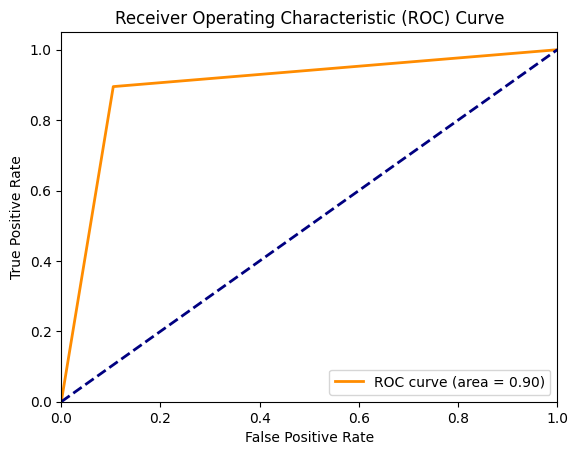

In [168]:
# Computing ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(Y_test, Y_pred)
roc_auc = roc_auc_score(Y_test, Y_pred)

# Plotting ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

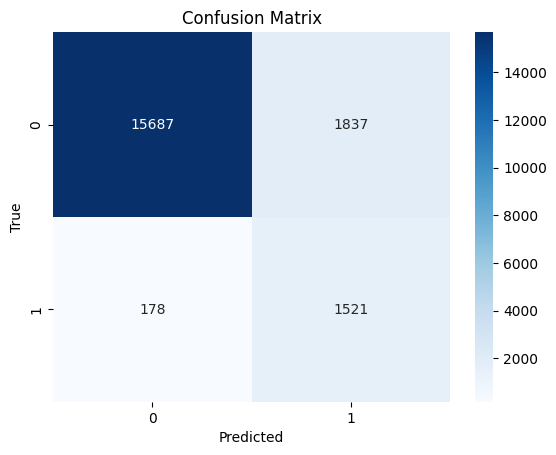

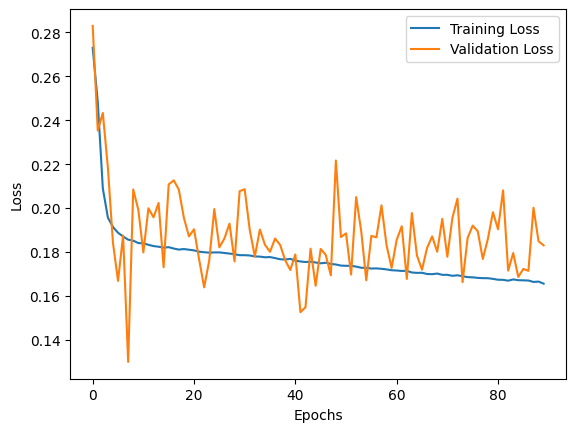

In [169]:
# Plot the confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Plot the training and validation loss for the classifier
plt.plot(classifier_training.history['loss'], label='Training Loss')
plt.plot(classifier_training.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# USING SHAP TO EXPLAIN THE IMPACTS OF FEATURES ON THE MODEL

In [170]:
# Use SHAP to explain the model's predictions
explainer = shap.Explainer(final_model, X_train_encoded)
shap_values = explainer(X_test_encoded)

PermutationExplainer explainer: 19224it [42:41,  7.49it/s]                                                             


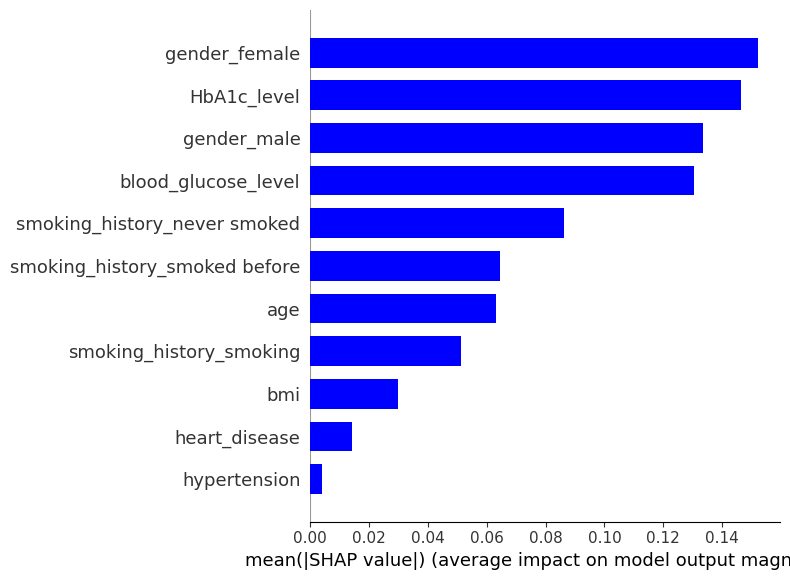

In [186]:
shap.summary_plot(shap_values, X_test_encoded, plot_type = 'bar' , feature_names=data.columns[:-1], color = 'blue')

# VALUES FOR THE FEATURES

In [214]:
feature_names=data.columns[:-1]
# Convert SHAP values to DataFrame
shap_values_df = pd.DataFrame(shap_values_array, columns=feature_names)

# Calculate mean absolute SHAP values for each feature
mean_abs_shap_values = shap_values_df.abs().mean()

# Sort by mean absolute SHAP value
mean_abs_shap_values_sorted = mean_abs_shap_values.sort_values(ascending=False)

# Display feature names and their mean absolute SHAP values
print(mean_abs_shap_values_sorted)

gender_female                    0.152051
HbA1c_level                      0.146551
gender_male                      0.133544
blood_glucose_level              0.130567
smoking_history_never smoked     0.086373
smoking_history_smoked before    0.064634
age                              0.063002
smoking_history_smoking          0.051232
bmi                              0.029743
heart_disease                    0.014222
hypertension                     0.003979
dtype: float64


## Dropping the least important four features

PermutationExplainer explainer: 19224it [12:55, 24.60it/s]                                                             


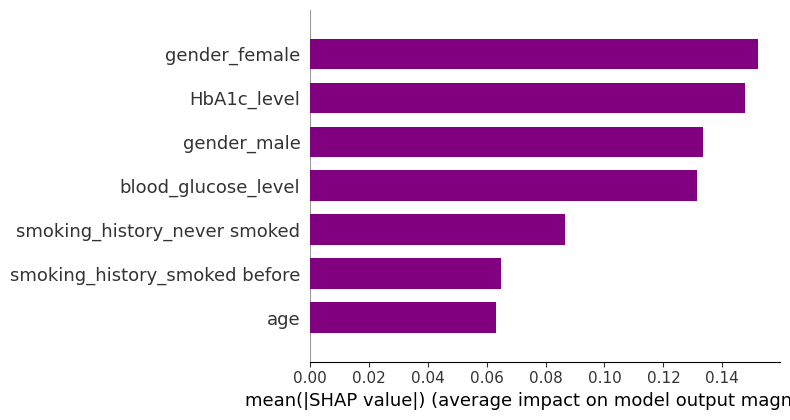

In [205]:
new_shap_values = explainer.shap_values(X_test_encoded)

# Calculating the mean absolute SHAP values for each feature
mean_abs_shap_values = np.mean(np.abs(new_shap_values), axis=0)

# Identifying the indices of the four least important features
least_important_indices = np.argsort(mean_abs_shap_values)[:4]

# Dropping the least important features from the SHAP values and feature names
X_test_encoded_dropped = np.delete(X_test_encoded, least_important_indices, axis=1)
shap_values_dropped = np.delete(new_shap_values, least_important_indices, axis=1)
feature_names_dropped = np.delete(data.columns[:-1], least_important_indices)

# Plotting the SHAP summary plot without the least important features
shap.summary_plot(shap_values_dropped, X_test_encoded_dropped, feature_names=feature_names_dropped, plot_type= 'bar', color = 'purple')


# VISUALIZING THE POSITIVE AND NEGATIVE IMPACTS OF INPUT FEATURES ON THE MODEL USING THE Mean Absolute Shap Value Method
### RED Implies NEGATIVE Impact while GREEN implies POSITIVE Impact. This was done by setting a threshold of '0' mean. A feature has a positive impact if the Mean is greater than 0 and negative if the mean is lesser than 0

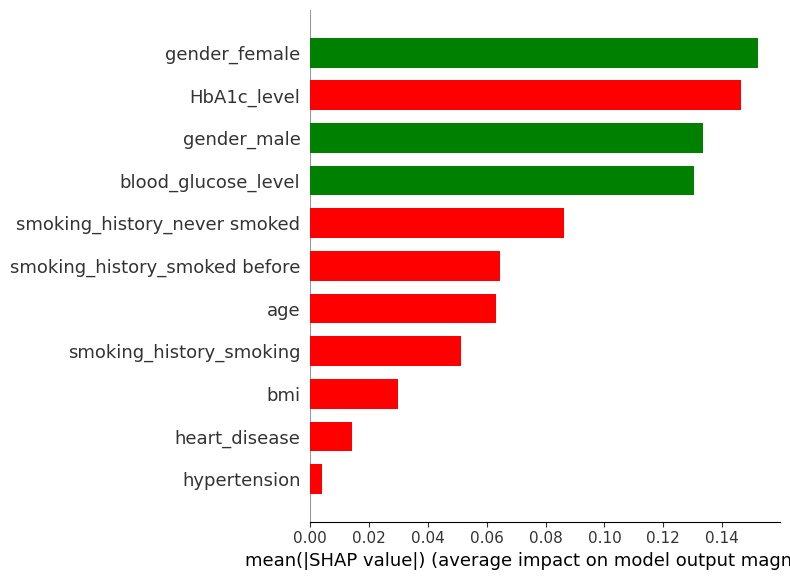

In [209]:
mean_shap_values = (shap_values.values).mean(0)
feature_colours = np.where(mean_shap_values > 0.0, 'green', 'red')

shap.summary_plot(shap_values, X_test_encoded, plot_type = 'bar' ,
                  feature_names=data.columns[:-1], color = feature_colours)

In [215]:
feature_names = data.columns[:-1] 

# Calculate mean SHAP values
mean_shap_values = np.mean(shap_values.values, axis=0)

# Create a DataFrame for easier handling
mean_shap_df = pd.DataFrame({
    'Feature': feature_names,
    'Mean_SHAP_Value': mean_shap_values
})

# Display the DataFrame
mean_shap_df

,Feature,Mean_SHAP_Value
0,age,-0.019173
1,hypertension,-0.001225
2,heart_disease,-0.006815
3,bmi,-0.003287
4,HbA1c_level,-0.111566
5,blood_glucose_level,-0.107890
6,smoking_history_never smoked,-0.014649
7,smoking_history_smoked before,0.006048
8,smoking_history_smoking,0.000314
9,gender_female,-0.034202


# Making Predictions

In [218]:
# New data for prediction
new_data = {
    'age': [80],
    'hypertension': [1],
    'heart_disease': [1],
    'bmi': [28.7],
    'HbA1c_level': [6.5],
    'blood_glucose_level': [150],
    'smoking_history_never smoked': [1],
    'smoking_history_smoked before' : [0],
    'smoking_history_smoking' : [0],
    'gender_female': [0],
    'gender_male' : [1],
}

new_data = pd.DataFrame(new_data)



new_data_scaled = scaler.transform(new_data)

# Make predictions
predictions = final_model.predict(new_data_scaled)

binary_predictions = (predictions > 0.5).astype(int)

# Print the predictions
if binary_predictions[0][0] == 1:
    print("Predicted class: Diabetic.")
else:
    print("Predicted class: Not diabetic")
print("Predicted probability:", predictions[0][0])

1/1 [==============================] - 0s 44ms/step
Predicted class: Diabetic.
Predicted probability: 0.9172059


In [173]:
final_model.save("diabetes_model.h5")


In [174]:
import os

model_path = "diabetes_model.h5"
model_size = os.path.getsize(model_path)  # Size in bytes
model_size_MB = model_size / (1024 * 1024)  # Size in megabytes

print(f"The size of the model is {model_size_MB:.2f} MB")


The size of the model is 0.06 MB
